# Project workflow

### 1. Select a diversified portfolio of 11 S&P500 listed stocks, one per each of the 11 different sectors that comprise index (e.g.,    Health Care, Financials, Consumer Discretionary, Industrials), and download market data from 01-01-2010 to 31-12-2022.

### Sectors and listed stocks selected:

1. Health Care: Johnson & Johnson (Ticker: JNJ)
2. Financials: JPMorgan Chase & Co. (Ticker: JPM)
3. Consumer Discretionary: Amazon.com Inc. (Ticker: AMZN)
4. Industrials: Boeing Co. (Ticker: BA)
5. Information Technology: Apple Inc. (Ticker: AAPL)
6. Communication Services: Facebook Inc. (Ticker: META)
7. Consumer Staples: Procter & Gamble Co. (Ticker: PG)
8. Utilities: NextEra Energy Inc. (Ticker: NEE)
9. Real Estate: American Tower Corp. (Ticker: AMT)
10. Materials: Ecolab Inc. (Ticker: ECL)
11. Energy: Exxon Mobil Corp. (Ticker: XOM)


In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%pip install empyrial
from copy import deepcopy
from empyrial import empyrial, Engine

start_date = "2010-01-01"
end_date = "2022-12-31"

# Define the list of tickers
stocks = ["JNJ", "JPM", "AMZN", "BA", "AAPL", "META", "PG", "NEE", "AMT", "ECL", "XOM"]


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.


In [2]:
def download_stockdata():
    stock_data = {}
    for stock in stocks:
      stock_data[stock] = yf.download(stock, start=start_date, end=end_date)['Adj Close']
    return pd.DataFrame(stock_data)

df = download_stockdata()
df = df.dropna() #dropar NaN (não há trading days)
df

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,JNJ,JPM,AMZN,BA,AAPL,META,PG,NEE,AMT,ECL,XOM
Date,,,,,,,,,,,
2012-05-18,45.925266,24.257761,10.692500,57.249626,16.078026,38.230000,45.434017,11.924849,51.277493,55.287231,51.395615
2012-05-21,46.012268,23.547920,10.905500,59.427013,17.014732,34.029999,45.341042,11.961536,52.145119,56.588531,51.755222
2012-05-22,46.048504,24.634413,10.766500,59.178650,16.884081,31.000000,45.169376,12.036756,51.794910,56.992977,51.698425
2012-05-23,45.867264,24.815495,10.864000,59.253155,17.296051,32.000000,44.625771,11.913836,51.882458,56.966610,51.755222
2012-05-24,46.189339,24.605434,10.762000,59.104141,17.137196,33.029999,44.754524,11.930349,52.415768,57.230373,52.114811
...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,173.632370,127.480034,85.250000,189.059998,131.299820,118.040001,148.841446,82.524773,205.554001,143.197693,106.052940
2022-12-27,173.583450,127.926727,83.040001,189.399994,129.477585,116.879997,150.138535,82.358093,205.563751,144.099274,107.526436
2022-12-28,172.830154,128.625870,81.820000,188.380005,125.504539,115.620003,148.197784,81.534515,204.783997,142.464584,105.760185


### 2. After selection and uploaded, next step was to data cleaning and transform for each stock, compute the daily, weekly, and monthly log-return using the adjusted closing price information.

In [3]:
#df.shift(1) é t-1 (atrasado 1 dia/período)
daily_returns = (df/df.shift(1) - 1).dropna()
daily_log_returns = np.log(daily_returns+1).dropna()

weekly_returns = df.resample('W-FRI').ffill().pct_change().dropna()
weekly_log_returns = np.log(weekly_returns+1).dropna()

monthly_returns = df.resample('M').ffill().pct_change().dropna()
monthly_log_returns = np.log(monthly_returns+1).dropna()

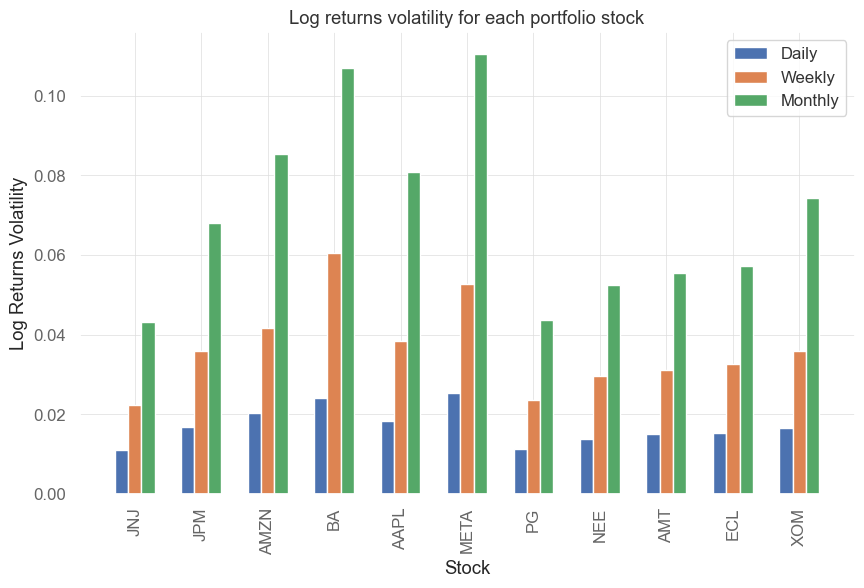

In [4]:
# Create an array for the x-axis (stock names)
x = np.arange(len(stocks))

# Set the width of the bars
bar_width = 0.2

# Create the grouped bar plot
plt.bar(x - bar_width, daily_log_returns.std(), bar_width, label='Daily')
plt.bar(x, weekly_log_returns.std(), bar_width, label='Weekly')
plt.bar(x + bar_width, monthly_log_returns.std(), bar_width, label='Monthly')

# Set the labels for the axes
plt.xlabel('Stock')
plt.ylabel('Log Returns Volatility')
plt.title('Log returns volatility for each portfolio stock')
plt.xticks(x, stocks, rotation=90)
plt.legend()
plt.show()

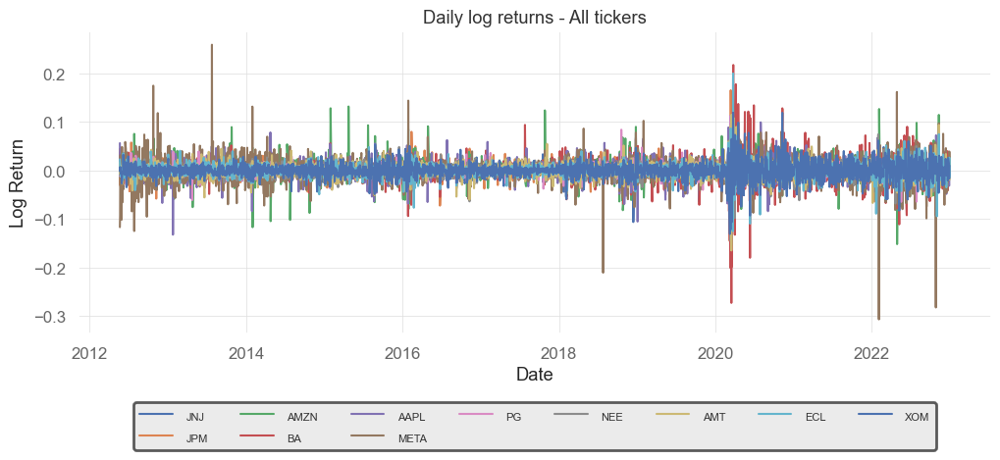

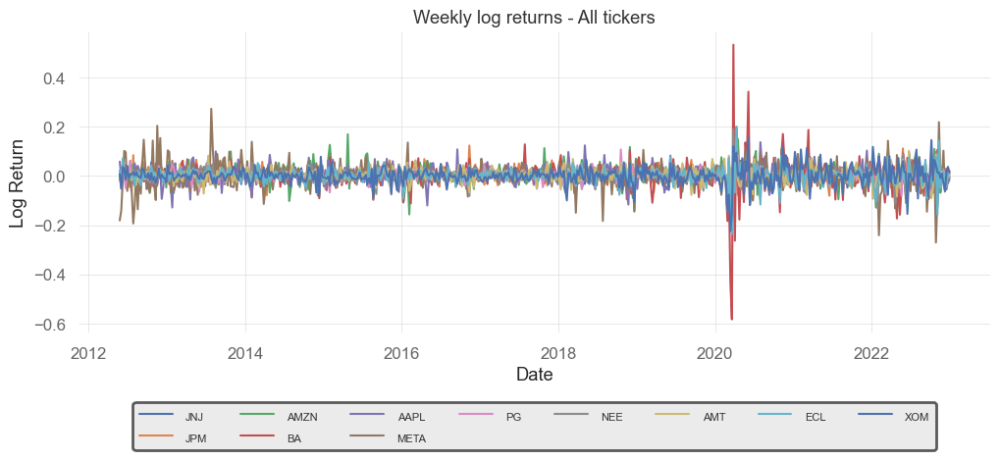

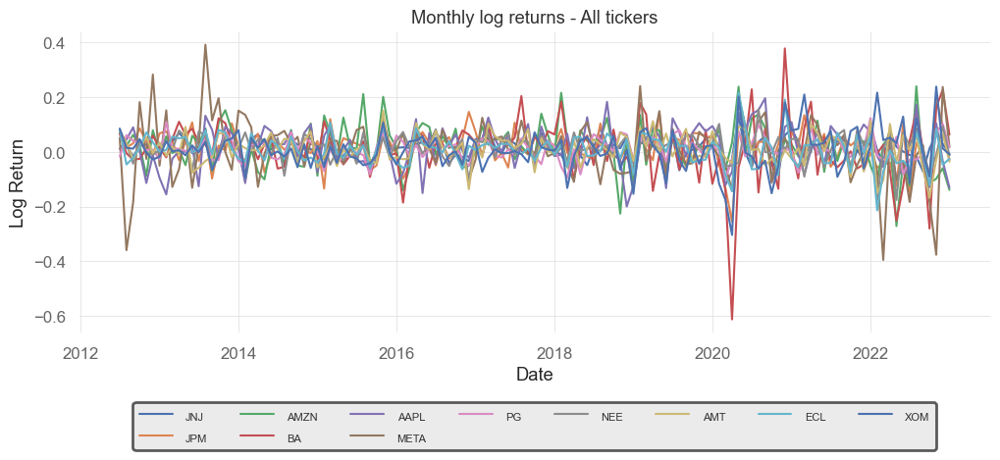

In [5]:
for returns_obj in [('Daily', daily_log_returns), ('Weekly', weekly_log_returns), ('Monthly', monthly_log_returns)]:
    period, log_returns = returns_obj
    plt.figure(figsize=(12, 4))

    for stock in stocks:
        plt.plot(log_returns.index, log_returns[stock], label = stock)

    plt.title(f'{period} log returns - All tickers')
    plt.xlabel('Date')
    plt.ylabel('Log Return')
    legend = plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=8)
    for text in legend.get_texts(): text.set_fontsize(8)

    frame = legend.get_frame()
    frame.set_facecolor('0.9')  # Cor de fundo
    frame.set_linewidth(2)      # Largura da borda
    frame.set_edgecolor('0.2')  # Cor da borda
    
    plt.grid(True)
    plt.show()


### 3. Empirically investigate the following financial market returns stylized facts for the three data frequencies (daily, weekly, monthly data):

- Portfolio correlation (Diversification)


<AxesSubplot:>

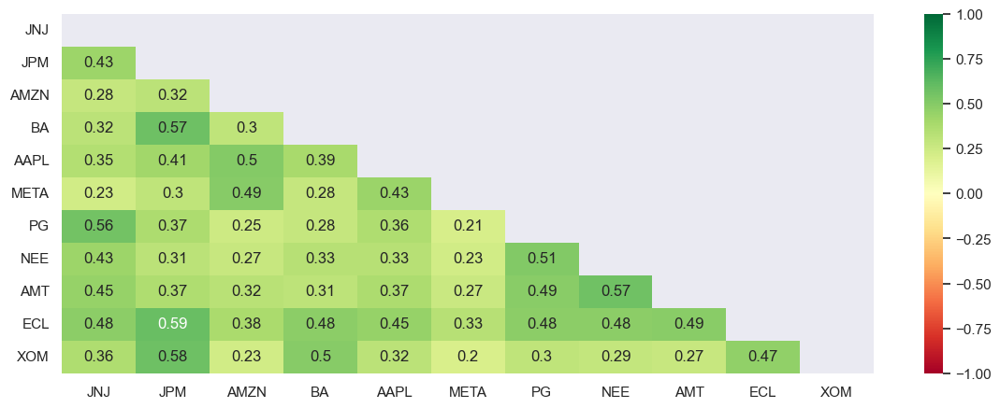

In [6]:
stocks_correlation = daily_log_returns.corr()

#Plot graphic
mask = np.zeros_like(stocks_correlation)
mask[np.triu_indices_from(mask)] = True
sns.set(rc={'figure.figsize':(14,5)})
sns.heatmap(stocks_correlation, cmap='RdYlGn', vmax=1, vmin=-1, center=0, mask = mask, annot=True)


- Absence of auto-correlation

<Figure size 1400x500 with 0 Axes>

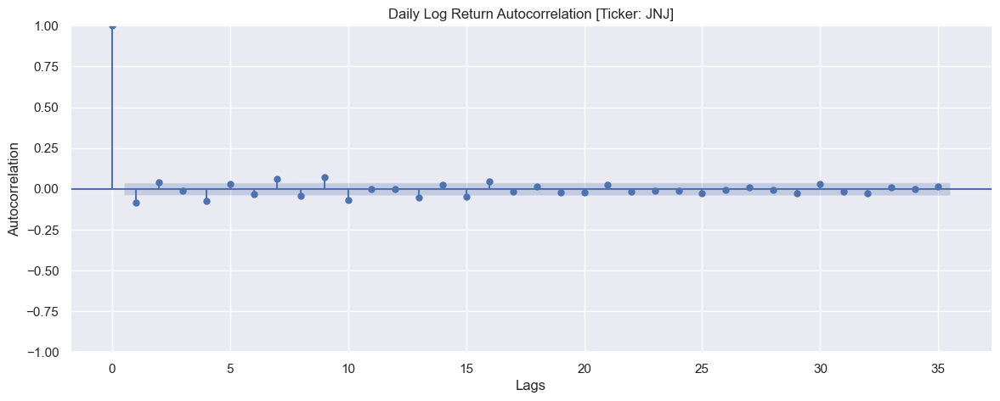

<Figure size 1400x500 with 0 Axes>

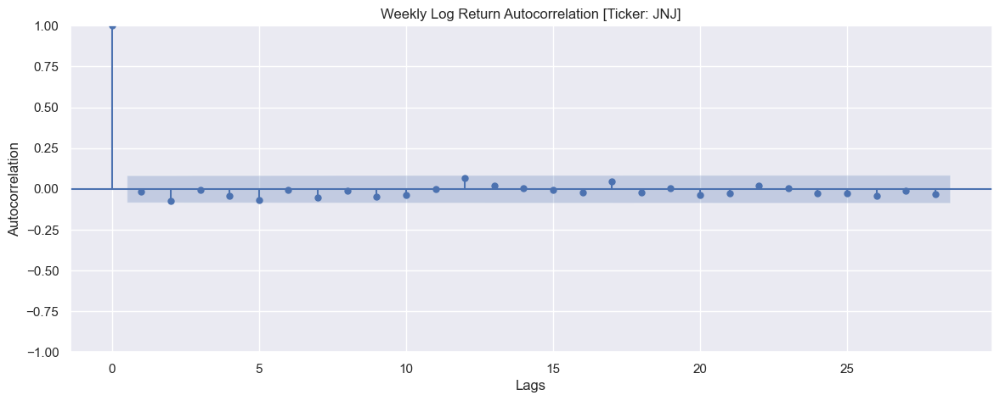

<Figure size 1400x500 with 0 Axes>

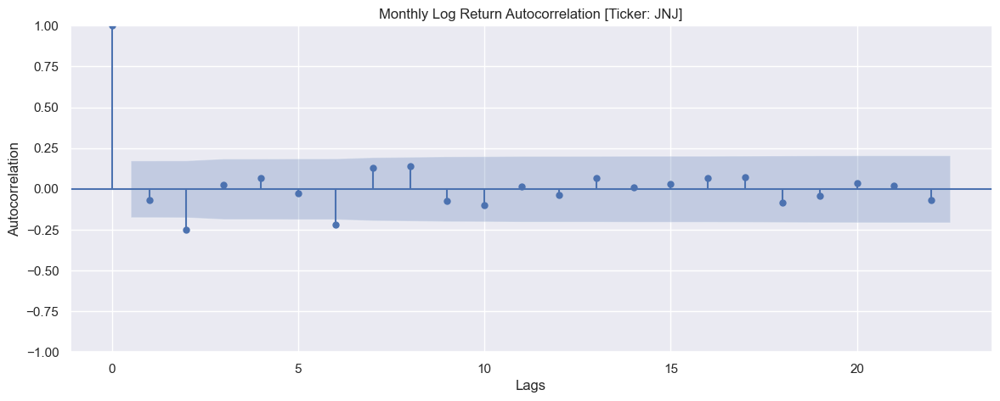

<Figure size 1400x500 with 0 Axes>

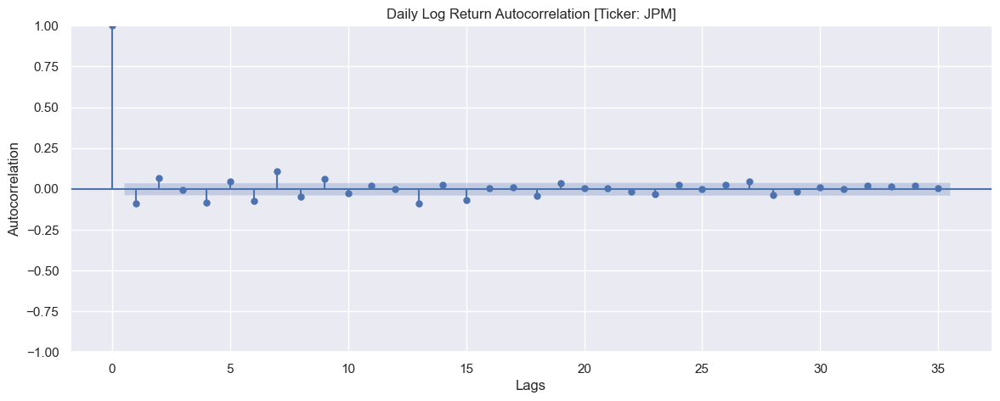

<Figure size 1400x500 with 0 Axes>

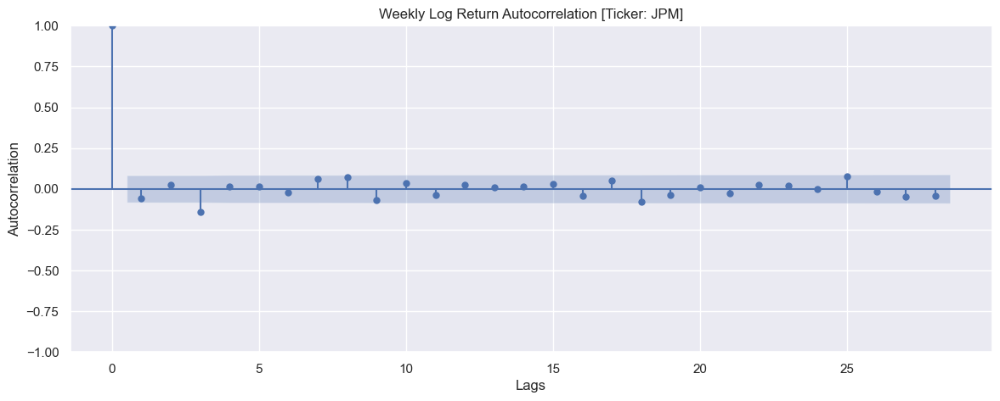

<Figure size 1400x500 with 0 Axes>

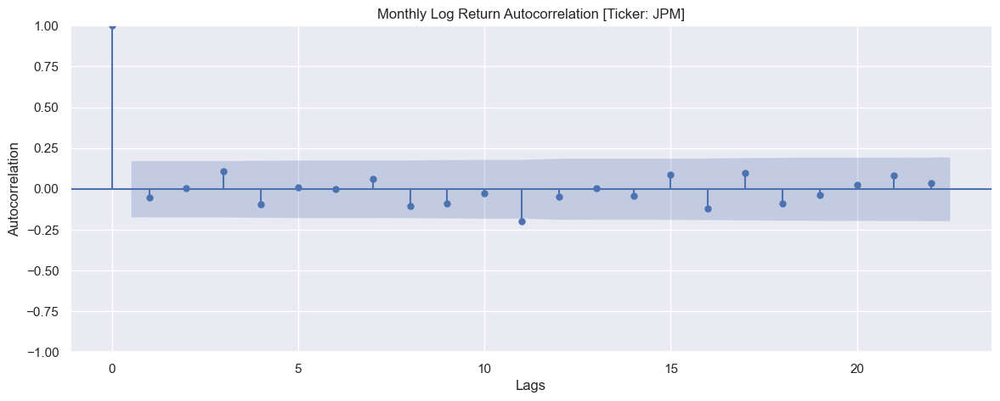

<Figure size 1400x500 with 0 Axes>

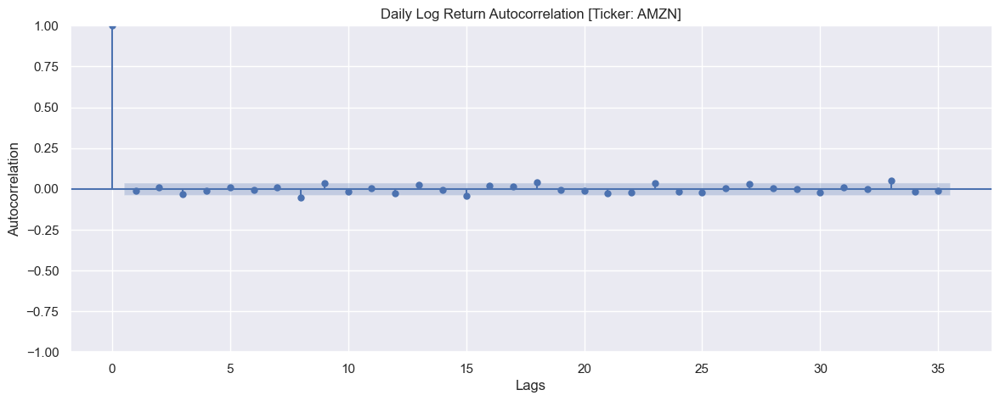

<Figure size 1400x500 with 0 Axes>

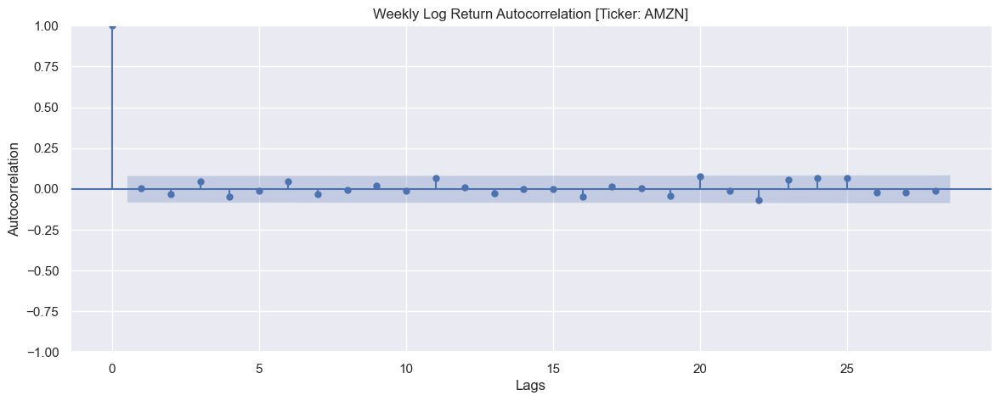

<Figure size 1400x500 with 0 Axes>

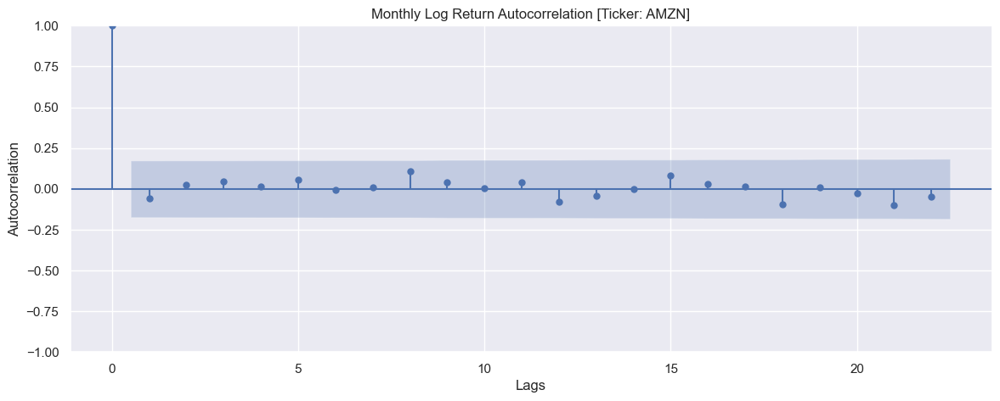

<Figure size 1400x500 with 0 Axes>

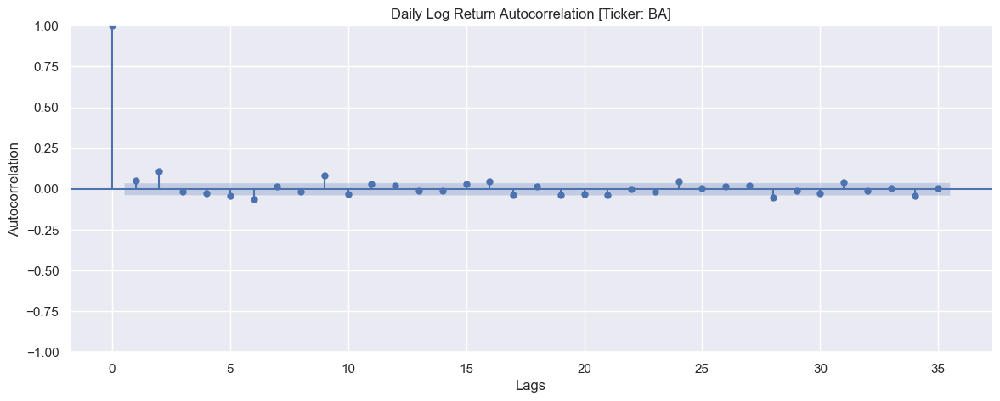

<Figure size 1400x500 with 0 Axes>

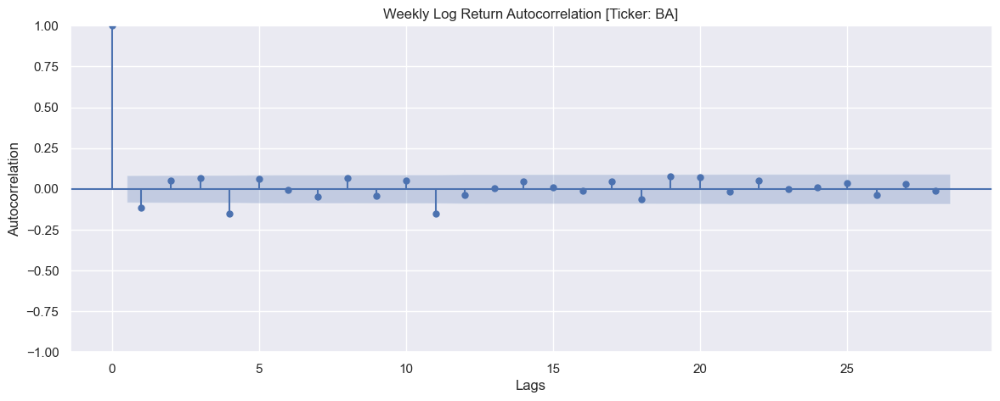

<Figure size 1400x500 with 0 Axes>

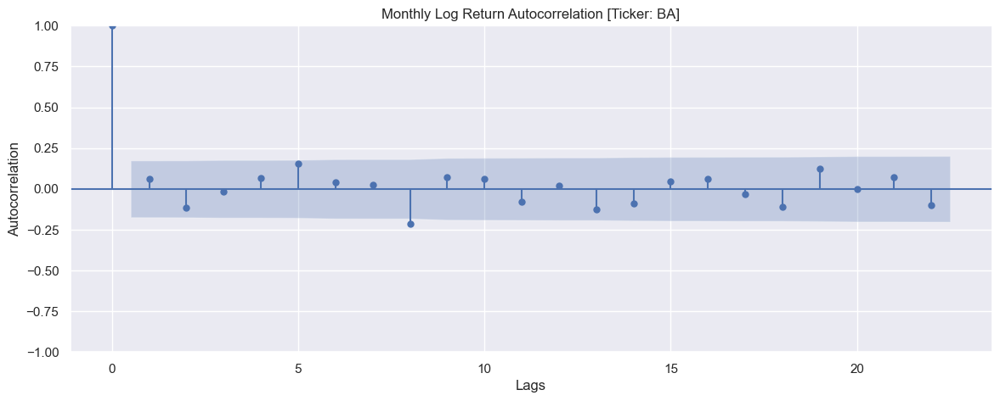

<Figure size 1400x500 with 0 Axes>

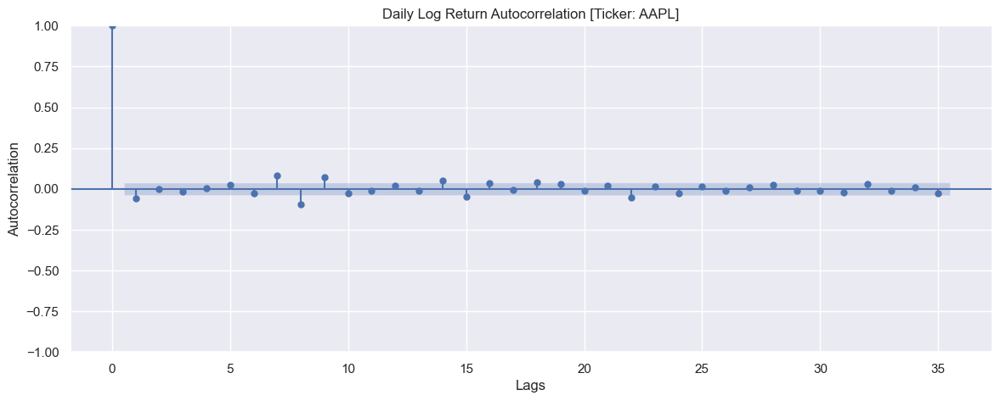

<Figure size 1400x500 with 0 Axes>

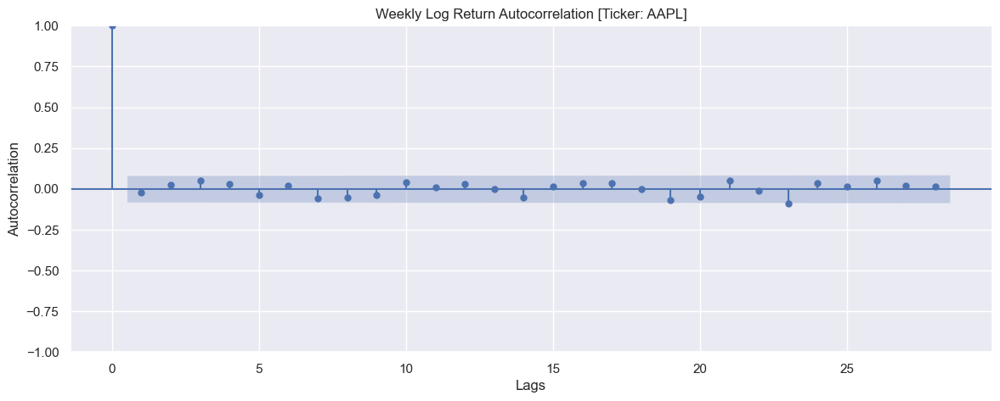

<Figure size 1400x500 with 0 Axes>

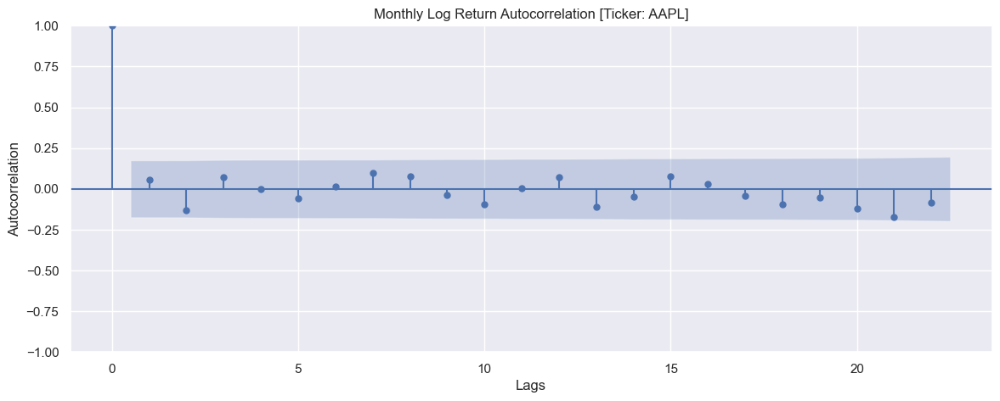

<Figure size 1400x500 with 0 Axes>

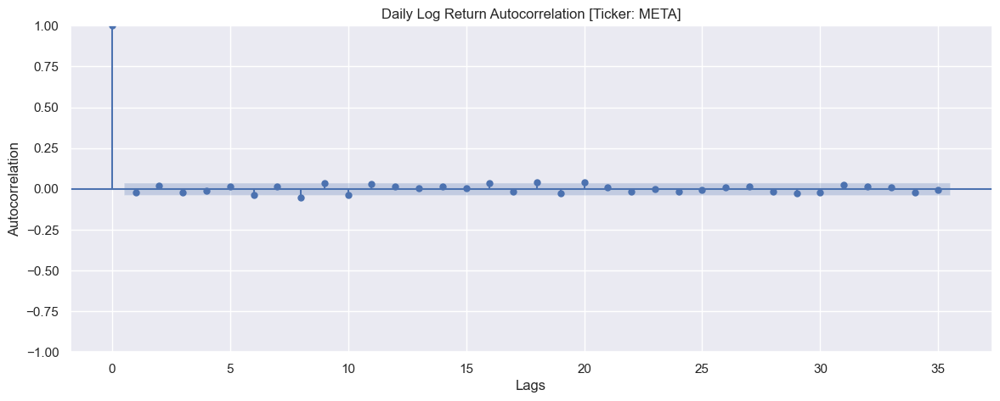

<Figure size 1400x500 with 0 Axes>

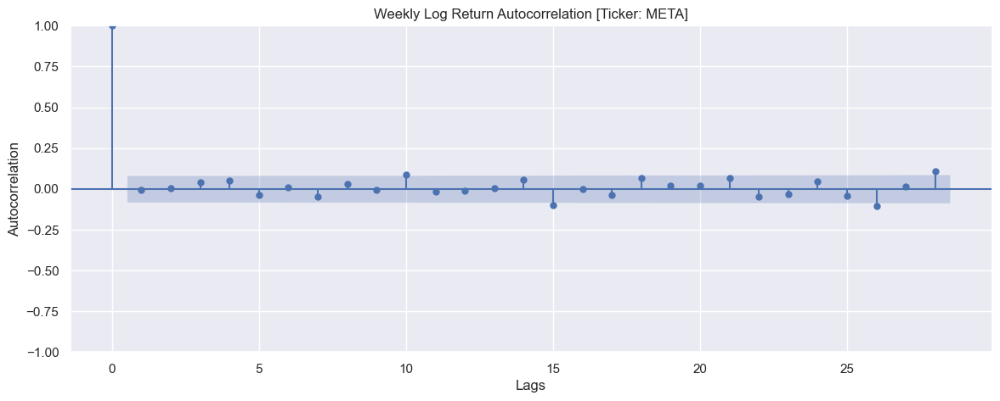

<Figure size 1400x500 with 0 Axes>

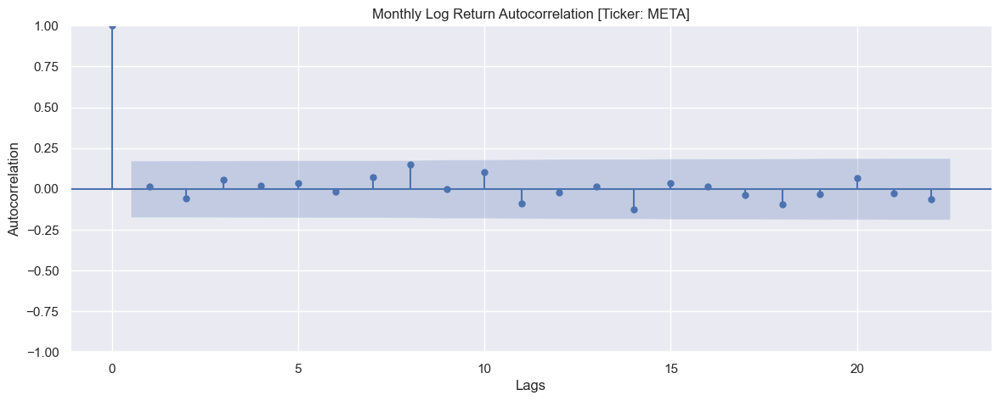

<Figure size 1400x500 with 0 Axes>

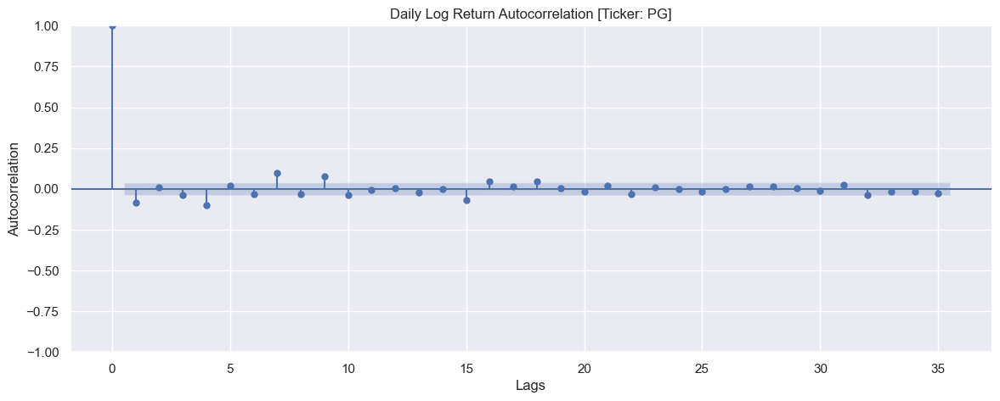

<Figure size 1400x500 with 0 Axes>

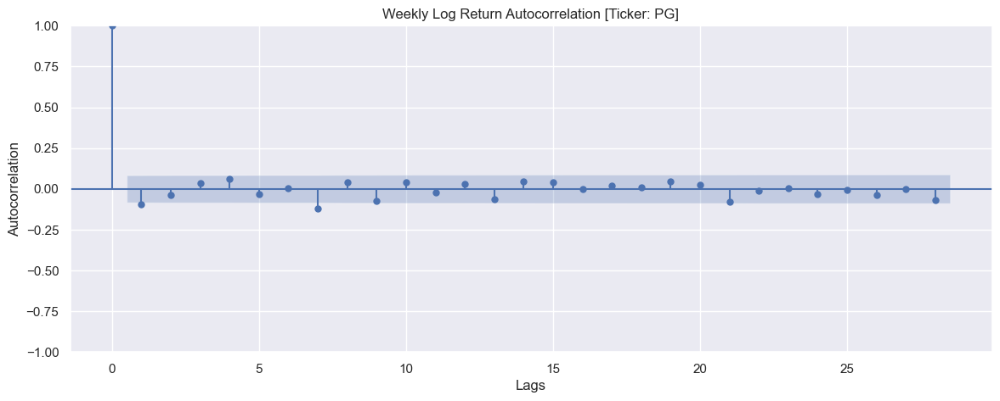

<Figure size 1400x500 with 0 Axes>

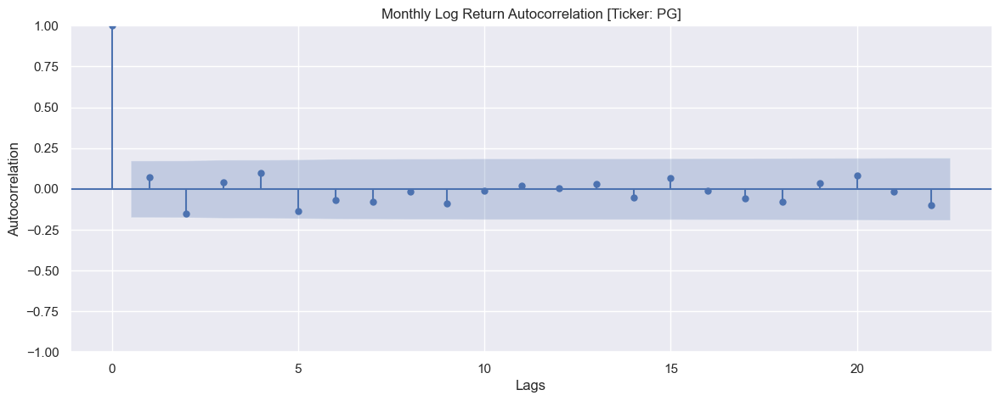

<Figure size 1400x500 with 0 Axes>

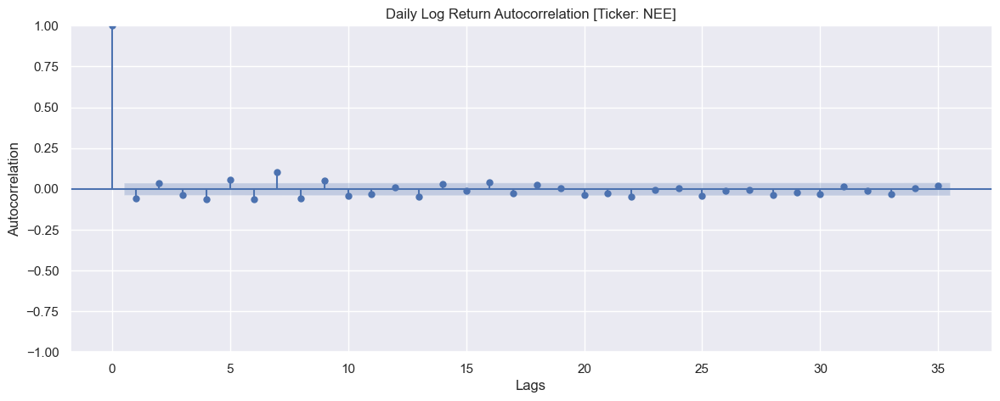

<Figure size 1400x500 with 0 Axes>

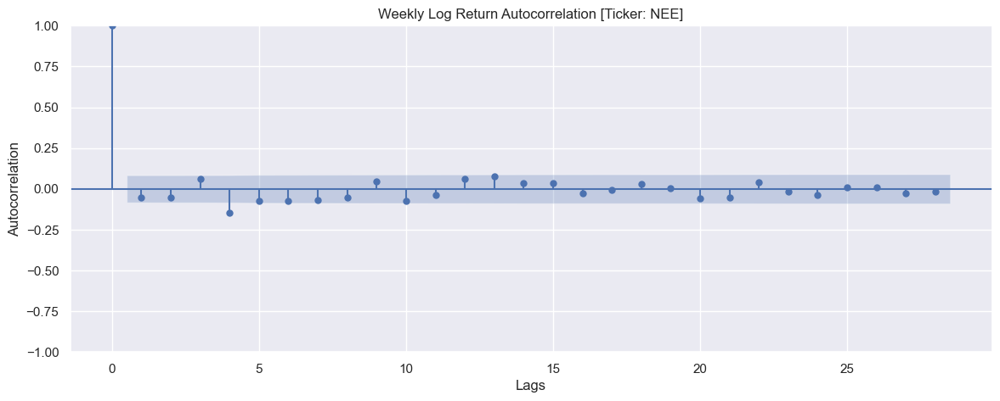

<Figure size 1400x500 with 0 Axes>

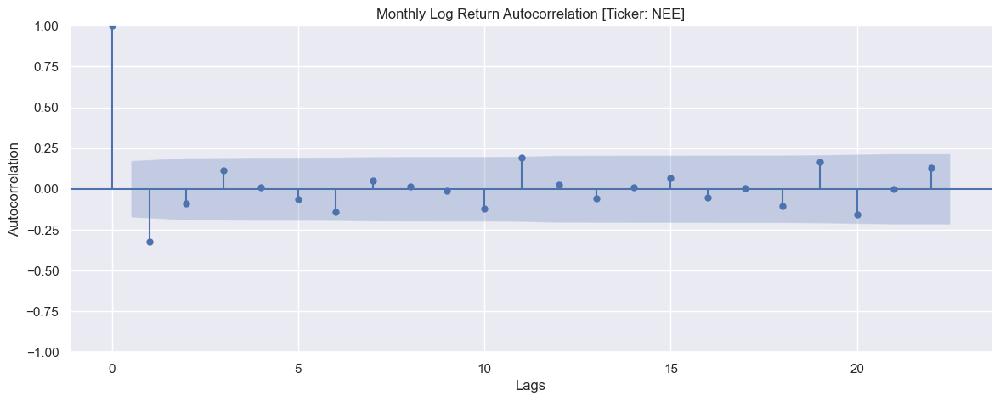

<Figure size 1400x500 with 0 Axes>

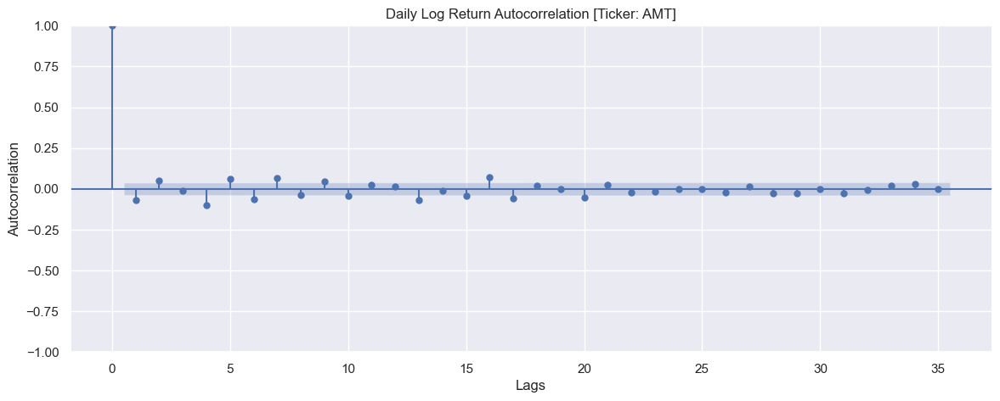

<Figure size 1400x500 with 0 Axes>

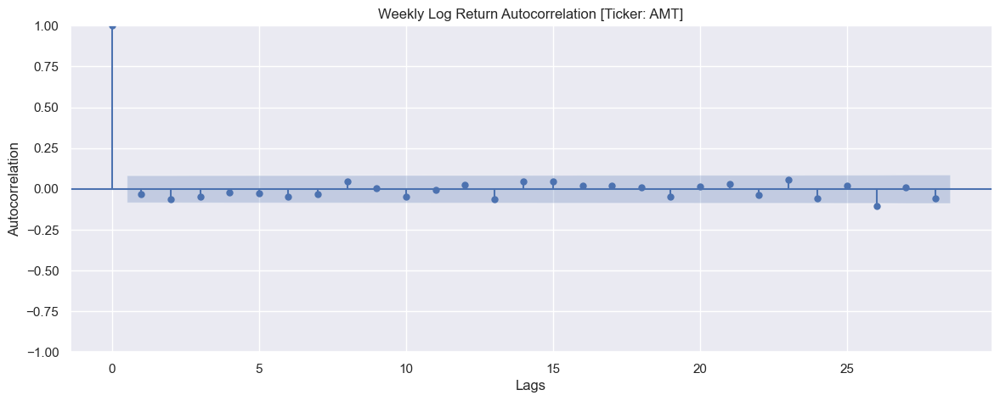

<Figure size 1400x500 with 0 Axes>

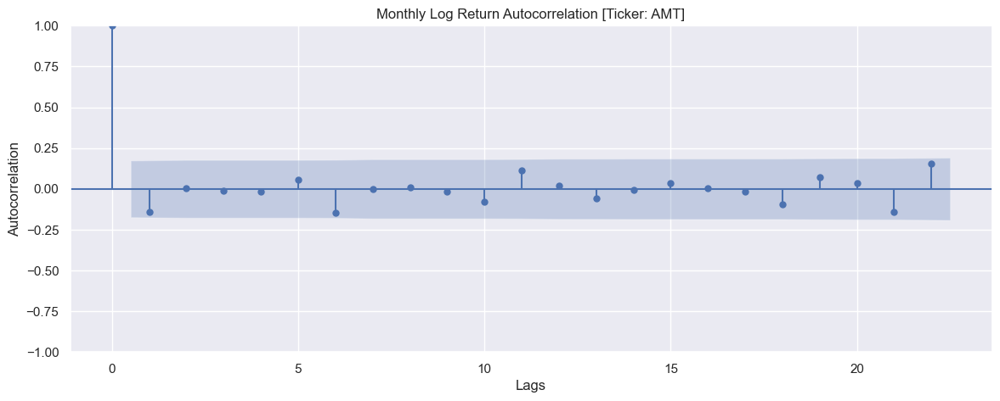

<Figure size 1400x500 with 0 Axes>

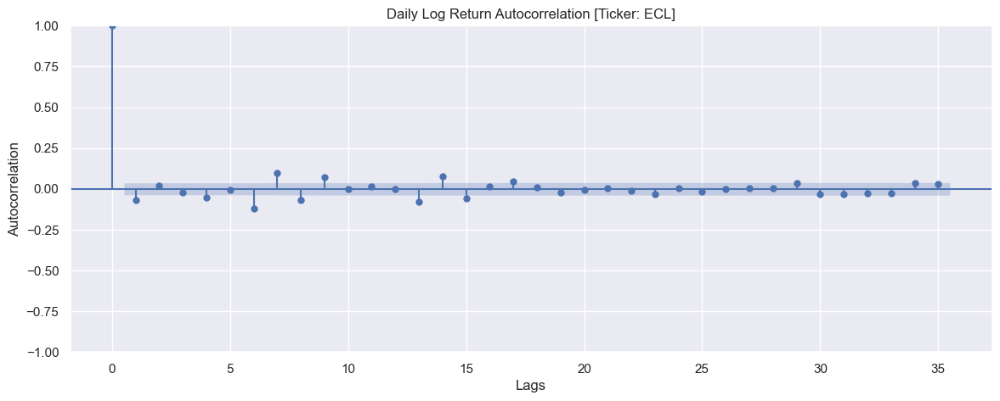

<Figure size 1400x500 with 0 Axes>

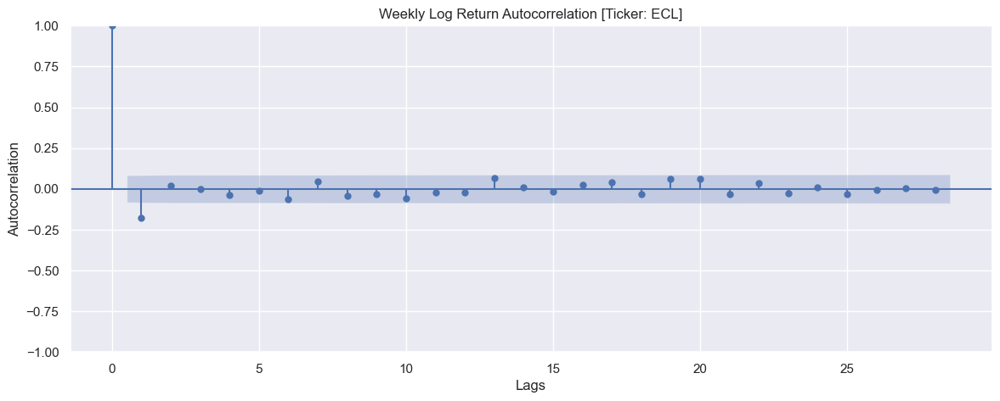

<Figure size 1400x500 with 0 Axes>

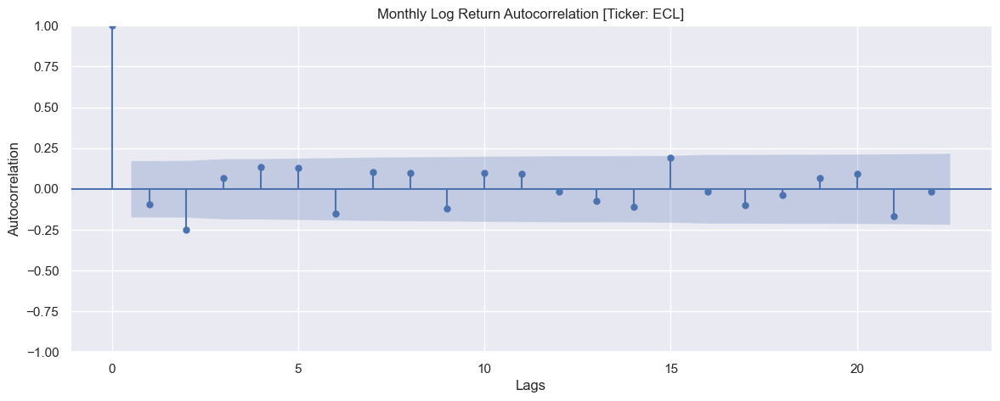

<Figure size 1400x500 with 0 Axes>

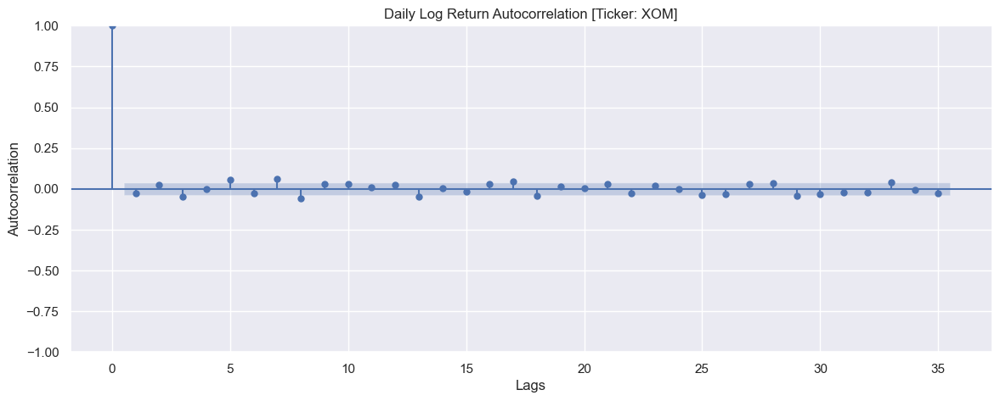

<Figure size 1400x500 with 0 Axes>

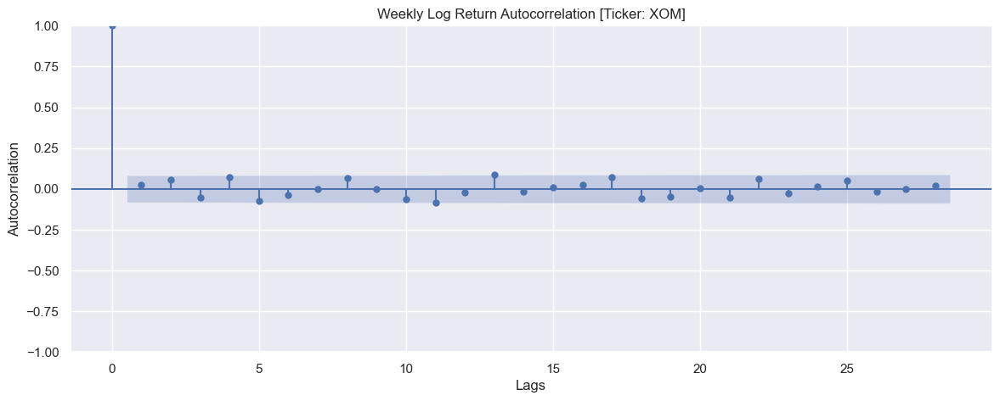

<Figure size 1400x500 with 0 Axes>

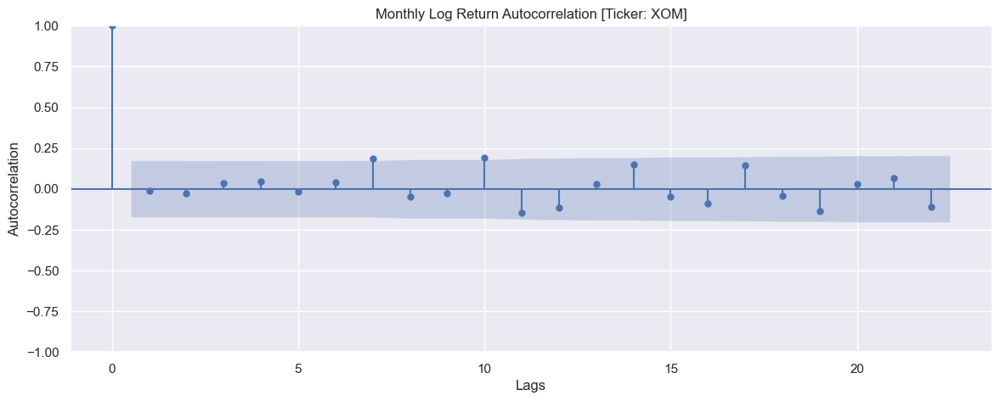

In [7]:
from statsmodels.graphics.tsaplots import plot_acf

# Plotar o gráfico de autocorrelação diária para cada ativo/stock
for stock in stocks:
    for returns_obj in [("Daily", daily_log_returns), ("Weekly", weekly_log_returns), ("Monthly", monthly_log_returns)]:
        plt.figure()
        stock_autocorr = returns_obj[1][stock].dropna()
        fig = plot_acf(stock_autocorr, title=f"{returns_obj[0]} Log Return Autocorrelation [Ticker: {stock}]") #Lag = desfazamento da data
        fig.axes[0].set_xlabel('Lags')
        fig.axes[0].set_ylabel('Autocorrelation')
        plt.show()

- The unconditional distribution of daily returns does not follow the normal distribution / Fat Tails

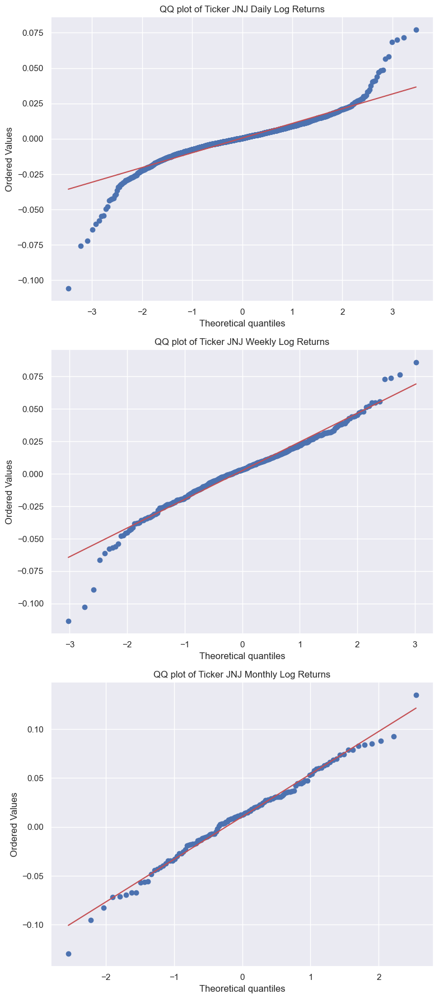

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker JNJ (Daily): 0.9032001495361328, p-value (%): 3.448916978571091e-36 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker JNJ (Weekly): 0.9694318175315857, p-value (%): 2.439535462528397e-07 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker JNJ (Monthly): 0.9913853406906128, p-value (%): 62.310510873794556 -> Follows normal distribution: True


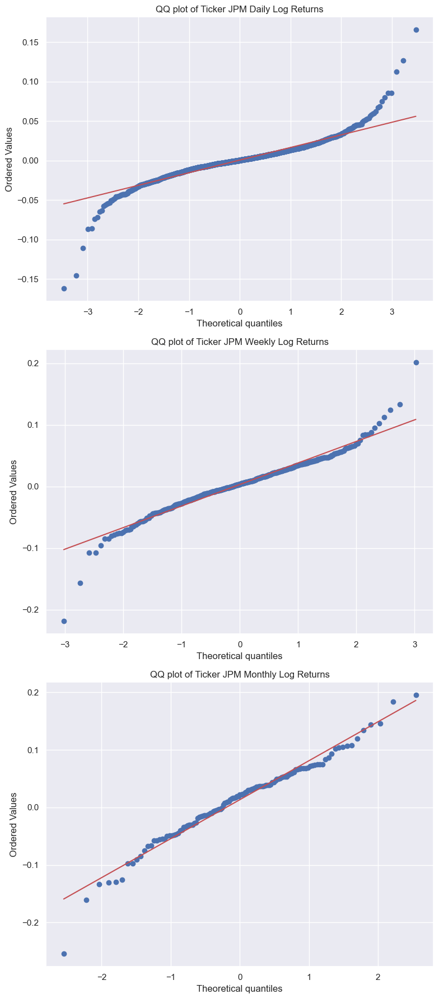

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker JPM (Daily): 0.9004826545715332, p-value (%): 1.3694766577581577e-36 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker JPM (Weekly): 0.9513232707977295, p-value (%): 1.5320547564964815e-10 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker JPM (Monthly): 0.9749061465263367, p-value (%): 1.8354784697294235 -> Follows normal distribution: False


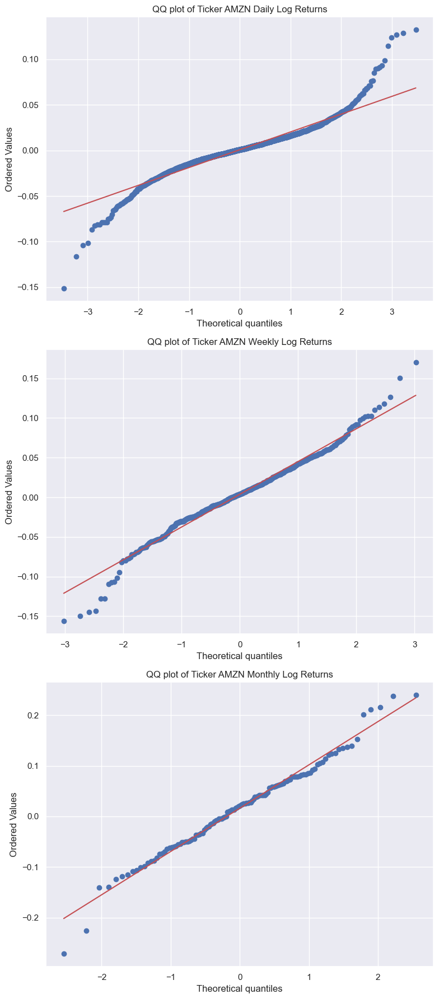

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker AMZN (Daily): 0.9254580736160278, p-value (%): 1.6424387039054355e-32 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker AMZN (Weekly): 0.9796711206436157, p-value (%): 5.689002477993199e-05 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker AMZN (Monthly): 0.9852556586265564, p-value (%): 18.566256761550903 -> Follows normal distribution: True


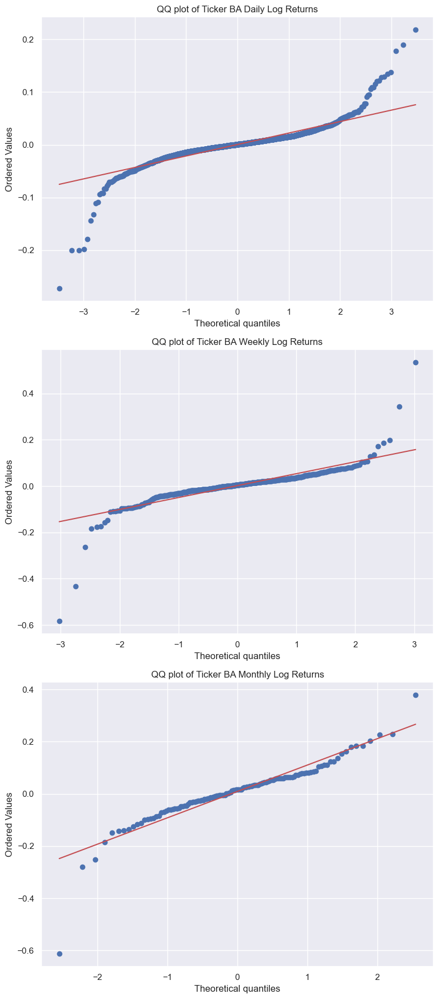

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker BA (Daily): 0.821064829826355, p-value (%): 0.0 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker BA (Weekly): 0.7287188768386841, p-value (%): 4.825034396159219e-27 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker BA (Monthly): 0.8851723670959473, p-value (%): 1.829523377239184e-06 -> Follows normal distribution: False


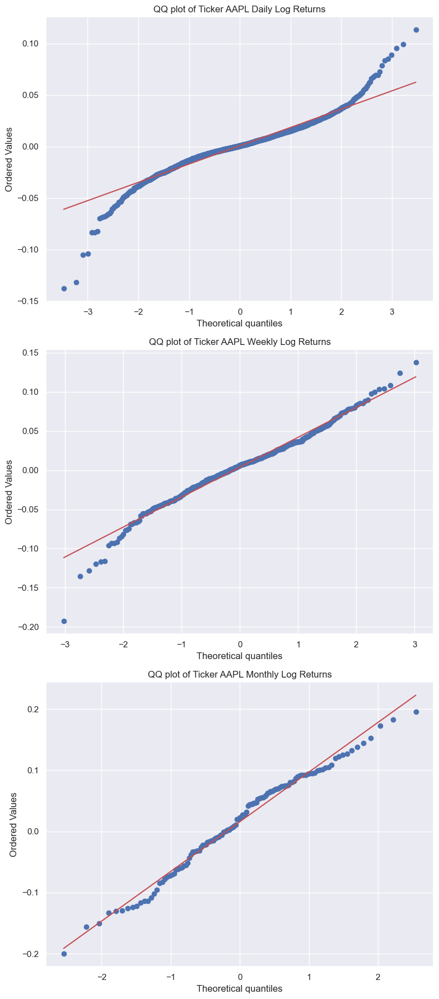

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker AAPL (Daily): 0.9386571049690247, p-value (%): 6.790740351635342e-30 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker AAPL (Weekly): 0.9787676930427551, p-value (%): 3.32746310505172e-05 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker AAPL (Monthly): 0.9835940599441528, p-value (%): 12.840454280376434 -> Follows normal distribution: True


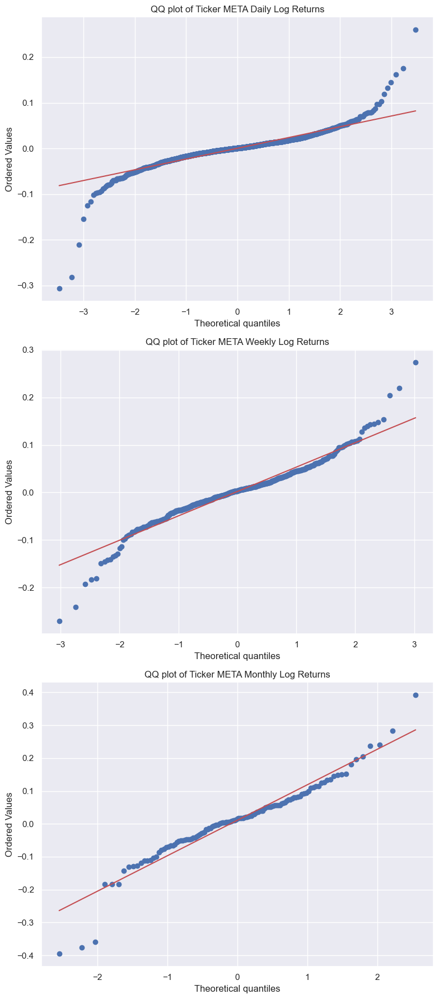

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker META (Daily): 0.8593466877937317, p-value (%): 8.688050478813866e-42 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker META (Weekly): 0.9405755996704102, p-value (%): 4.441524662705636e-12 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker META (Monthly): 0.9396554827690125, p-value (%): 0.0024453216610709205 -> Follows normal distribution: False


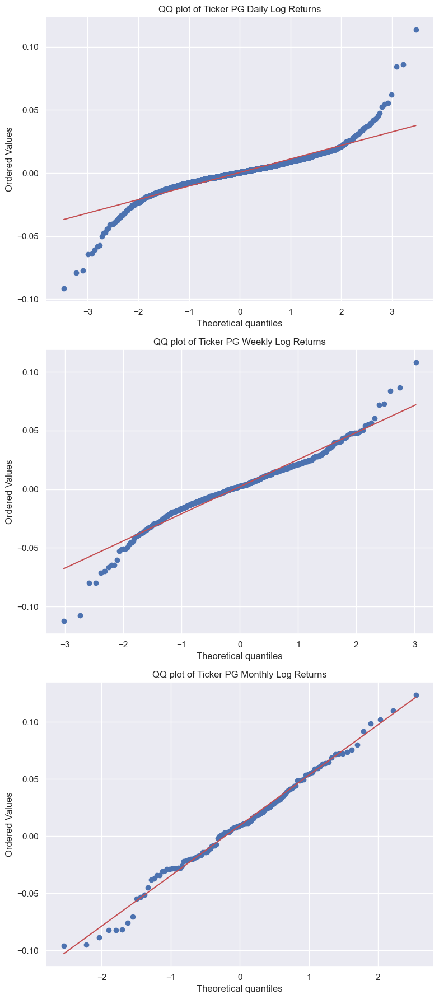

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker PG (Daily): 0.8882704377174377, p-value (%): 2.7283701489943486e-38 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker PG (Weekly): 0.9570378661155701, p-value (%): 1.2516269271012348e-09 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker PG (Monthly): 0.9900897145271301, p-value (%): 49.95186626911163 -> Follows normal distribution: True


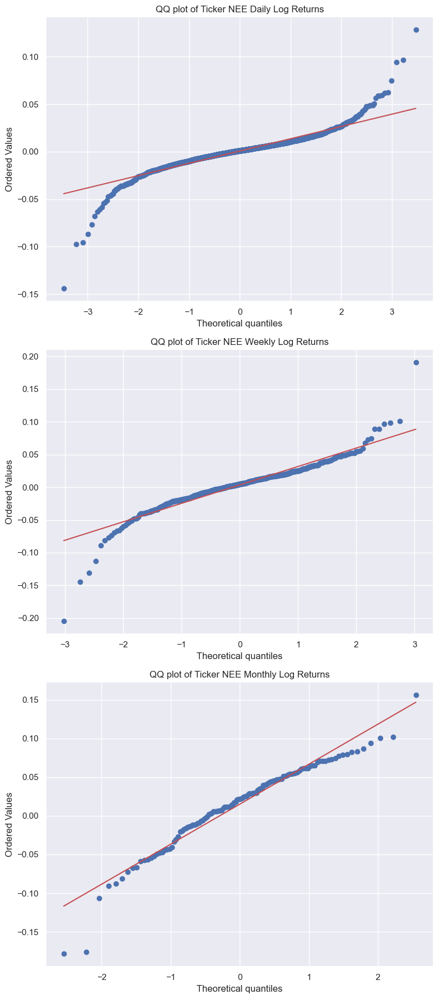

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker NEE (Daily): 0.8890283703804016, p-value (%): 3.443298612508227e-38 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker NEE (Weekly): 0.9021284580230713, p-value (%): 2.329171653309212e-16 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker NEE (Monthly): 0.9550048112869263, p-value (%): 0.03354509244672954 -> Follows normal distribution: False


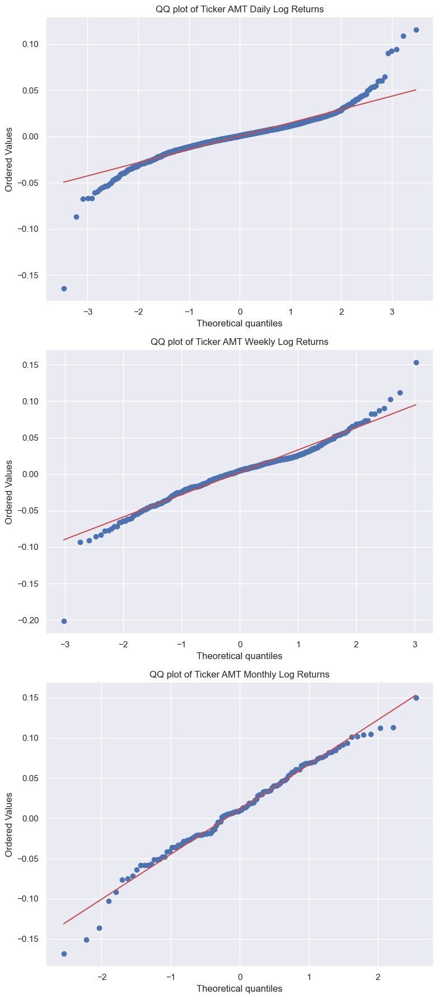

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker AMT (Daily): 0.9172259569168091, p-value (%): 5.812669614670141e-34 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker AMT (Weekly): 0.9562735557556152, p-value (%): 9.354563998420495e-10 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker AMT (Monthly): 0.9856259822845459, p-value (%): 20.134325325489044 -> Follows normal distribution: True


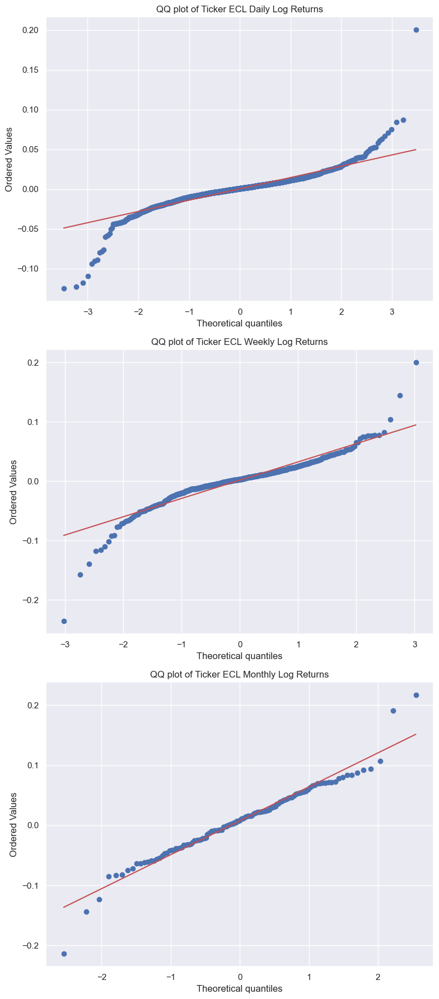

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker ECL (Daily): 0.8660715222358704, p-value (%): 4.974609548353101e-41 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker ECL (Weekly): 0.8847906589508057, p-value (%): 6.8097786100095786e-18 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker ECL (Monthly): 0.9644197821617126, p-value (%): 0.2028896939009428 -> Follows normal distribution: False


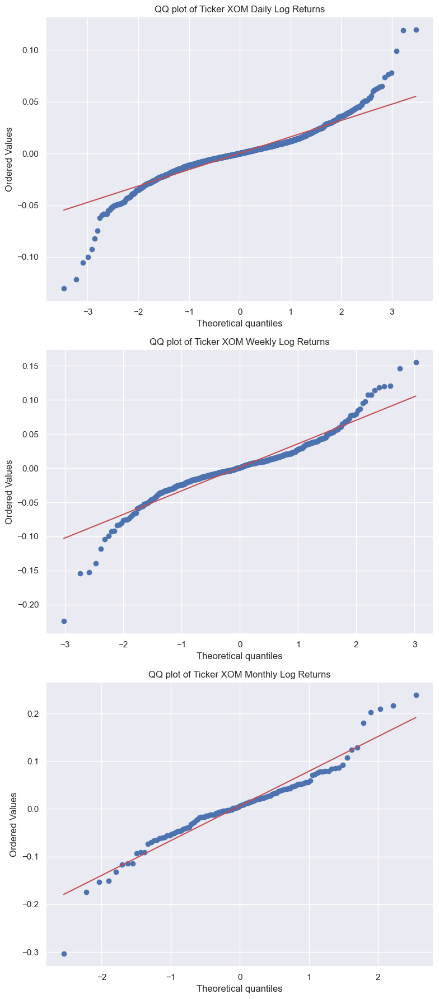

Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker XOM (Daily): 0.9155758619308472, p-value (%): 3.0720985953650585e-34 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker XOM (Weekly): 0.9168379306793213, p-value (%): 6.803098640594603e-15 -> Follows normal distribution: False
Shapiro-Wilk test statistic [data covered by test] (5.0% confidence level) for ticker XOM (Monthly): 0.9429565072059631, p-value (%): 0.0041707055061124265 -> Follows normal distribution: False


In [8]:
from scipy.stats import shapiro, probplot
import scipy.stats as stats
import warnings
warnings.filterwarnings("ignore")

confidence_level = 0.05

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import probplot, shapiro

# Assuming you have daily_log_returns, weekly_log_returns, and monthly_log_returns defined elsewhere

for stock in stocks:

    # Create a 3x1 grid of subplots for Daily, Weekly, and Monthly Log Returns
    fig, axs = plt.subplots(3, 1, figsize=(8, 18))

    # Daily Log Returns
    probplot(daily_log_returns[stock], dist='norm', plot=axs[0])
    axs[0].set_title(f'QQ plot of Ticker {stock} Daily Log Returns')

    # Weekly Log Returns
    probplot(weekly_log_returns[stock], dist='norm', plot=axs[1])
    axs[1].set_title(f'QQ plot of Ticker {stock} Weekly Log Returns')

    # Monthly Log Returns
    probplot(monthly_log_returns[stock], dist='norm', plot=axs[2])
    axs[2].set_title(f'QQ plot of Ticker {stock} Monthly Log Returns')

    # Adjust spacing between subplots
    plt.tight_layout()

    plt.show()

    # Perform Shapiro-Wilk tests and print the results for each frequency
    for freq, log_returns in [("Daily", daily_log_returns[stock]), ("Weekly", weekly_log_returns[stock]), ("Monthly", monthly_log_returns[stock])]:
        stat, p_value = shapiro(log_returns)
        print(f'Shapiro-Wilk test statistic [data covered by test] ({confidence_level*100}% confidence level) for ticker {stock} ({freq}): {stat}, p-value (%): {p_value*100} -> Follows normal distribution: {p_value >= confidence_level}')


- The return distribution is asymmetric or negatively skewed

Quando a assimetria é negativa, isso indica que a distribuição dos retornos diários está inclinada para a esquerda em relação à média.
A cauda esquerda da distribuição é mais longa, o que significa que eventos de alto retorno negativo são mais comuns do que o esperado em uma distribuição normal.


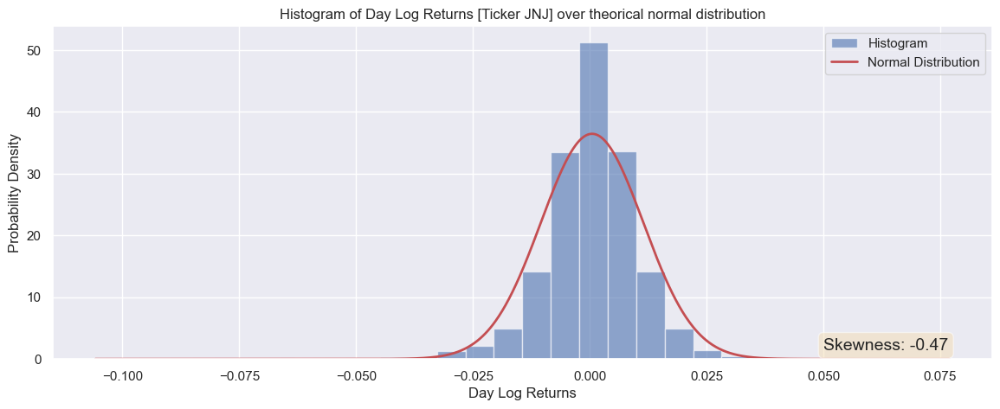

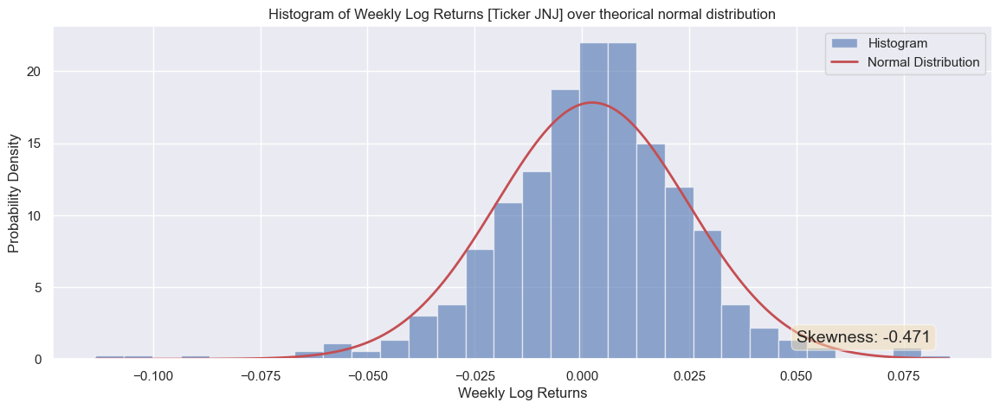

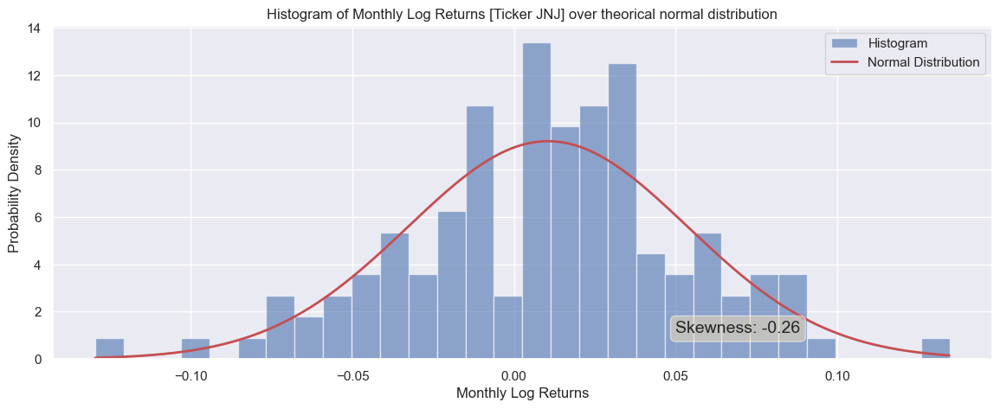

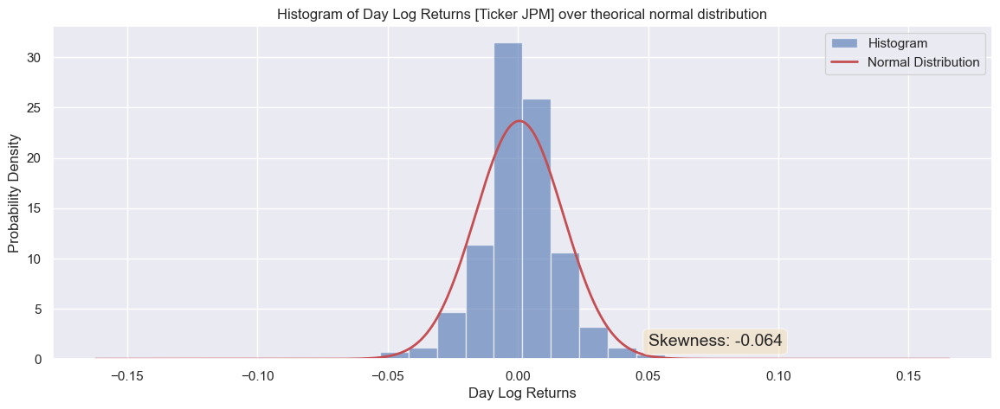

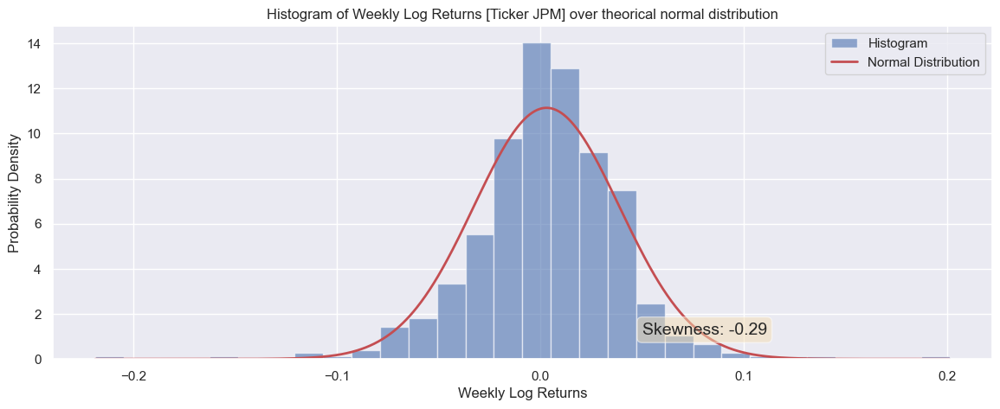

...

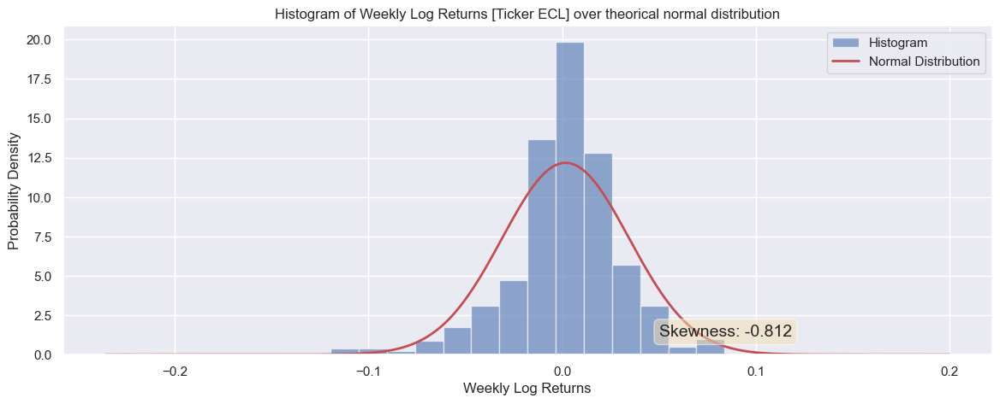

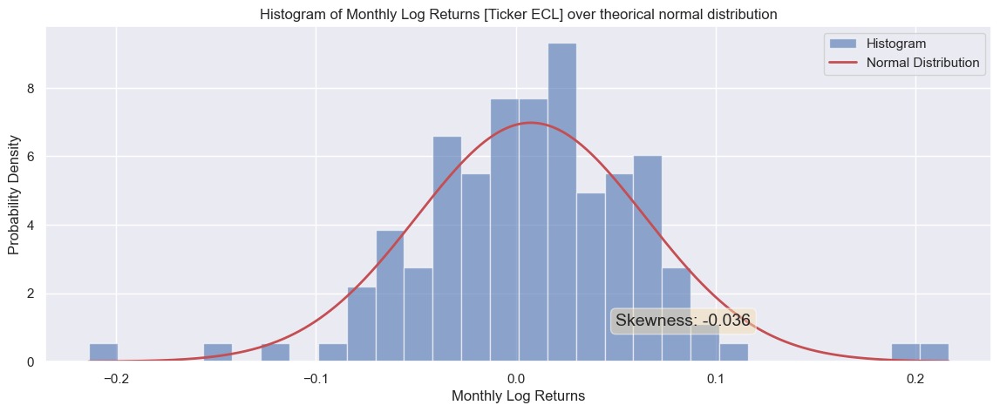

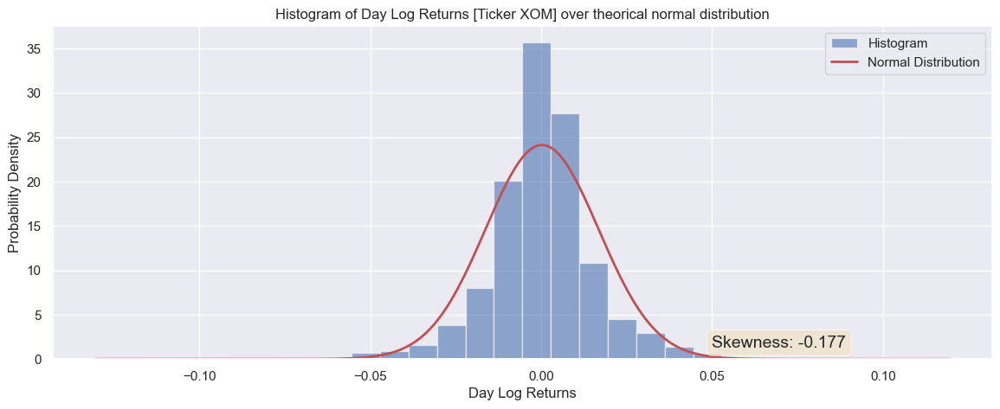

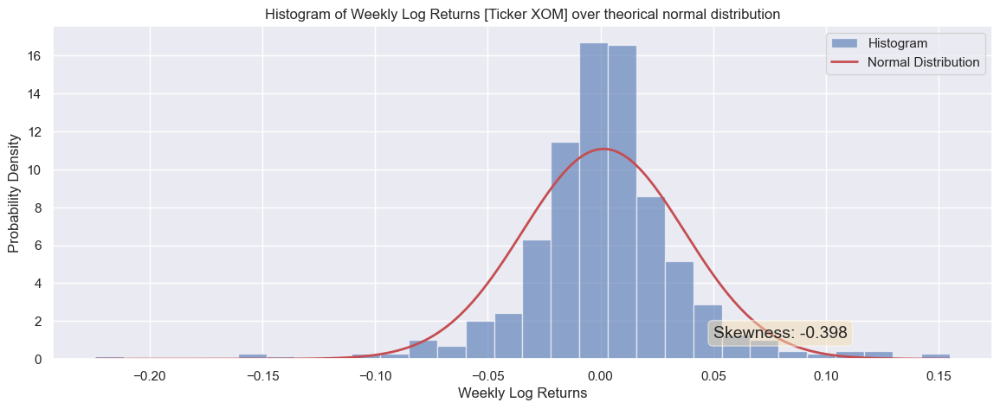

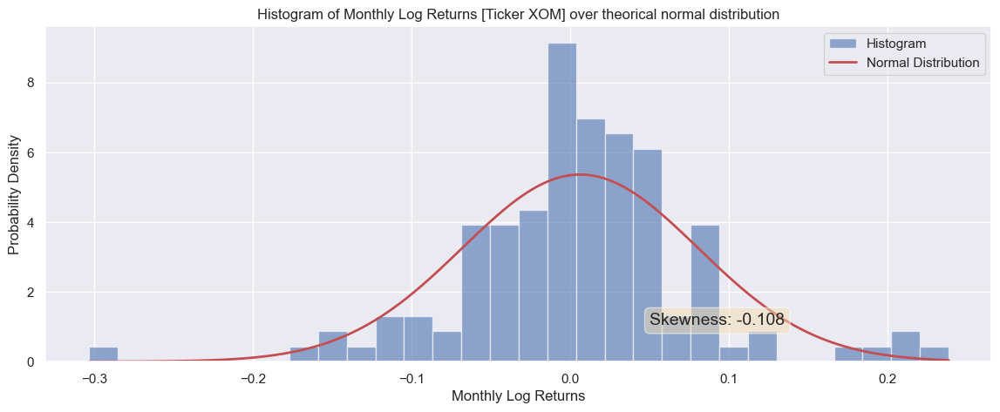

In [9]:
print('Quando a assimetria é negativa, isso indica que a distribuição dos retornos diários está inclinada para a esquerda em relação à média.')
print('A cauda esquerda da distribuição é mais longa, o que significa que eventos de alto retorno negativo são mais comuns do que o esperado em uma distribuição normal.')

return_types_array = {
    "Day Log Returns": daily_log_returns,
    "Weekly Log Returns": weekly_log_returns,
    "Monthly Log Returns": monthly_log_returns
}

for stock in stocks:
  for return_type, return_array in return_types_array.items():
    returns = return_array[stock]
    returns_mean = return_array[stock].mean()
    returns_std = return_array[stock].std()
    skewness = return_array[stock].skew()

    plt.hist(returns, bins=30, density=True, alpha=0.6, color='b', label='Histogram')
    x = np.linspace(returns.min(), returns.max(), 1000) # Create a range of values for the x-axis

    # Plot the theoretical normal Gaussian curve
    pdf = stats.norm.pdf(x, returns_mean, returns_std)
    plt.plot(x, pdf, 'r', linewidth=2, label='Normal Distribution')

    #Plot da caixa skewness
    plt.xlabel(return_type)
    plt.ylabel('Probability Density')
    plt.title(f'Histogram of {return_type} [Ticker {stock}] over theorical normal distribution')
    plt.legend()
    plt.text(0.05, 0.95, f"Skewness: {round(skewness, 3)}", fontsize=14, verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    plt.show()





- Volatility Clustering

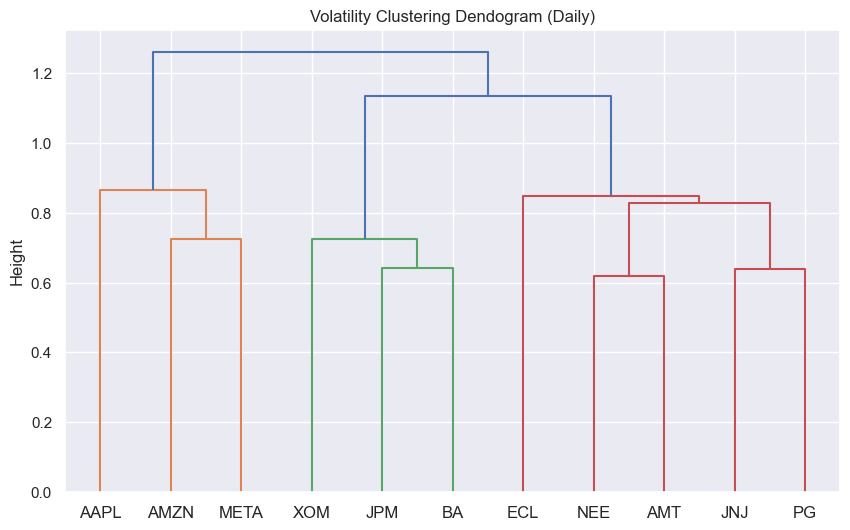

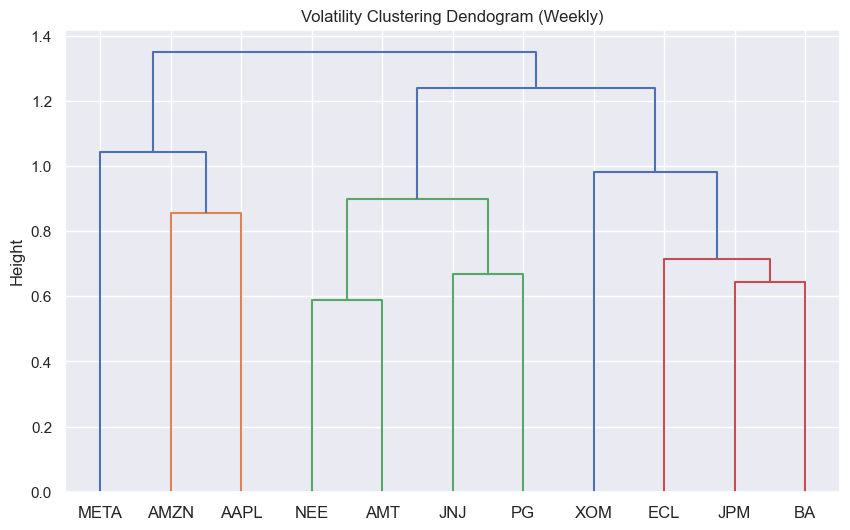

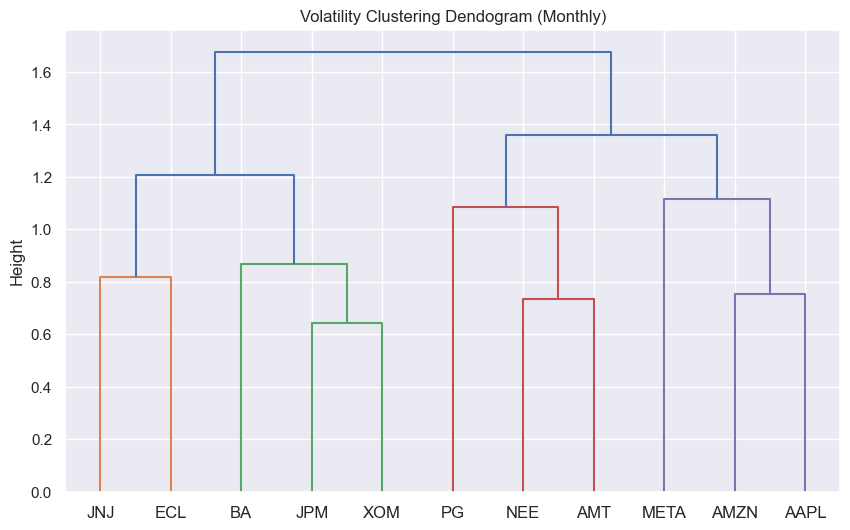

In [10]:
from scipy.cluster import hierarchy

# Calculando a matriz de correlação da volatilidade
for returns in [(daily_log_returns, "Daily"), (weekly_log_returns, "Weekly"), (monthly_log_returns, "Monthly")]:
    corr_matrix, returns_type = returns[0].corr(), returns[1]

    # ivp --> inverse variance portfolio
    def get_ivp(corr_matrix):
        # Obtém o portfólio de variância inversa a partir da diagonal da matriz de covariância
        inv_diag = 1 / np.diag(corr_matrix)
        weights = inv_diag / np.sum(inv_diag)
        return weights

    def get_cluster_var(corr_matrix, c_items):
        # Calcula a variância do cluster a partir do portfólio de variância inversa acima
        cov_mat_slice = corr_matrix[np.ix_(c_items, c_items)]
        weights = get_ivp(cov_mat_slice)
        c_var = np.dot(weights.T, np.dot(cov_mat_slice, weights))
        return c_var

    def get_rec_bipart(corr_matrix, sort_ix):
        # Mantendo o vetor de pesos no ambiente global
        global w
        w = np.ones(corr_matrix.shape[1])
        
        # Executando a função recursiva
        recur_fun(corr_matrix, sort_ix)
        return w

    def recur_fun(corr_matrix, sort_ix):
        global w
        if len(sort_ix) > 1:
            # Dividindo os ativos em dois grupos
            m = len(sort_ix) // 2
            g1 = sort_ix[:m]
            g2 = sort_ix[m:]
            
            # Calculando os pesos para cada grupo
            w_g1 = get_ivp(corr_matrix[np.ix_(g1, g1)])
            w_g2 = get_ivp(corr_matrix[np.ix_(g2, g2)])
            
            # Atualizando os pesos globais
            w[sort_ix] = np.concatenate((w_g1, w_g2))
            
            # Chamando a função recursivamente para ambos os grupos
            recur_fun(corr_matrix, g1)
            recur_fun(corr_matrix, g2)
            
    def recur_fun2(corr_matrix, sort_ix):
        # Obter a primeira metade de sort_ix que é uma ordem de cluster
        sub_idx = sort_ix[:len(sort_ix)//2]
        
        # Dividir a ordenação em primeira metade e segunda metade
        c_items_0 = sub_idx
        c_items_1 = sort_ix[len(sub_idx):]
        
        # Calcular as variâncias de cluster das matrizes de covariância indexadas
        # na primeira metade e segunda metade da ordenação
        c_var_0 = get_cluster_var(corr_matrix, c_items_0)
        c_var_1 = get_cluster_var(corr_matrix, c_items_1)
        alpha = 1 - c_var_0 / (c_var_0 + c_var_1)
        
        # Atualizar os pesos fora da função usando mecânicas de escopo
        global w
        w[c_items_0] *= alpha
        w[c_items_1] *= (1 - alpha)
        
        # Executar a função novamente em uma metade se o comprimento dessa metade for maior que 1
        if len(c_items_0) > 1:
            recur_fun(corr_matrix, c_items_0)
        if len(c_items_1) > 1:
            recur_fun(corr_matrix, c_items_1)

    # Criando o dendrograma
    plt.figure(figsize=(10, 6))
    dendrogram = hierarchy.dendrogram(hierarchy.complete(corr_matrix.values), labels=stocks)
    plt.title(f'Volatility Clustering Dendogram ({returns_type})')
    plt.ylabel('Height')
    plt.show()

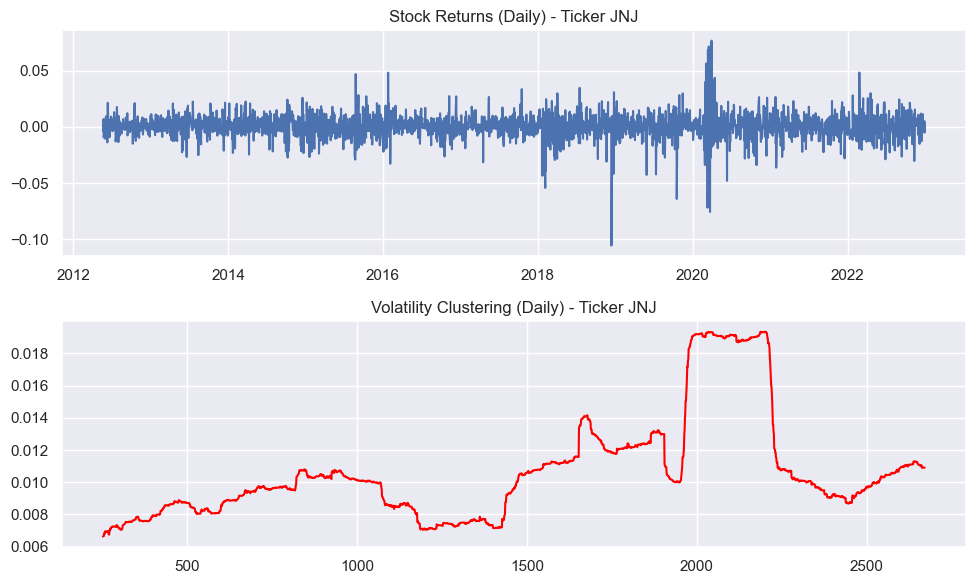

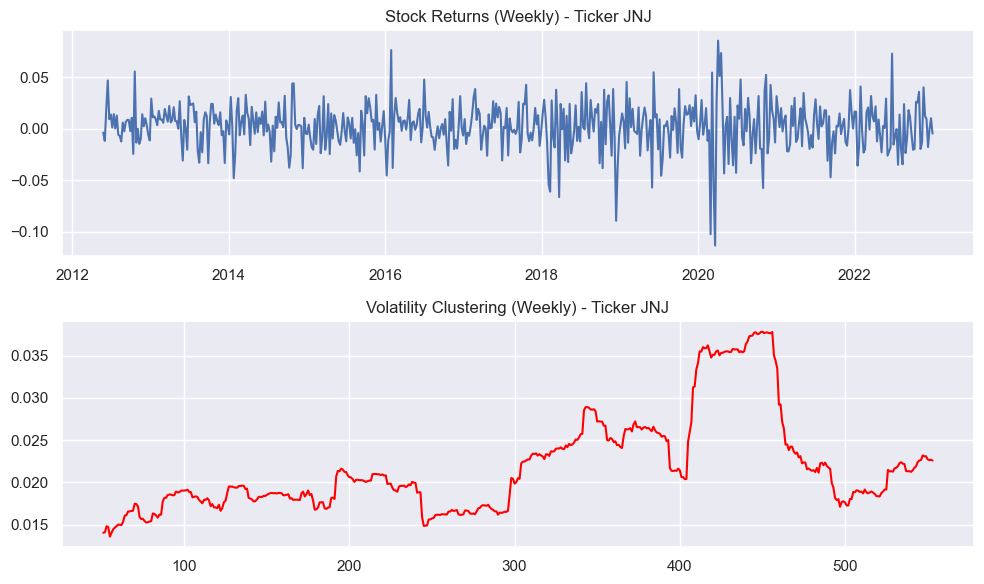

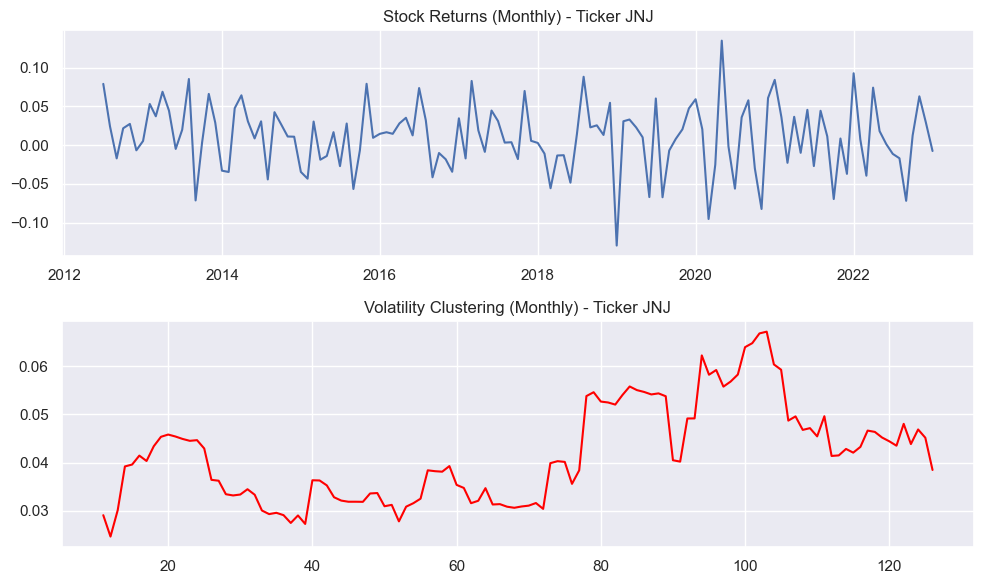

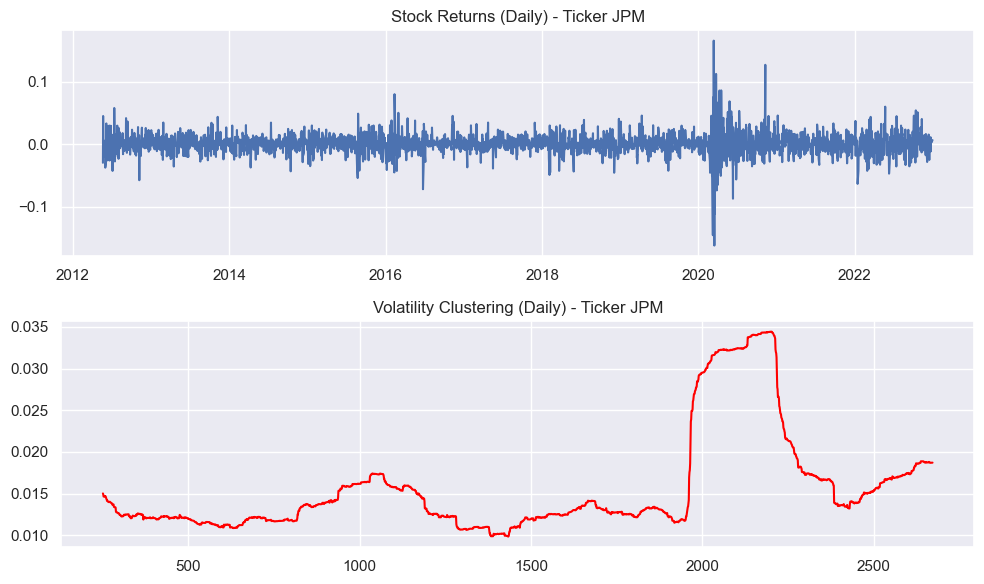

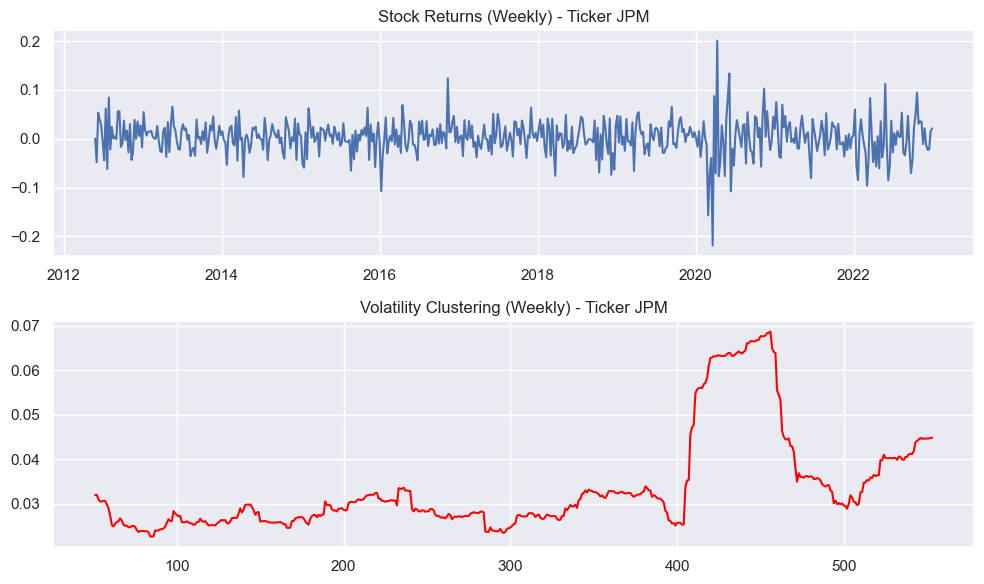

...

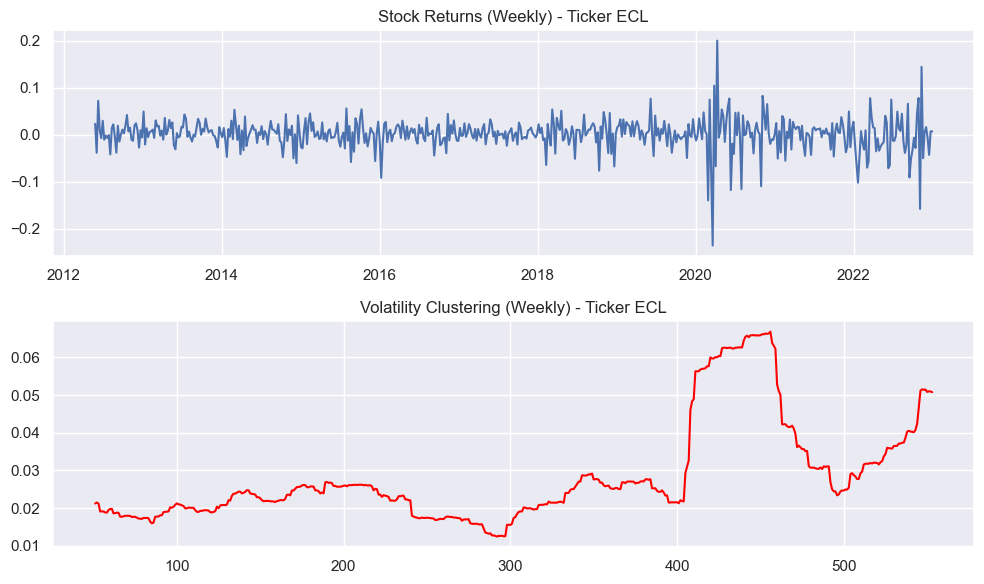

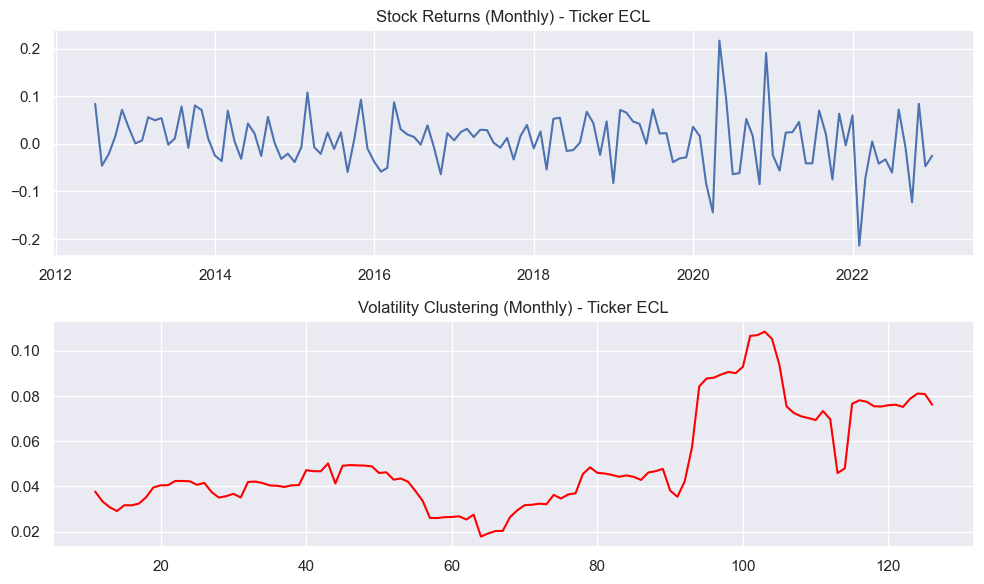

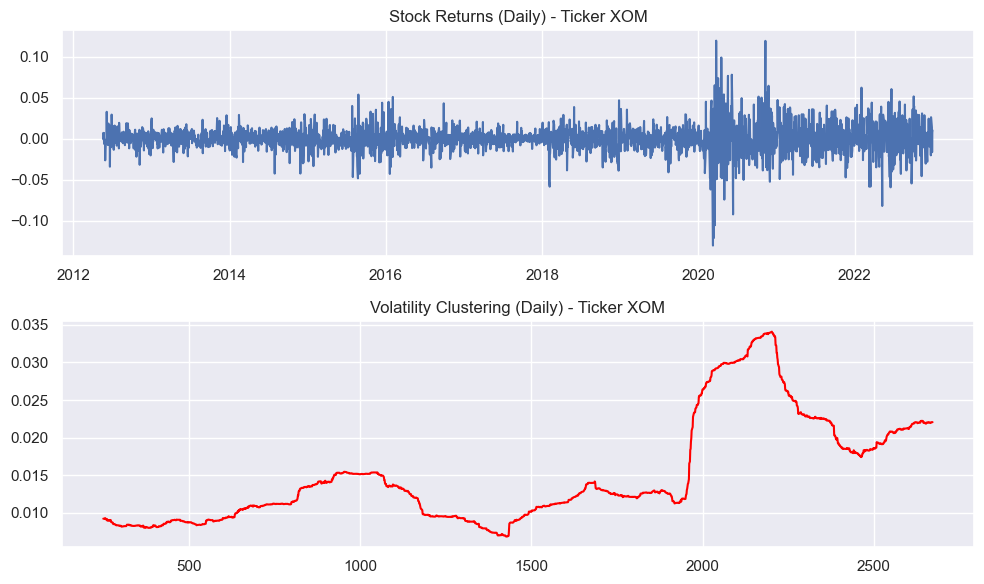

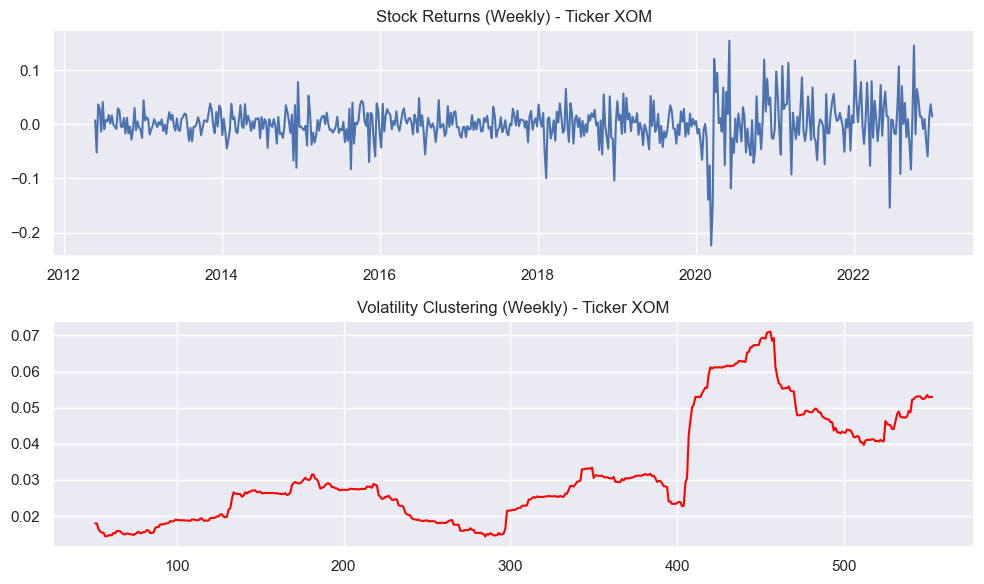

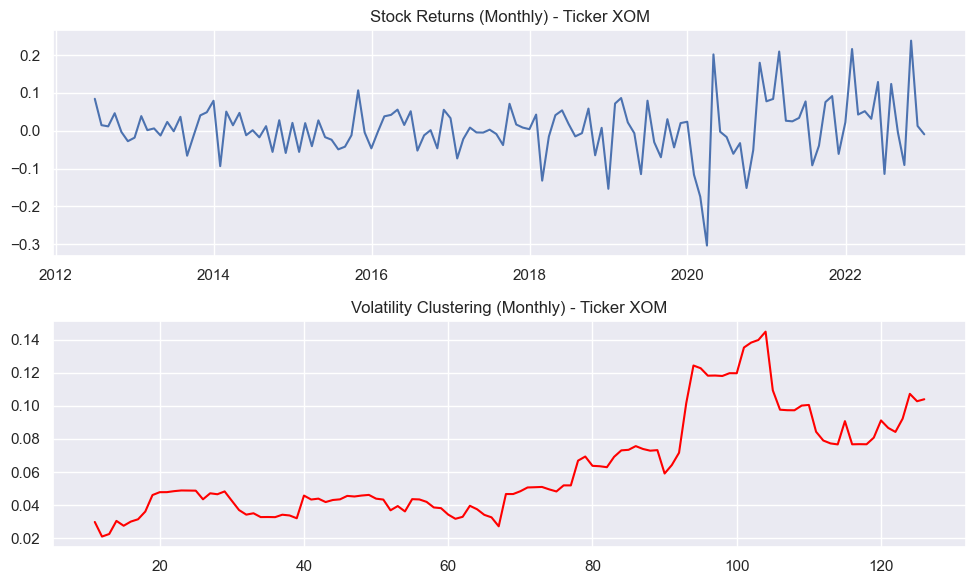

In [11]:
returns_obj = [
    ("Daily", daily_log_returns, 252),
    ("Weekly", weekly_log_returns, 52),
    ("Monthly", monthly_log_returns, 12)
]

for stock in stocks:
    for return_obj in returns_obj:
        returns_type, returns, window_size = return_obj
        returns = returns[stock]

        volatility = np.array([np.std(returns[i:i+window_size]) for i in range(len(returns) - window_size + 1)])

        # Create a time axis for the x-axis
        time_axis = np.arange(window_size - 1, len(returns))

        # Create a new figure
        plt.figure(figsize=(10, 6))

        # Plot the stock returns
        plt.subplot(2, 1, 1)
        plt.plot(returns)
        plt.title(f'Stock Returns ({returns_type}) - Ticker {stock}')

        # Plot the rolling volatility
        plt.subplot(2, 1, 2)
        plt.plot(time_axis, volatility, color='red')
        plt.title(f'Volatility Clustering ({returns_type}) - Ticker {stock}')

        # Adjust the layout
        plt.tight_layout()

        # Show the plot
        plt.show()


- Leverage Effects

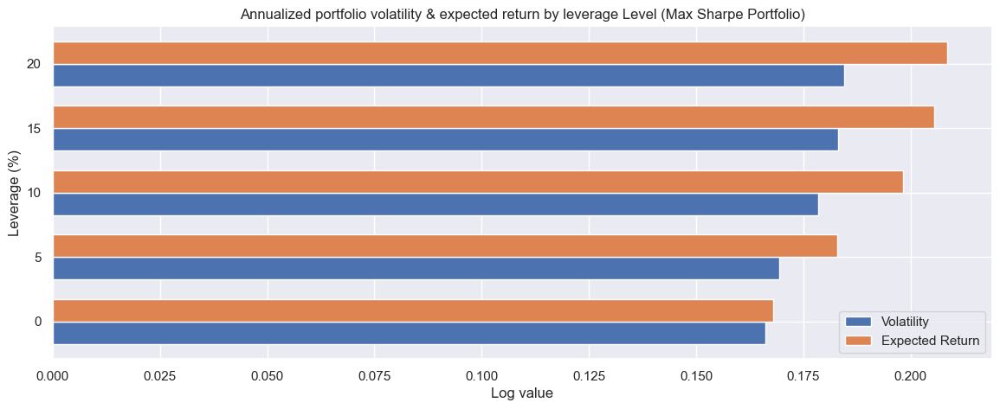

In [12]:
#%pip install scikit-learn
from scipy.optimize import minimize

def compute_effects_msrp_leverage(returns, leverage):
    mu = returns.mean()
    Sigma = returns.cov()

    def w_fun(w):
        return -(w.T @ mu)/np.sqrt(np.dot(w.T, np.dot(Sigma, w)))
    
    number_of_assets = len(stocks)
    subject_to = [{'type': 'eq', 'fun': lambda w: np.sum(w) - 1}]
    weight_range = [(0-leverage/100, 1+leverage/100)] * number_of_assets

    results = minimize(
        w_fun, 
        x0=np.ones(number_of_assets)/number_of_assets,
        bounds=weight_range,
        constraints=subject_to
    )

    weights = results.x

    rp = (weights.T @ returns.mean()) * 252
    vol_p = np.sqrt(weights.T @ returns.cov() @ weights) * np.sqrt(252)

    return (vol_p, rp)

leverage_levels = [0, 5, 10, 15, 20]
volatility_values = []
return_values = []

for leverage in leverage_levels:
    vol_p, rp = compute_effects_msrp_leverage(daily_log_returns, leverage)
    volatility_values.append(vol_p)
    return_values.append(rp)

# Create a horizontal bar plot
bar_height = 0.35
index = range(len(leverage_levels))

fig, ax = plt.subplots()
bar1 = ax.barh(index, volatility_values, bar_height, label='Volatility')
bar2 = ax.barh([i + bar_height for i in index], return_values, bar_height, label='Expected Return')

ax.set_ylabel('Leverage (%)')
ax.set_xlabel('Log value')
ax.set_title('Annualized portfolio volatility & expected return by leverage Level (Max Sharpe Portfolio)')
ax.set_yticks([i + bar_height / 2 for i in index])
ax.set_yticklabels(leverage_levels)
ax.legend()
plt.show()

- Conditional Non-Normality

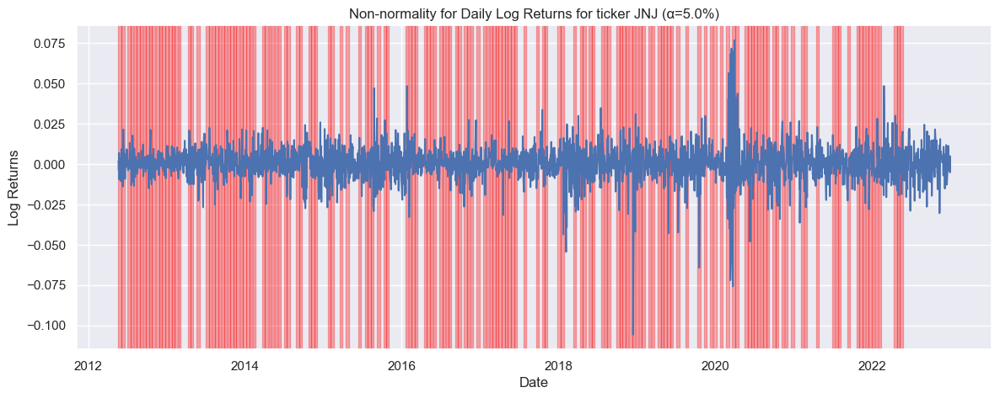

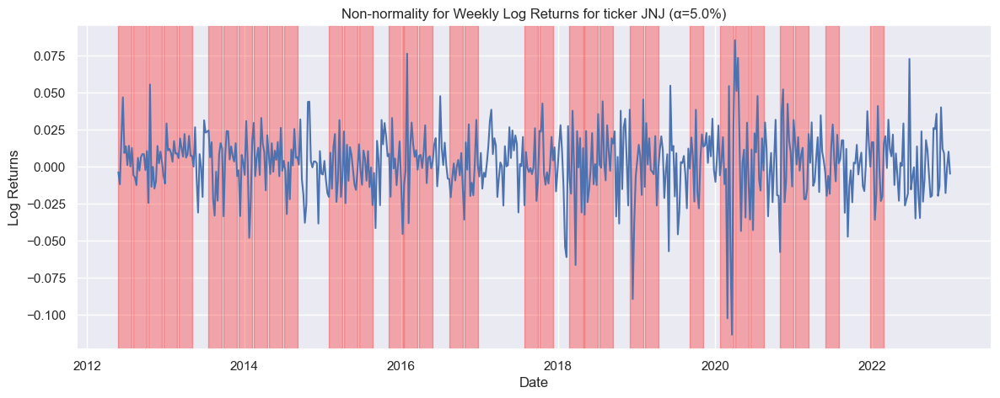

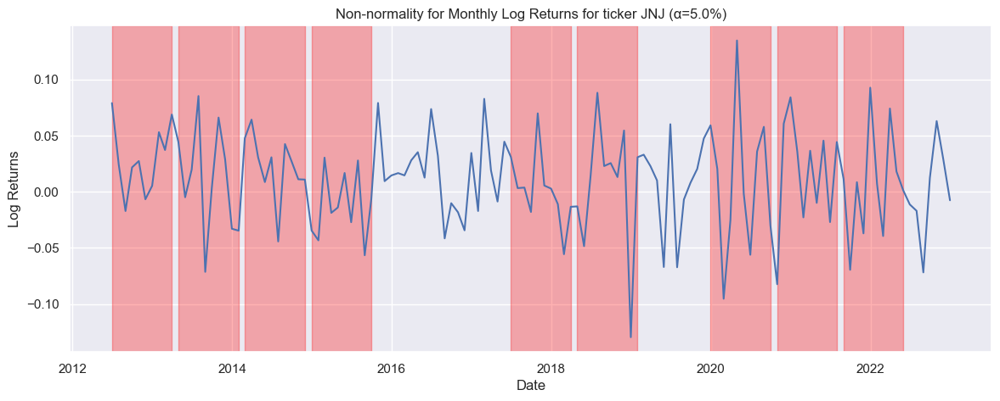

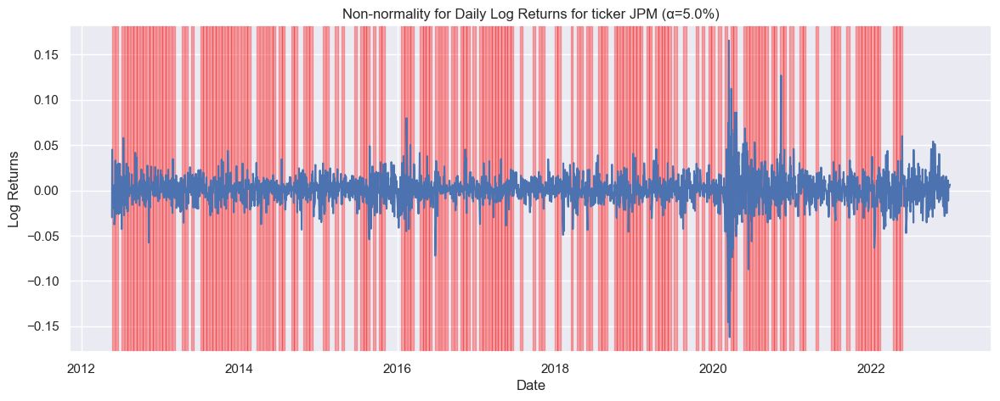

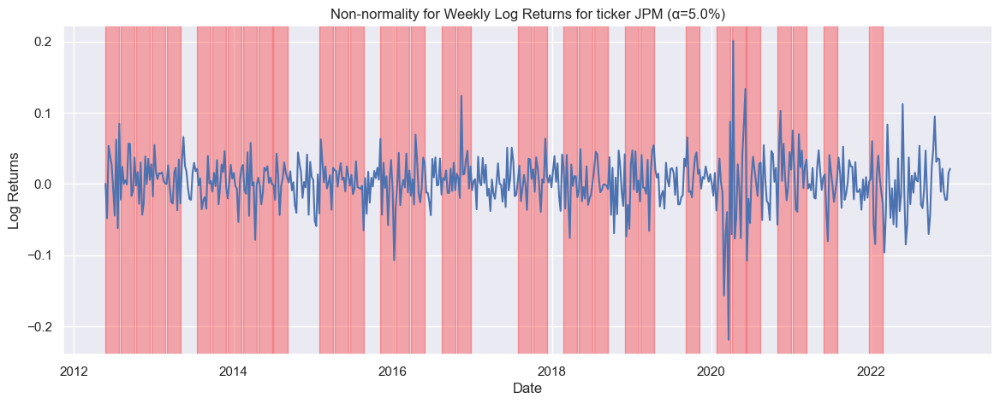

...

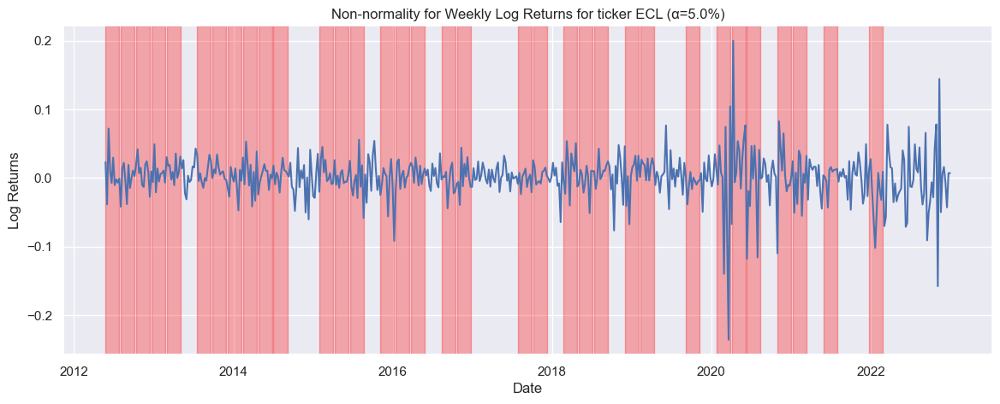

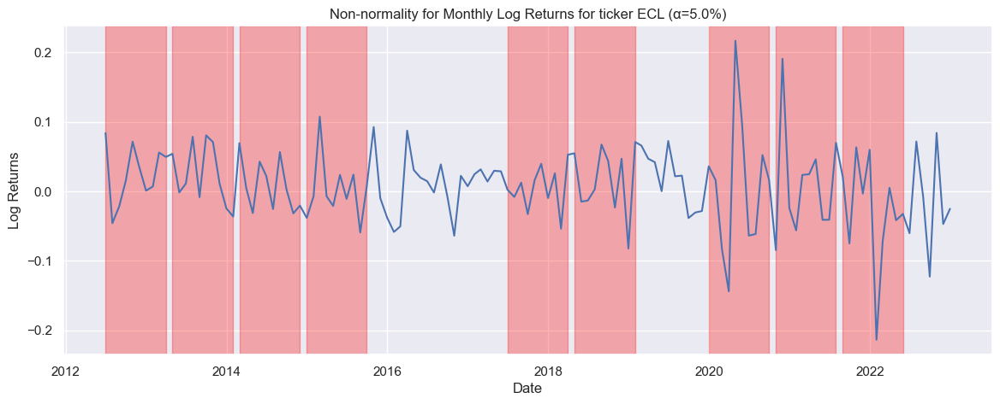

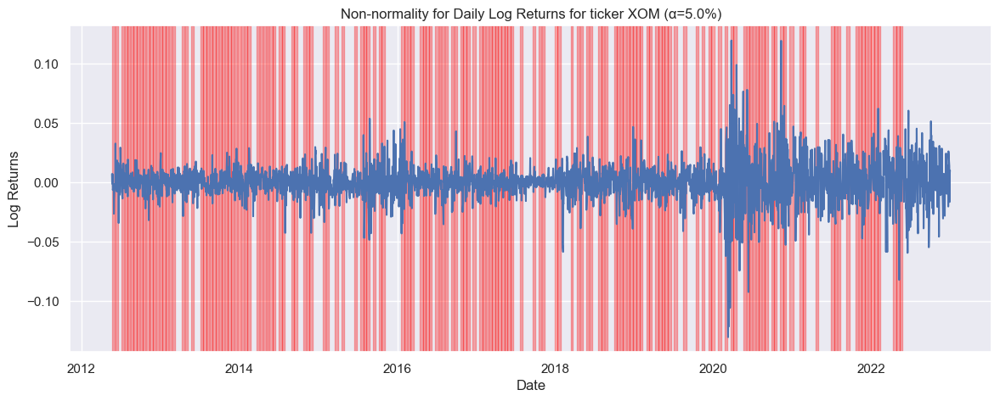

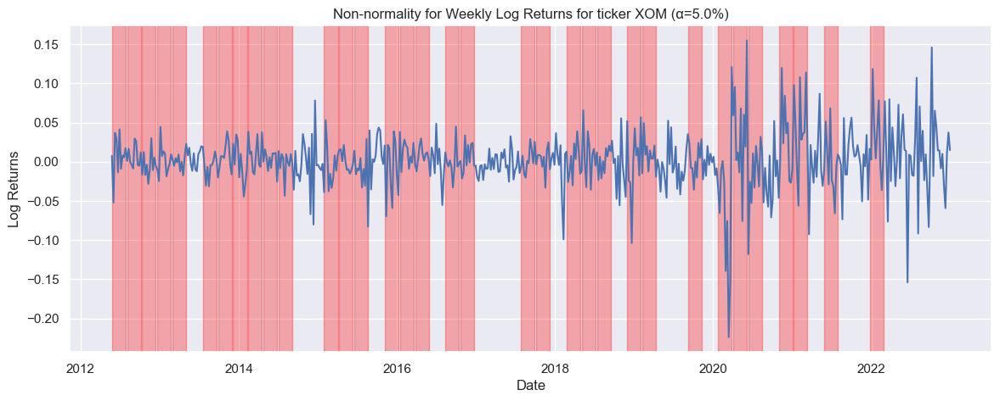

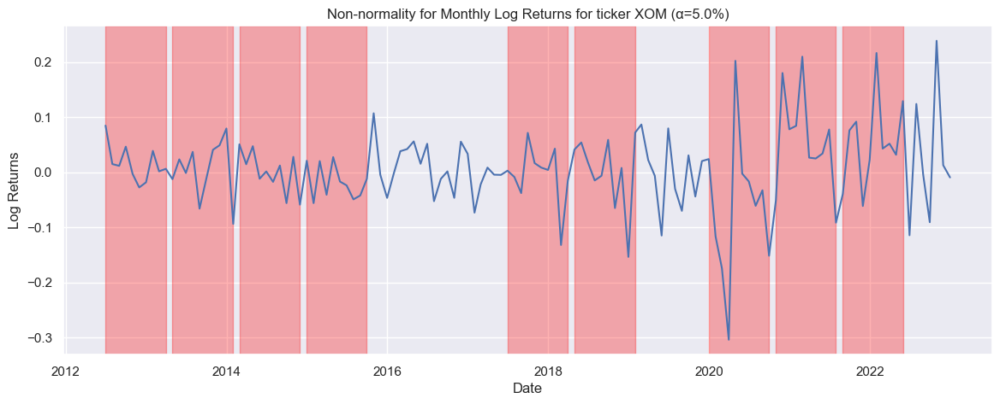

In [13]:
from scipy.stats import shapiro

returns_objects = [
    (daily_log_returns, "Daily Log Returns", 252),
    (weekly_log_returns, "Weekly Log Returns", 52),
    (monthly_log_returns, "Monthly Log Returns", 12)
]

for stock in stocks:
    for returns_obj in returns_objects:

        returns, returns_title, interval_length = returns_obj
        dt = len(returns) // interval_length
        alpha = 0.05

        non_normal_periods = []
        for i in range(interval_length):
            sliced_returns = returns[dt*i : dt*(i+1)]
            _, p_value = shapiro(sliced_returns)
            if (p_value < alpha):
                non_normal_periods.append( (sliced_returns.index[0], sliced_returns.index[-1]) )
        
        plt.figure()
        plt.plot(returns[stock].index, returns[stock])

        # Plot boxes for non-normal periods
        for start, end in non_normal_periods:
            plt.axvspan(start, end, color='red', alpha=0.3, label='Non-Normal Period')    
        
        plt.title(f"Non-normality for {returns_title} for ticker {stock} (α={alpha*100}%)")
        plt.xlabel("Date")
        plt.ylabel("Log Returns")


### 4. Split the dataset into a training set (01-01-2010 to 31-12-2015) and a test set (01-01-2016 to 31-12-2022). Empirically investigate the performance of the following investment strategies in the test set (note: use training set to calibrate the models).

In [14]:
#Dates
training_start_date, training_end_date = "2010-01-01", "2015-12-31"
test_start_date, test_end_date = "2016-01-01", "2022-12-31"

#Divide training set & test set
training_dataset = daily_returns[ (daily_returns.index <= training_end_date) & (daily_returns.index >= training_start_date) ]
test_dataset = daily_returns[ (daily_returns.index <= test_end_date) & (daily_returns.index >= test_start_date) ]

#Get S&P 500 dataset
sp500_dataset = yf.download('^GSPC', start=training_dataset.index[0].strftime('%Y-%m-%d'), end=test_end_date)['Adj Close'].pct_change().dropna()
sp500_training_dataset = sp500_dataset[ (sp500_dataset.index <= training_end_date) & (sp500_dataset.index >= training_start_date) ]
sp500_test_dataset = sp500_dataset[ (sp500_dataset.index <= test_end_date) & (sp500_dataset.index >= test_start_date) ]

[*********************100%%**********************]  1 of 1 completed


In [15]:
def empyrial_backtest(portfolio_weights, test_dataset_flag = True):
    empyrial(
        Engine(
            start_date=test_start_date if test_dataset_flag else training_start_date, 
            end_date=test_end_date if test_dataset_flag else training_end_date, 
            portfolio=deepcopy(stocks), 
            benchmark=["SPY"], 
            weights=deepcopy( portfolio_weights.tolist() if type(portfolio_weights) != list else portfolio_weights )
        )
    )

def plot_performance(weights, strategy_name, test_flag=True):
    plt.figure()

    # Compute performance over time (multiplying returns) for the portfolio
    dataset = test_dataset if test_flag else training_dataset
    portfolio_performance = (1 + (weights * dataset)).cumprod().prod(axis=1)

    # Plot S&P 500 to benchmark it against
    sp500 = sp500_test_dataset if test_flag else sp500_training_dataset
    sp500_performance = (1 + sp500).cumprod()

    plt.plot(
        portfolio_performance.index,
        portfolio_performance*100-100,
        label=strategy_name,
    )

    # Plot S&P 500 performance for benchmarking
    plt.plot(
        sp500_performance.index,
        sp500_performance*100-100,
        label='S&P 500',
    )

    plt.title(f'Performance over time for {strategy_name} ({("Test" if test_flag else "Training")} set)')
    plt.ylabel("Compounded Returns (%)")
    plt.xlabel("Date")
    plt.legend()
    plt.show()

def plot_overall_performance(weights, strategy_name):
    plot_performance(weights, strategy_name, False)
    plot_performance(weights, strategy_name, True)
    

def plot_weights(weights, strategy_name):
    plt.figure(figsize=(6, 6))
    plt.pie(weights, labels=stocks, autopct='%1.1f%%', startangle=90)
    plt.title(f'Portfolio allocation for {strategy_name}')
    plt.show()


A. Buy & Hold

In [16]:
def buy_and_hold_weights():
  return np.eye(len(stocks))

In [17]:
#Buy & Hold -> Comprar um só ativo e mantê-lo em carteira
portfolios_bnh = buy_and_hold_weights()
portfolios_bnh

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]])

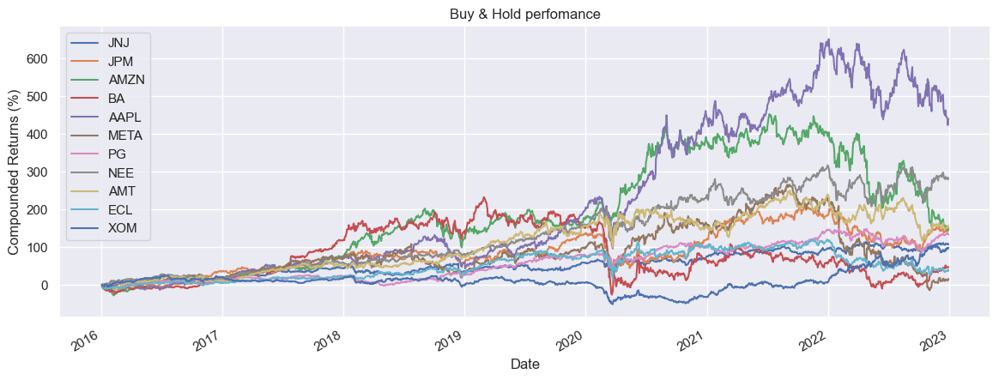

In [18]:
((1 + test_dataset).cumprod() * 100 - 100).plot(title='Buy & Hold perfomance', xlabel='Date', ylabel='Compounded Returns (%)');

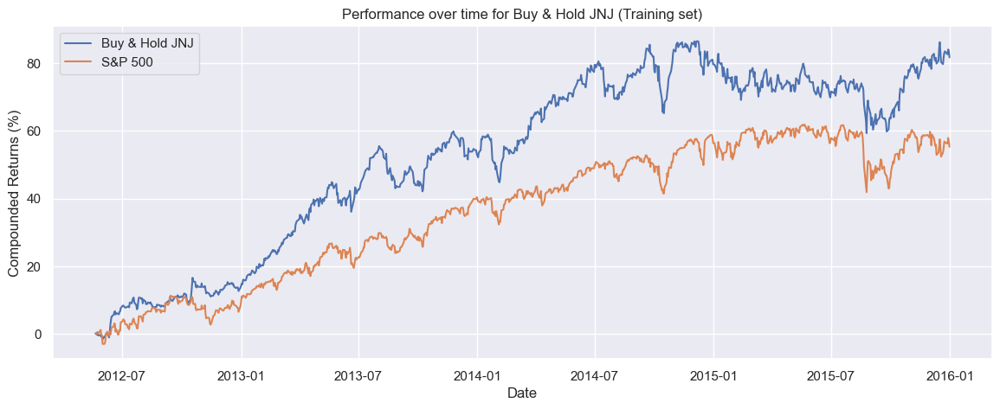

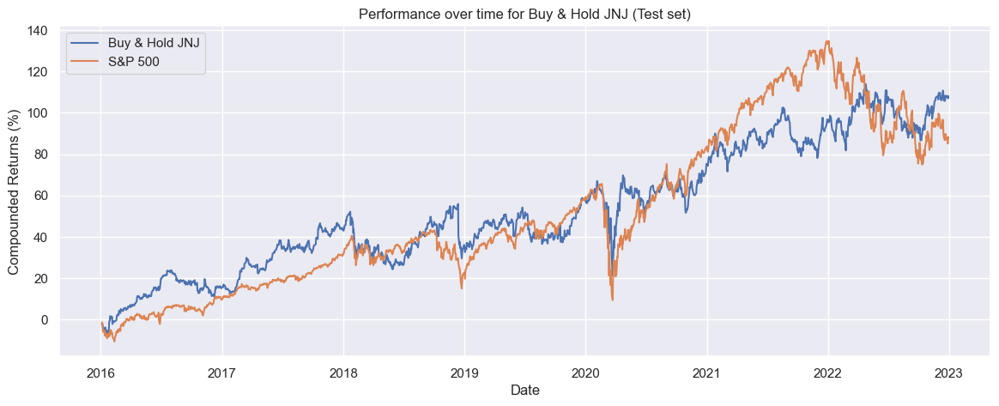

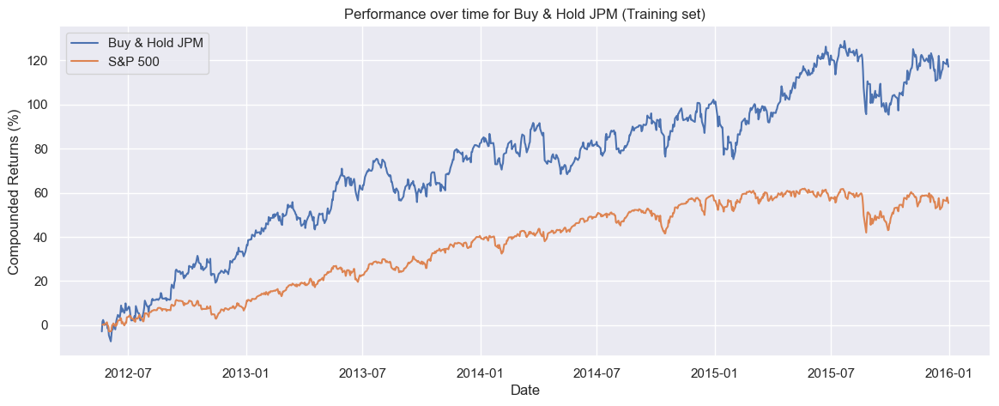

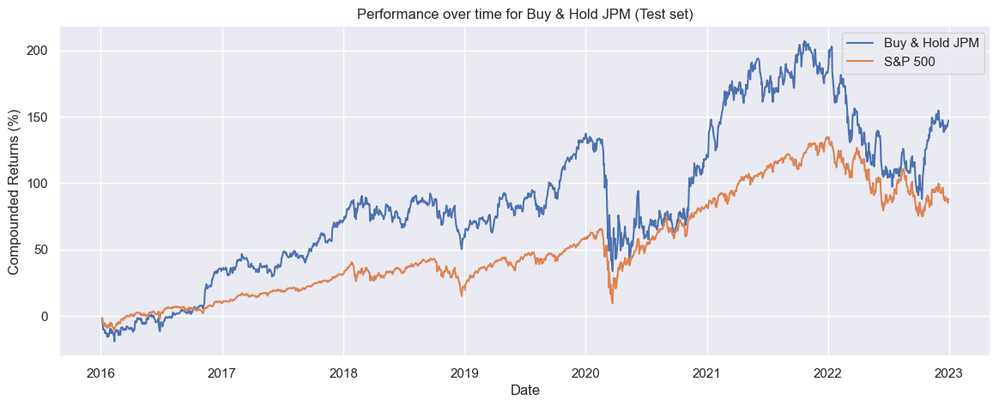

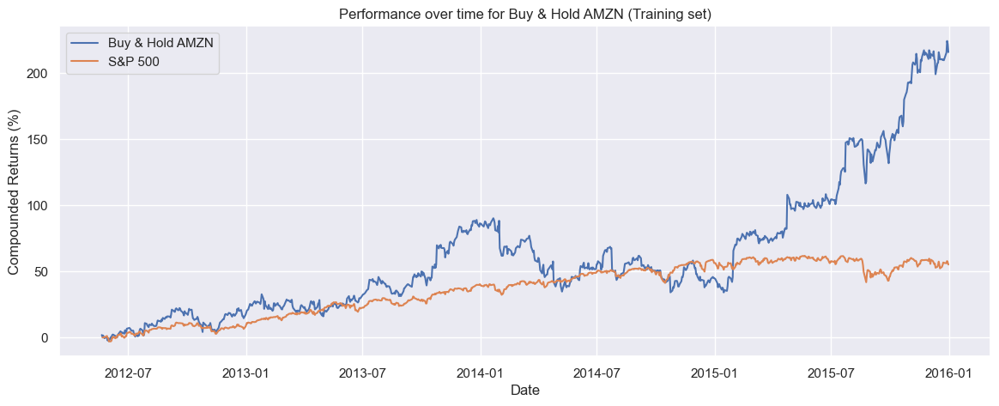

...

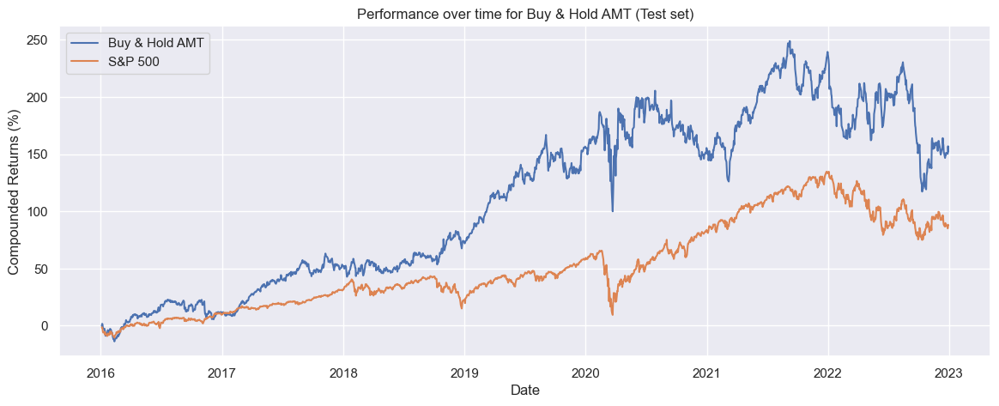

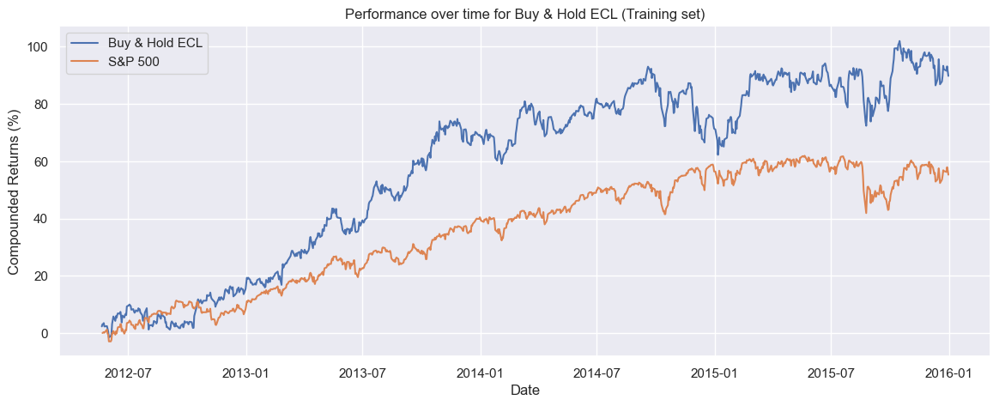

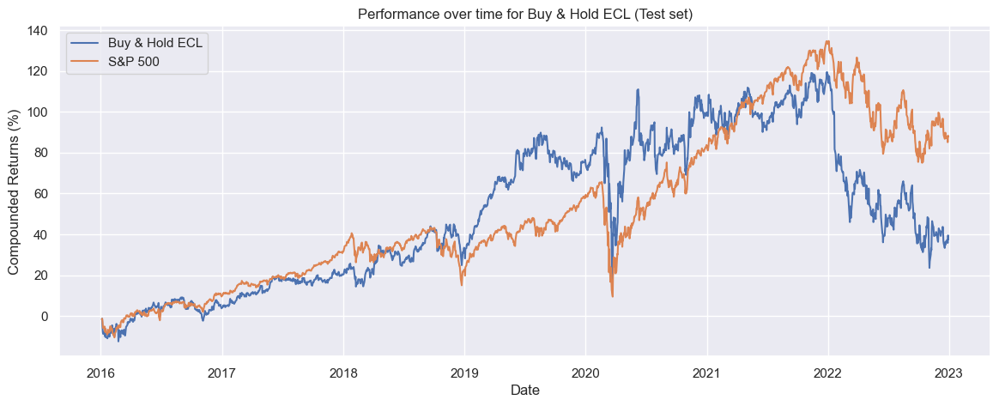

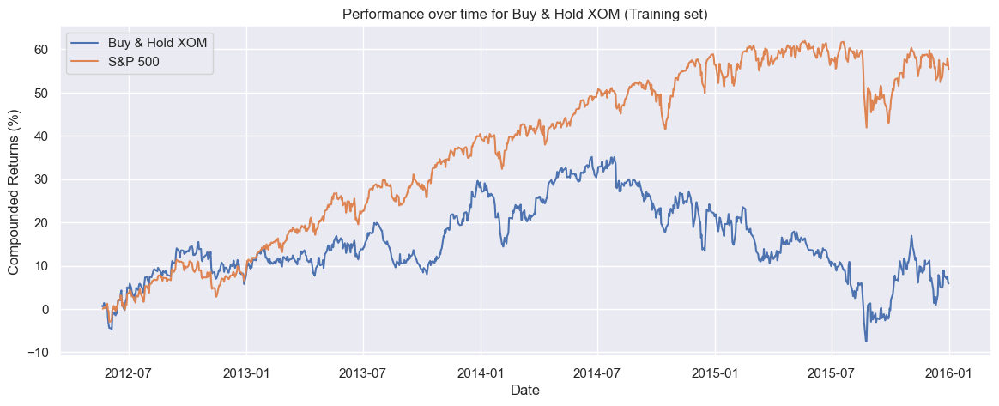

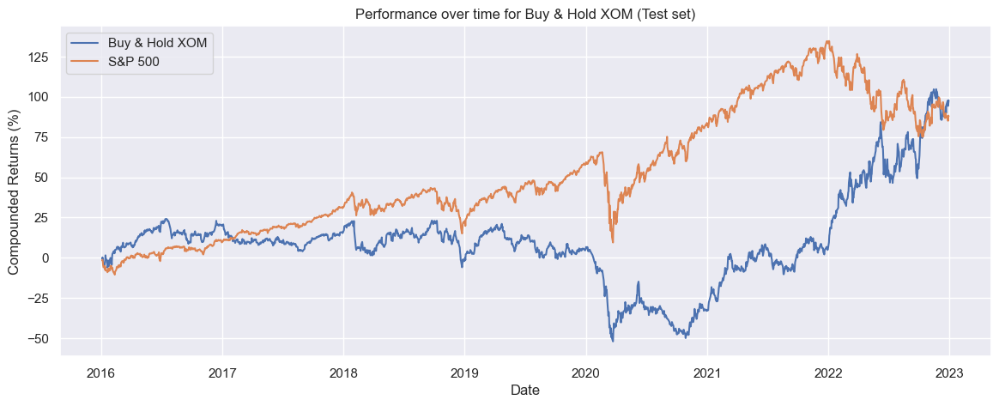

In [19]:
#Para cada ação vamos fazer a soma dos retornos log (soma log, produto percentagem) e fazer track da performance acumulada ao longo do tempo
for i in range(len(stocks)):
    weights = portfolios_bnh[i]
    strategy_name = f"Buy & Hold {stocks[i]}"
    plot_overall_performance(weights, strategy_name)

B. Equally weighted portfolio

In [20]:
def ewp_weights():
  number_of_stocks = len(stocks)
  return np.repeat(1/number_of_stocks, number_of_stocks)

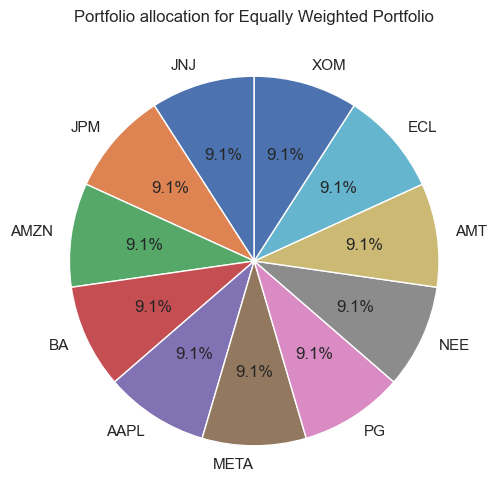

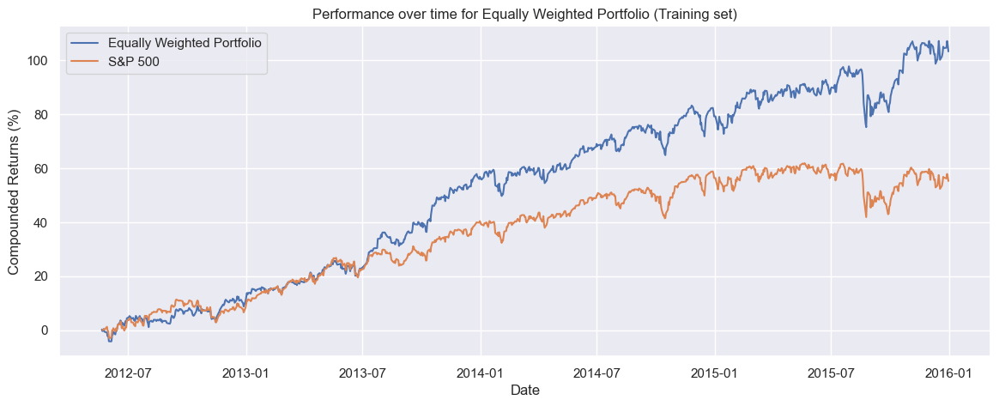

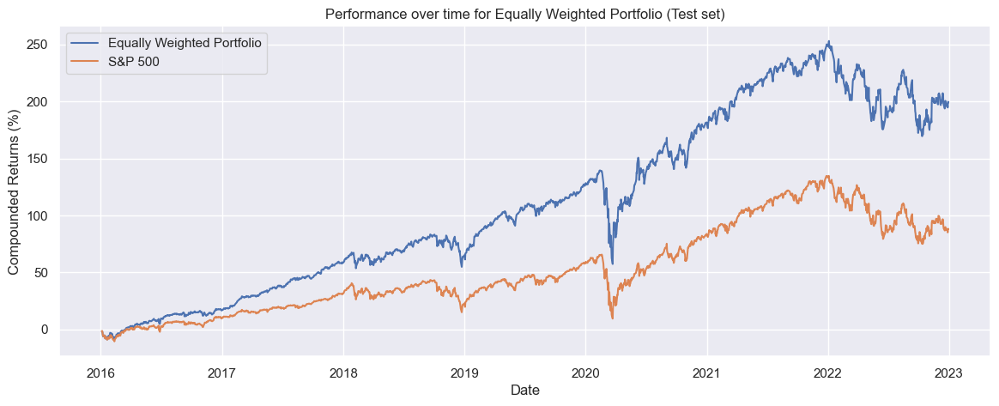

In [21]:
w_ewp = ewp_weights()
plot_weights(w_ewp, "Equally Weighted Portfolio")
plot_overall_performance(w_ewp, "Equally Weighted Portfolio")

C. Quintile portfolio

In [22]:
def quintile_weights_and_ratios():
  #Média dos retornos
  average_returns = training_dataset.mean()

  #Calcular sigma
  covariance_matrix = training_dataset.cov()

  #Volatilidade -> sqrt(variance) onde variancia = diagonal de Sigma
  volatility = np.sqrt(np.diag(covariance_matrix))

  #retornos por cada unidade de risco (mu/sigma)
  ratio = average_returns / volatility

  #número de stocks/ativos
  number_of_stocks = len(stocks)

  #tamanho quintil
  quintile_size = number_of_stocks // 5

  #quintile weights
  weights = np.zeros(number_of_stocks)

  for _ in range(quintile_size):
    current_max_ratio_stock = ratio.idxmax()
    current_max_ratio_index = stocks.index(current_max_ratio_stock)
    weights[current_max_ratio_index] = 1/quintile_size
    #Remover stock mais usado, para obter segundo mais usado
    ratio = ratio[ratio.index != current_max_ratio_stock]

  return weights, np.array(average_returns / volatility)

In [23]:
w_quintile, quintile_ratios = quintile_weights_and_ratios()

print("Quintile weights:", w_quintile)
print("Quintile ranking ratios (mu/volatility):", quintile_ratios)

Quintile weights: [0.5 0.  0.  0.5 0.  0.  0.  0.  0.  0.  0. ]
Quintile ranking ratios (mu/volatility): [0.07891244 0.07078814 0.07562735 0.07599331 0.03485423 0.05414147
 0.04467221 0.06924777 0.04956811 0.06800553 0.01120781]


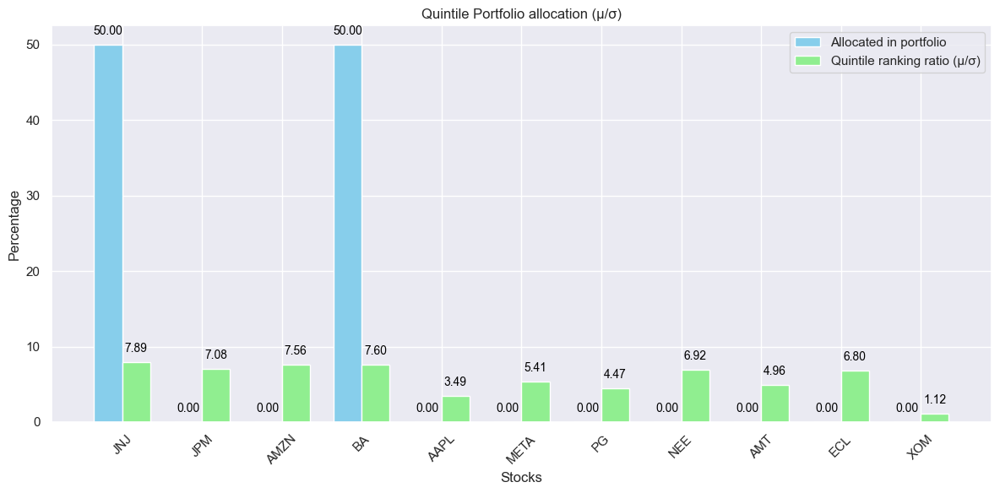

In [24]:
# Set the width of the bars
bar_width = 0.35

# Create a bar plot with w_quintile values and quintile_ratios
x = np.arange(len(stocks))
plt.figure(figsize=(12, 6))

for i, (data, label, color) in enumerate(zip([w_quintile*100, quintile_ratios*100],
                                             ['Allocated in portfolio', 'Quintile ranking ratio (μ/σ)'],
                                             ['skyblue', 'lightgreen'])):
    bars = plt.bar(x + (i - 0.5) * bar_width, data, bar_width, label=label, color=color)
    for j, value in enumerate(data):
        plt.text(x[j] + (i - 0.5) * bar_width, value + 1, f'{value:.2f}', ha='center', va='bottom', fontsize=10, color='black')

plt.xlabel('Stocks')
plt.ylabel('Percentage')
plt.title('Quintile Portfolio allocation (μ/σ)')
plt.xticks(x, stocks, rotation=45)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

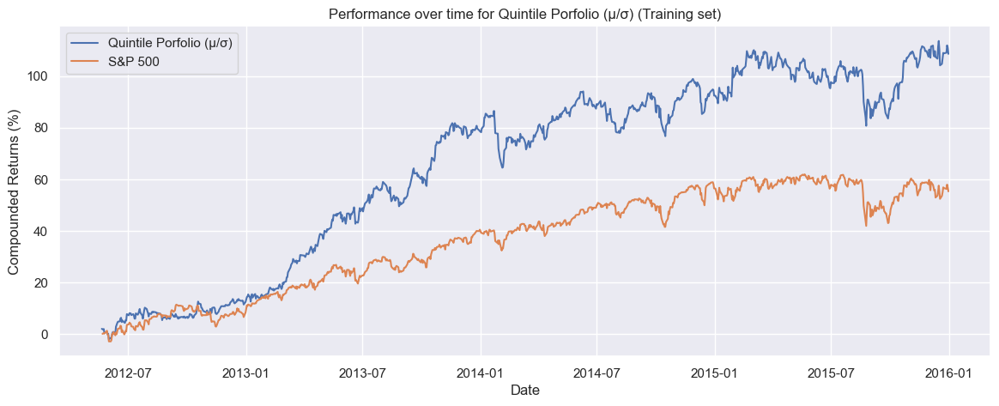

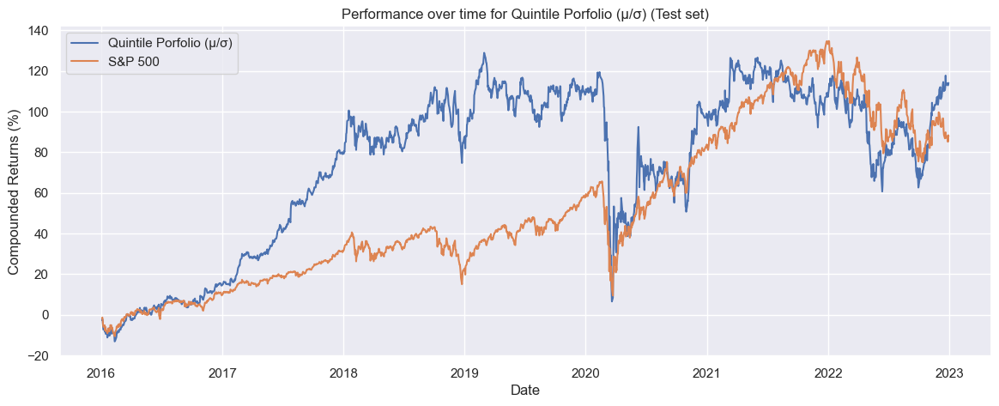

In [25]:
plot_overall_performance(w_quintile, "Quintile Porfolio (μ/σ)")

D. Markowitz’s mean-variance portfolio (MVP) with no short-selling

In [26]:
#%pip install scikit-learn
from scipy.optimize import minimize

def markowitz_mvp_weights(lamba_param):
    mu = training_dataset.mean()
    Sigma = training_dataset.cov()

    def inverse_mvp_function(w):
        port_ret = w.T @ mu
        port_vol = np.dot(w.T, np.dot(Sigma, w))
        mvp_result =  port_ret - lamba_param * port_vol
        return -mvp_result

    number_of_assets = len(stocks)
    subject_to = [{'type': 'eq', 'fun': lambda w: np.sum(w) - 1}]
    weight_range = [(0, 1)] * number_of_assets

    results = minimize(
        inverse_mvp_function, 
        x0=np.ones(number_of_assets)/number_of_assets,
        bounds=weight_range,
        constraints=subject_to
    )

    return np.abs(results.x)/np.sum(results.x)

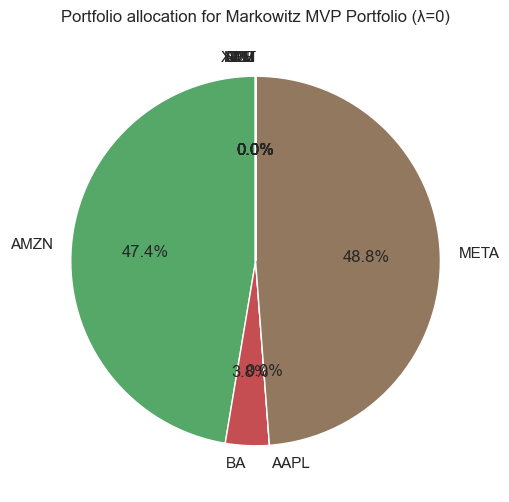

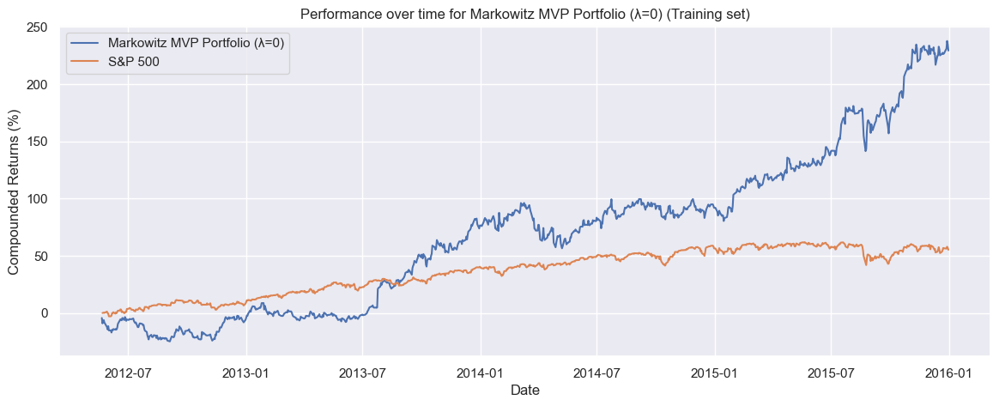

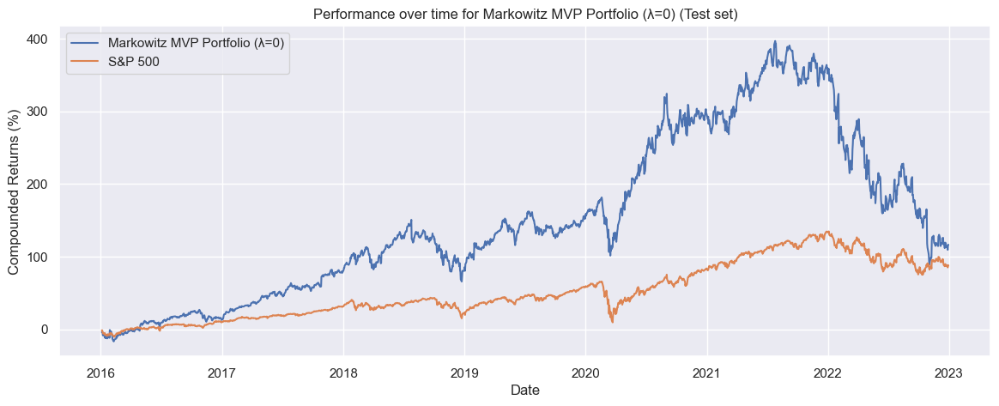

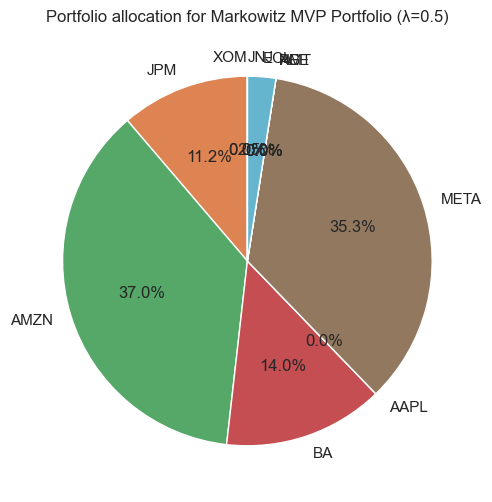

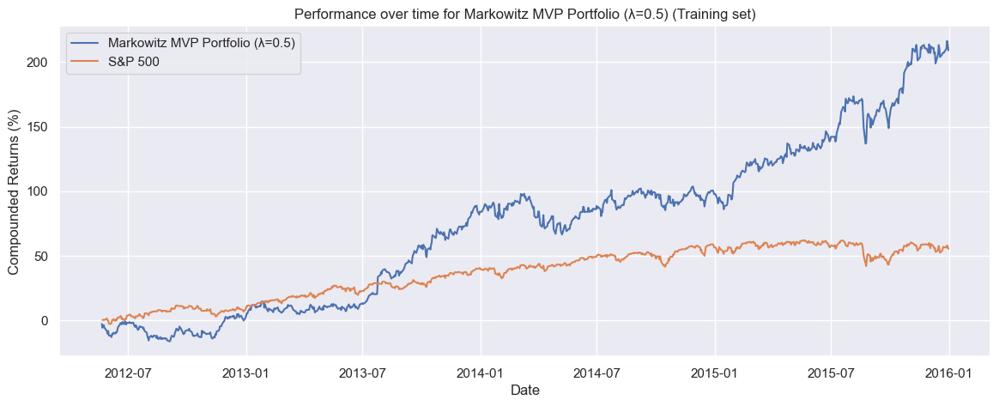

...

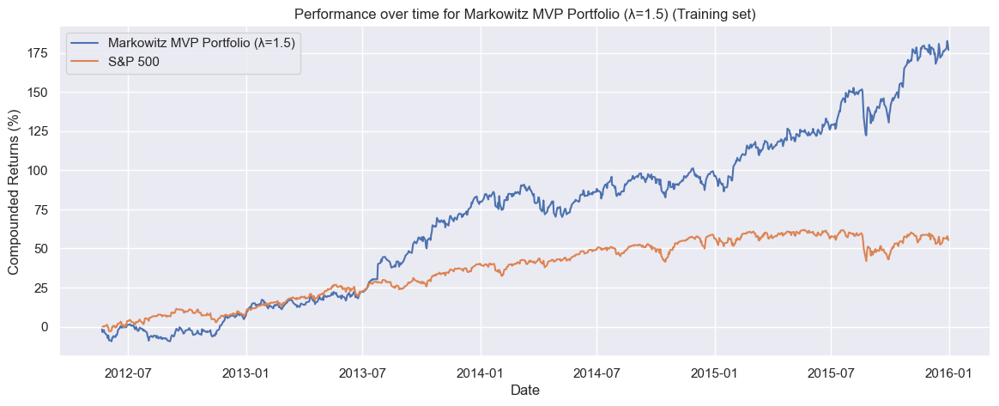

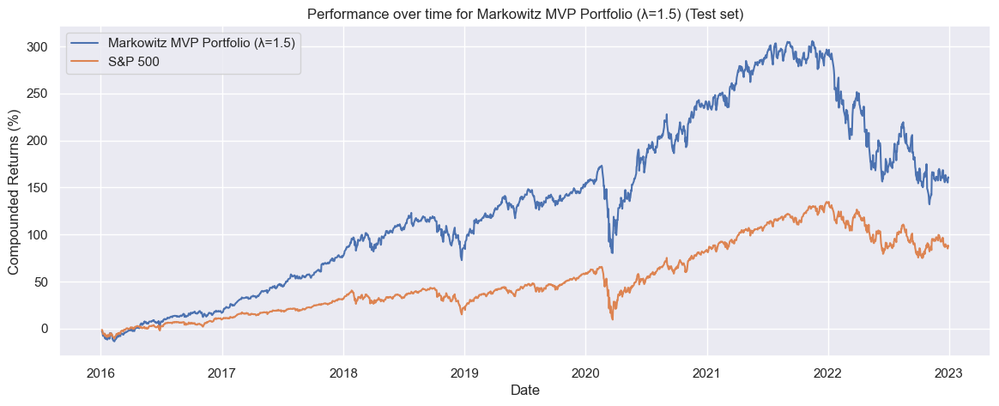

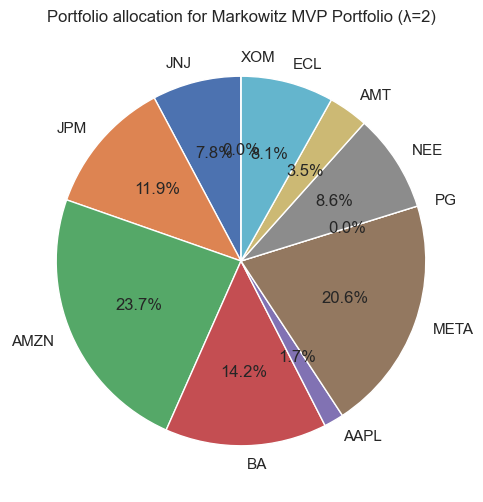

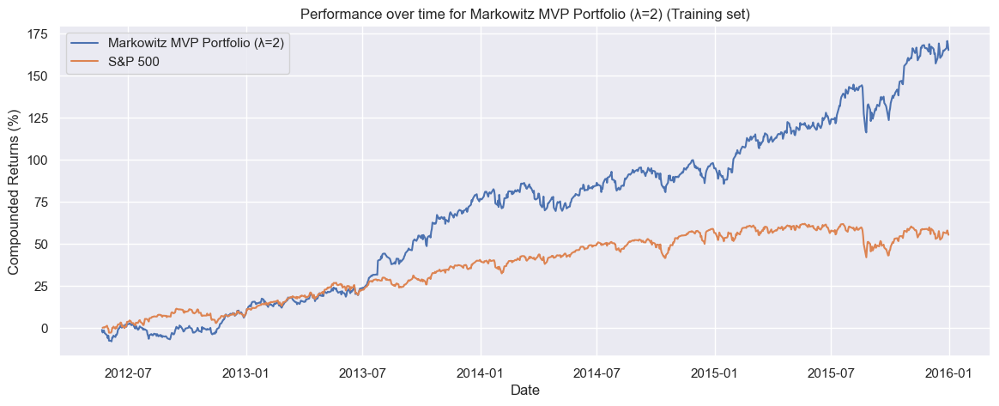

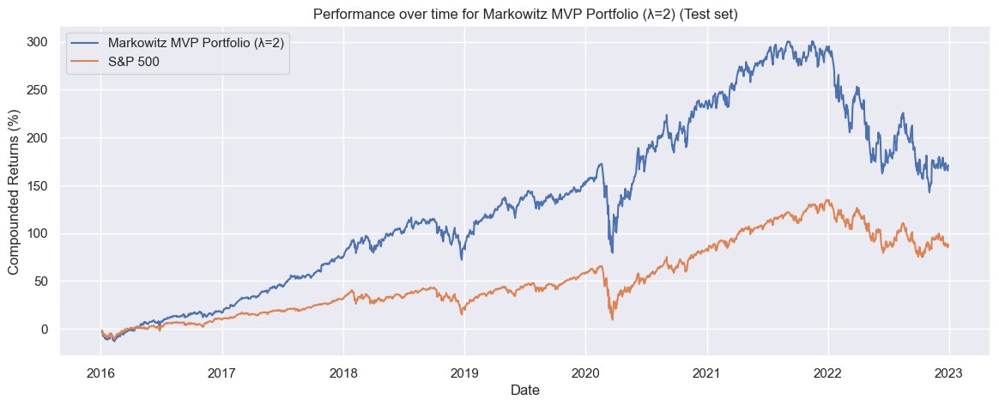

In [27]:
w_mvp = {}
for lambda_val in [0, 0.5, 1, 1.5, 2]:
    w_mvp[lambda_val] = markowitz_mvp_weights(lamba_param = lambda_val)
    plot_weights(w_mvp[lambda_val], f"Markowitz MVP Portfolio (λ={lambda_val})")
    plot_overall_performance(w_mvp[lambda_val], f"Markowitz MVP Portfolio (λ={lambda_val})")

E. Global Minimum Variance Portfolio (GMVP) with no short selling

In [28]:
def gmvp_weights():
  # Matriz de covariância
  sigma = training_dataset.cov()

  # Matriz de ones
  ones = np.ones(len(stocks))

  # Formula dos slides
  weights = 1/(ones.T @ np.linalg.inv(sigma) @ ones) * np.linalg.inv(sigma) @ ones

  # Garantir que soma pesos = 1
  weights = np.abs(weights)/np.sum(np.abs(weights))

  return weights

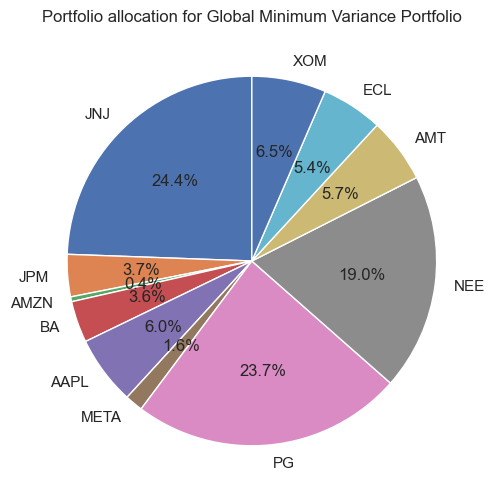

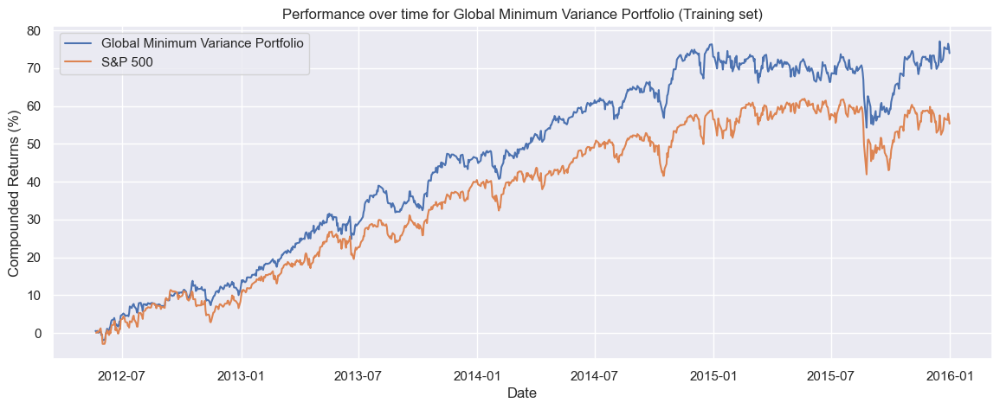

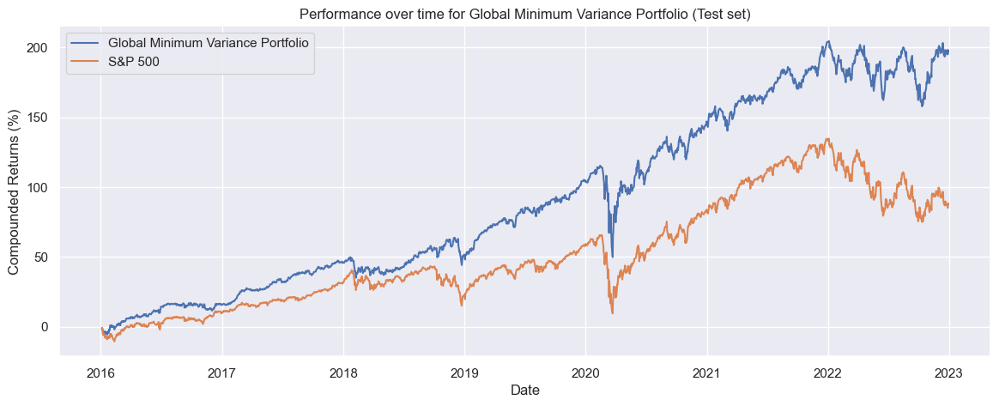

In [29]:
w_gmvp = gmvp_weights()
plot_weights(w_gmvp, "Global Minimum Variance Portfolio")
plot_overall_performance(w_gmvp, "Global Minimum Variance Portfolio")

F. Estimate the Maximum Sharpe ratio portfolio (MSRP)

In [30]:
"""
  rf_rate -> Risk free rate
  leverage -> Entre 0 e 1 -> alavancagem
"""
def msrp_weights(rf_rate=0, leverage=0):
  mu = training_dataset.mean()
  Sigma = training_dataset.cov()

  def inverse_sharpe_function(w):
    risk_premium = (w.T @ mu) - rf_rate
    portfolio_volatility = np.sqrt(np.dot(w.T, np.dot(Sigma, w)))
    sharpe_ratio = risk_premium/portfolio_volatility
    return -sharpe_ratio
  
  number_of_assets = len(stocks)
  subject_to = [{'type': 'eq', 'fun': lambda w: np.sum(w) - 1}]
  weight_range = [(0-leverage, 1+leverage)] * number_of_assets

  results = minimize(
    inverse_sharpe_function,
    x0=np.ones(number_of_assets)/number_of_assets,
    bounds=weight_range,
    constraints=subject_to
  ) 

  return np.array(results.x)
  

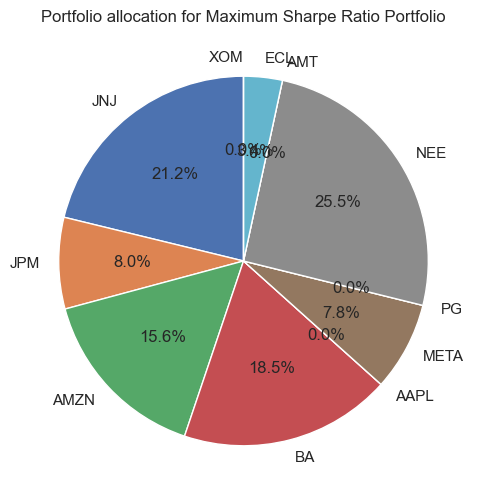

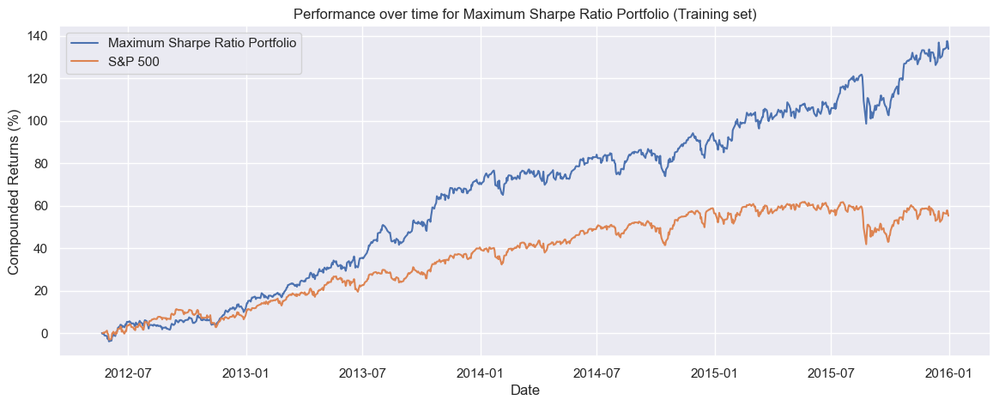

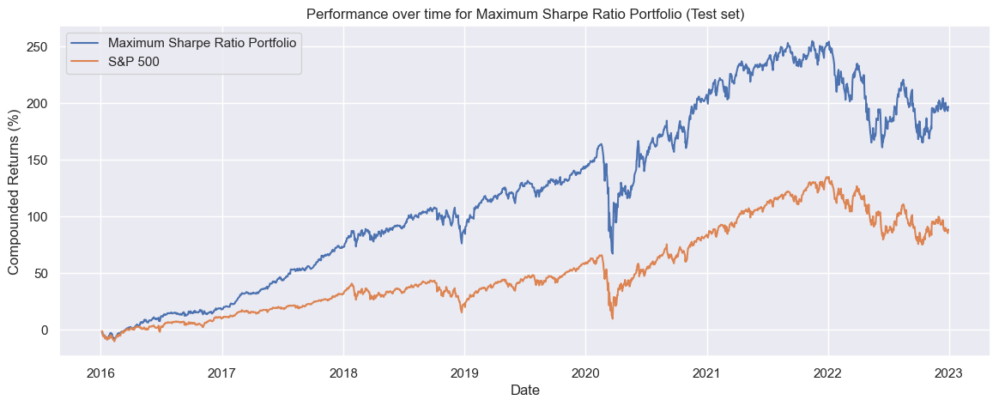

In [31]:
w_msrp = msrp_weights()
plot_weights(w_msrp, "Maximum Sharpe Ratio Portfolio")
plot_overall_performance(w_msrp, "Maximum Sharpe Ratio Portfolio")

G. Inverse Volatility Portfolio (IVP)

In [32]:
def ivp_weights():
    # Obter volatilidade
    Sigma = training_dataset.cov()
    sigma_2 = np.diag(Sigma)
    vol = np.sqrt(sigma_2)
    
    # Calcular volatilidade inversa e array de uns
    inv_vol = 1/vol

    # formula dos slides
    return inv_vol/inv_vol.sum()


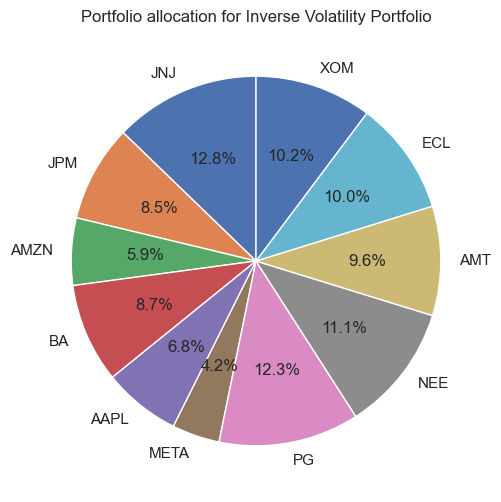

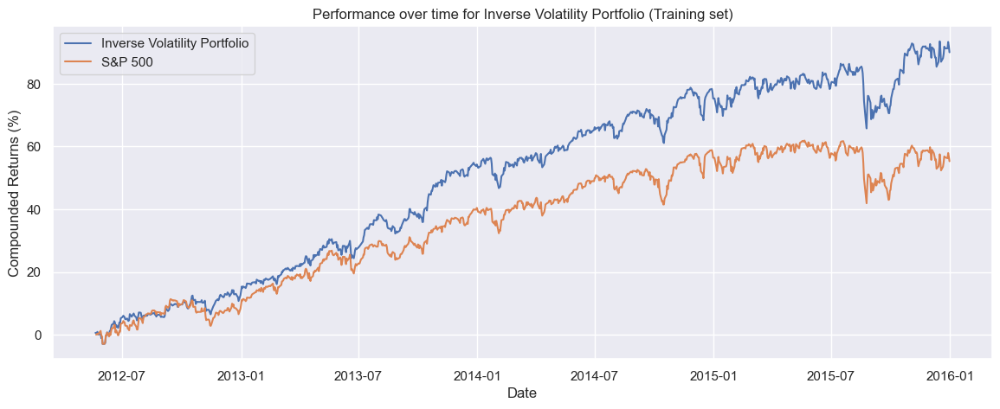

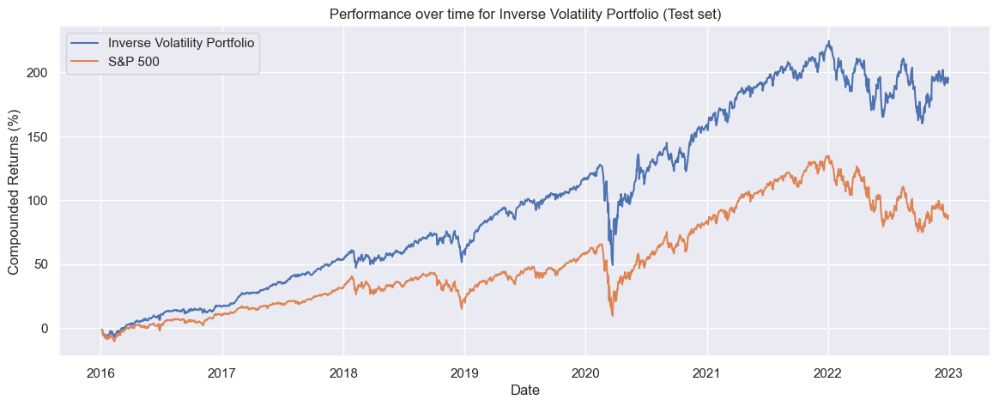

In [33]:
w_ivp = ivp_weights()
plot_weights(w_ivp, "Inverse Volatility Portfolio")
plot_overall_performance(w_ivp, "Inverse Volatility Portfolio")

### Pré - 5. Mostrar gráfico com todas as estratégias e a performance cumulativa num só plot

In [34]:
#TODO

### Pré- 5. Passo extra não no enunciado: testar via Empyrial performance com rebalancing a cada trimestre

In [35]:
#TODO

### 5. Critically discuss the results considering alternative risk-adjusted performance metrics (e.g., returns, volatility, Sharpe ratio, Sterling ratio, drawdown).

In [36]:
def annualized_portfolio_return(returns, weights):
  rp = weights.T @ returns.mean()
  return rp * 252

def annualized_portfolio_volatility(returns, weights):
  return np.sqrt(weights.T @ returns.cov() @ weights) * np.sqrt(252)

def annualized_portfolio_performance(returns, weights):
  return annualized_portfolio_volatility(returns, weights), annualized_portfolio_return(returns, weights)

In [37]:
RANDOM_PORTFOLIOS = 10000

def generate_random_weights():
    w = np.random.random(len(stocks))
    return w/np.sum(w)

w_randoms = [generate_random_weights() for _ in range(RANDOM_PORTFOLIOS)]

In [38]:
def plot_efficient_frontier(training_data_flag=True):
    fig, ax = plt.subplots()

    returns = training_dataset if training_data_flag else test_dataset

    # Plot portfolios random
    for w in w_randoms:
        annualized_vol, annualized_return = annualized_portfolio_performance(returns, w)
        ax.scatter(annualized_vol, annualized_return, marker='o', color='grey')
    
    for i in range(len(stocks)):
        weights = portfolios_bnh[i]
        strategy_name = f"B&H {stocks[i]}"
        annualized_vol, annualized_return = annualized_portfolio_performance(returns, weights)
        ax.scatter(annualized_vol, annualized_return, marker='o', c=np.random.rand(3,), label=strategy_name)

    # Plot EWP
    ewp_vol, ewp_ret = annualized_portfolio_performance(returns, w_ewp)
    ax.scatter(ewp_vol, ewp_ret, marker='*', color='blue', label="EWP")

    # Plot Quintile
    quint_vol, quint_ret = annualized_portfolio_performance(returns, w_quintile)
    ax.scatter(quint_vol, quint_ret, marker='*', color='purple', label="Quintile (μ/σ)")

    # Plot MVP
    for risk_aversion, curr_w_mvp in w_mvp.items():
        mvp_vol, mvp_ret = annualized_portfolio_performance(returns, curr_w_mvp)
        ax.scatter(mvp_vol, mvp_ret, marker='*', c=np.random.rand(3,), label=f"MVP (λ={risk_aversion})")

    # Plot GMVP
    gmvp_vol, gmvp_ret = annualized_portfolio_performance(returns, w_gmvp)
    ax.scatter(gmvp_vol, gmvp_ret, marker='*', color='green', label="GMVP")

    # Plot MSRP
    msrp_vol, msrp_ret = annualized_portfolio_performance(returns, w_msrp)
    ax.scatter(msrp_vol, msrp_ret, marker='*', color='red', label="MSRP")

    # Plot IVP
    ivp_vol, ivp_ret = annualized_portfolio_performance(returns, w_ivp)
    ax.scatter(ivp_vol, ivp_ret, marker='*', color='pink', label="IVP")

    ax.set_title(f"Efficient Frontier with random portfolios ({'Training set' if training_data_flag else 'Test set'} results)")
    ax.set_xlabel('Expected annualized volatility (Risk)')
    ax.set_ylabel('Expected annualized mean return')
    ax.legend()
    plt.show()



*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

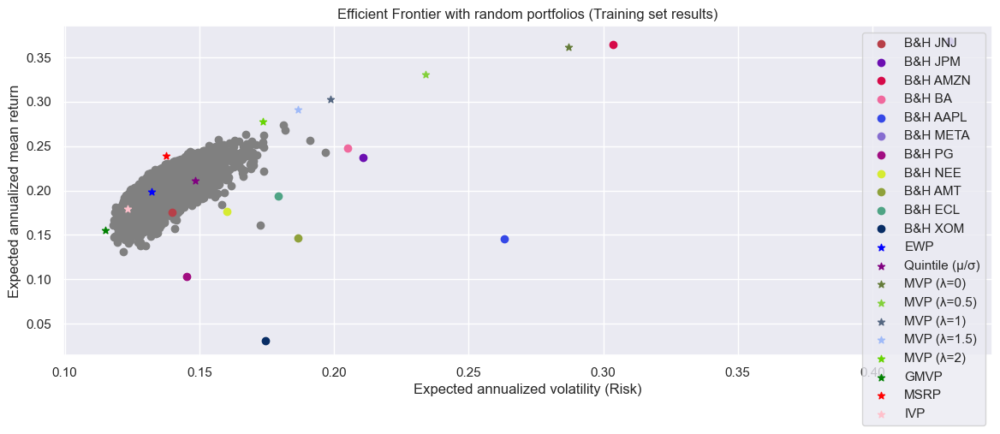

In [39]:
plot_efficient_frontier(training_data_flag=True)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

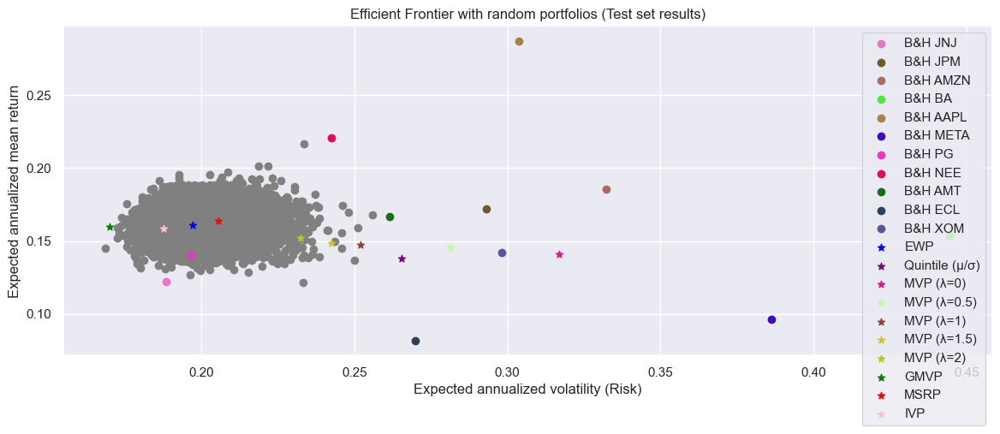

In [40]:
plot_efficient_frontier(training_data_flag=False)

In [41]:
#Calcular volatilidade média e retorno médio (tudo anualizado) para portfolios aleatórios
bt_randoms = np.zeros((RANDOM_PORTFOLIOS, 2))
for i in range(0, RANDOM_PORTFOLIOS):
    w_random = w_randoms[i]
    bt_randoms[i] = np.array(annualized_portfolio_performance(test_dataset, w_random))
avg_random_vol, avg_random_ret = bt_randoms.mean(axis=0)

In [42]:
%pip install quantstats


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [43]:
import quantstats as qs

def sharpe_ratio(returns, weights, rf_rate=0):
    vol, ret = annualized_portfolio_performance(returns, weights)
    return (ret-rf_rate)/vol

def sortino_ratio(returns, weights, rf_rate=0):
    return qs.stats.sortino( (returns*weights).sum(axis=1) )

def sterling_ratio(returns, weights):

    """
    If the drawdown is put in as a negative number, 
        then subtract the 10%, and then multiply the whole thing by a negative to result in a positive ratio.
    If the drawdown is put in as a positive number, 
        then add 10% and the result is the same positive ratio.
    """
    drawdown = max_drawdown(returns, weights)
    if drawdown < 0:
        drawdown -= 0.1
        drawdown *= -1
    else:
        drawdown += 0.1

    return annualized_portfolio_performance(returns, weights)[1]/drawdown

def calmar_ratio(returns, weights):
    return qs.stats.calmar( (returns*weights).sum(axis=1) )

#Multiplicar por 100... Se -100% perde-se o investimento todo
def max_drawdown(returns, weights):
    return qs.stats.max_drawdown((returns*weights).sum(axis=1))

def diversification_ratio(returns, weights):
    sigma = np.sqrt(np.diag(returns.cov() * 252))
    port_vol = annualized_portfolio_volatility(returns, weights)
    return (weights.T @ sigma)/port_vol

def absolute_risk_contributions(returns, weights):
    port_vol = annualized_portfolio_volatility(returns, weights)
    risk_contrib = ((returns.cov() @ weights) * 252 * weights)
    return risk_contrib/port_vol

def relative_risk_contributions(returns, weights):
    abs_risk_contrib = absolute_risk_contributions(returns, weights)
    return abs_risk_contrib/np.sum(abs_risk_contrib)

In [44]:
#tuple array -> 0: weights; 1: strat name
quant_portfolio_info = list( zip(portfolios_bnh, map(lambda stock_name: f"B&H {stock_name}", stocks)) )
quant_portfolio_info.append((w_ewp, "EWP"))
quant_portfolio_info.append((w_quintile, "Quintile"))
quant_portfolio_info += list(zip(w_mvp.values(), map(lambda l: f"MVP (λ={str(l)})", w_mvp.keys())))
quant_portfolio_info.append((w_gmvp, "GMVP"))
quant_portfolio_info.append((w_msrp, "MSRP"))
quant_portfolio_info.append((w_ivp, "IVP"))


In [45]:
quant_portfolio_info_strat_names = [strat for _, strat in quant_portfolio_info]
quant_portfolio_info_strat_weights = [w for w, _ in quant_portfolio_info]

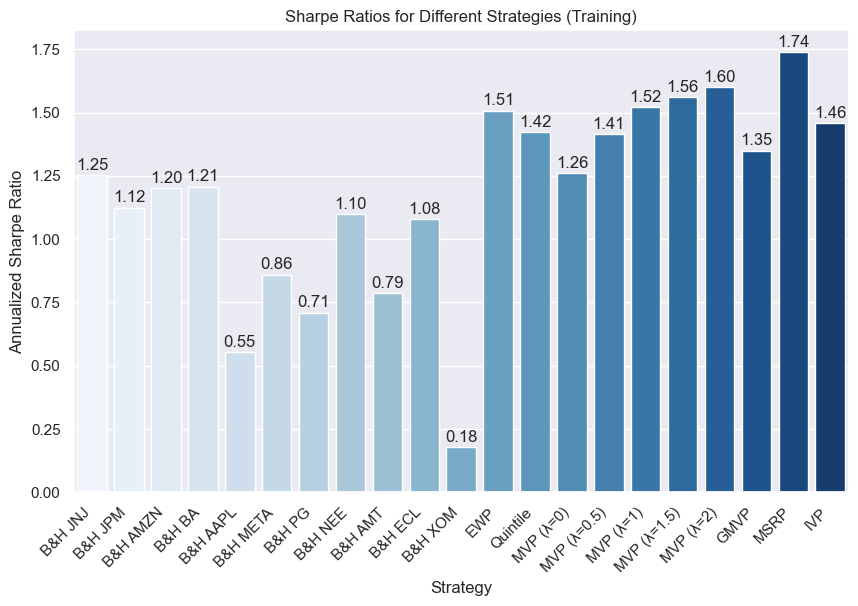

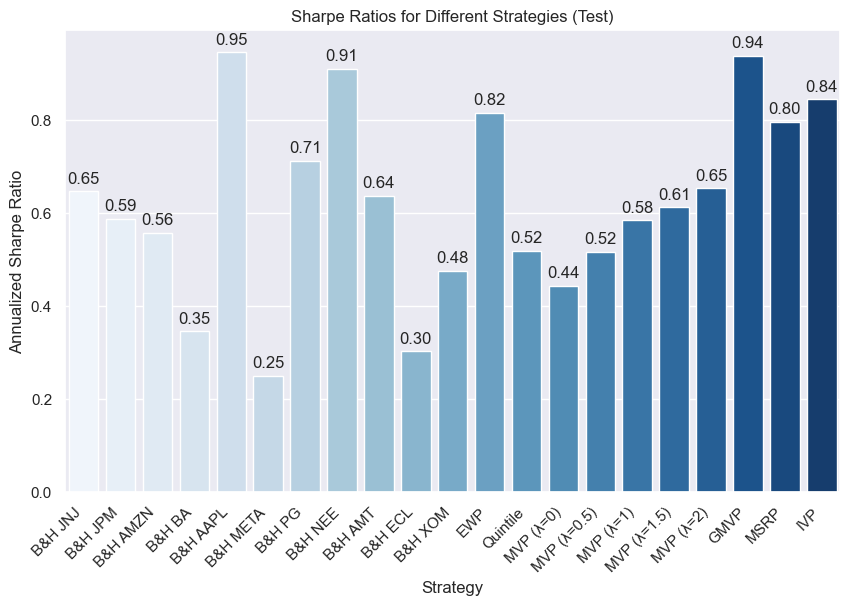

In [46]:
for returns_df_type, returns_df in [("Training", training_dataset), ("Test", test_dataset)]:
    quant_portfolio_sharpe = [sharpe_ratio(returns_df, w) for w in quant_portfolio_info_strat_weights]

    plt.figure(figsize=(10, 6))
    sns.barplot(x=quant_portfolio_info_strat_names, y=quant_portfolio_sharpe, palette="Blues")
    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Strategy")
    plt.ylabel("Annualized Sharpe Ratio")
    plt.title(f"Sharpe Ratios for Different Strategies ({returns_df_type})")
    
    for i, v in enumerate(quant_portfolio_sharpe):
        plt.text(i, v + 0.01, f"{v:.2f}", ha="center", va="bottom")

    plt.show()

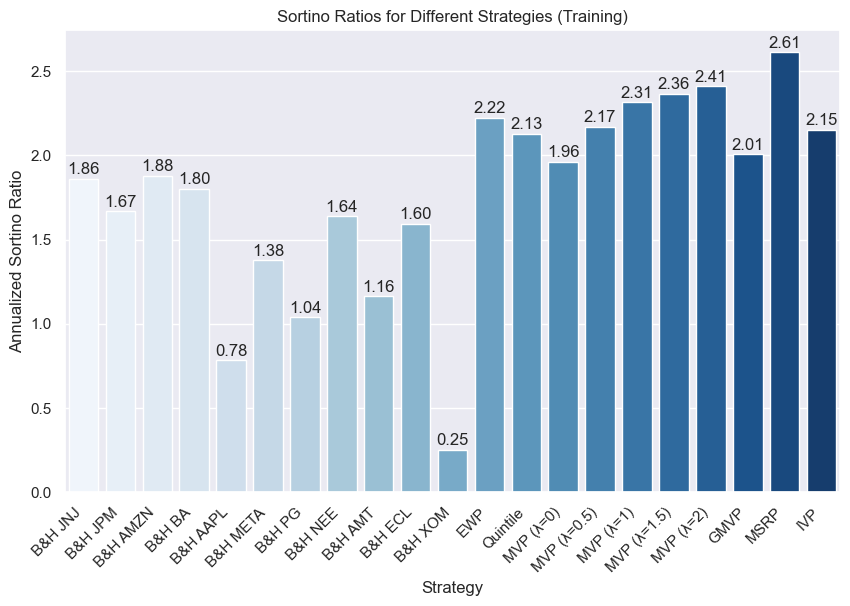

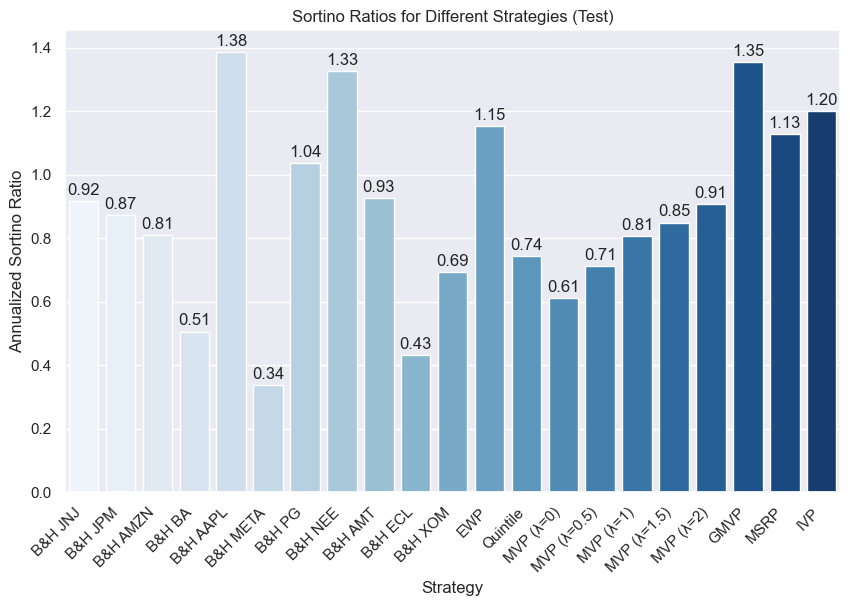

In [47]:
for returns_df_type, returns_df in [("Training", training_dataset), ("Test", test_dataset)]:
    quant_portfolio_sortino = [sortino_ratio(returns_df, w) for w in quant_portfolio_info_strat_weights]

    plt.figure(figsize=(10, 6))
    sns.barplot(x=quant_portfolio_info_strat_names, y=quant_portfolio_sortino, palette="Blues")
    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Strategy")
    plt.ylabel("Annualized Sortino Ratio")
    plt.title(f"Sortino Ratios for Different Strategies ({returns_df_type})")
    
    for i, v in enumerate(quant_portfolio_sortino):
        plt.text(i, v + 0.01, f"{v:.2f}", ha="center", va="bottom")

    plt.show()

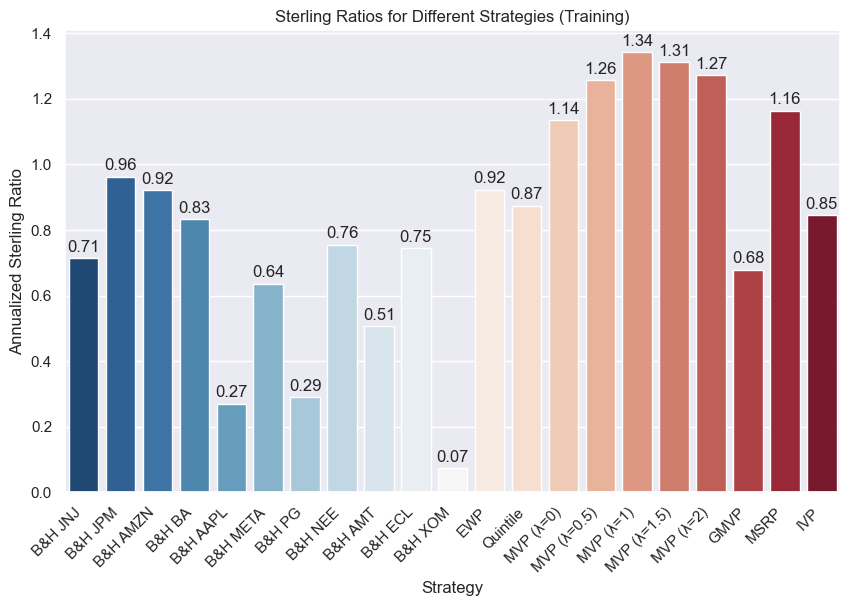

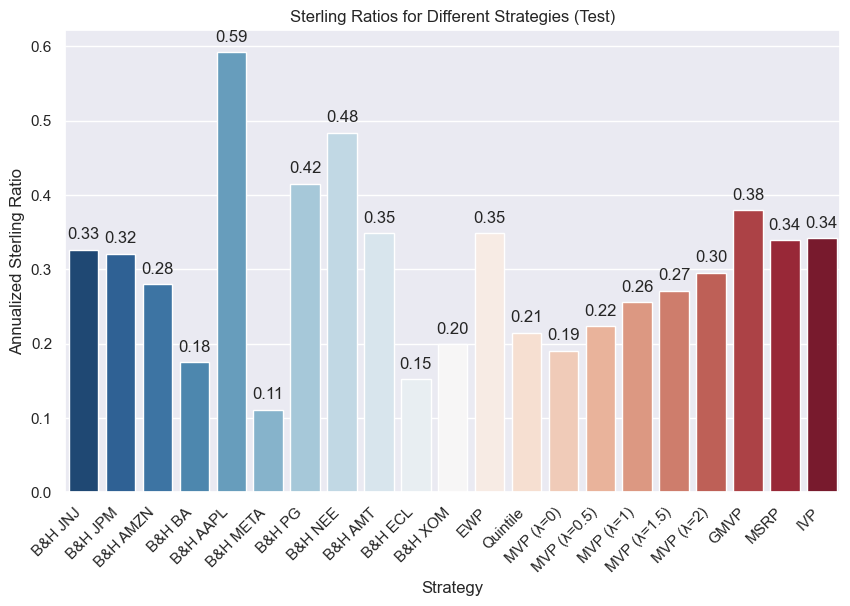

In [48]:
for returns_df_type, returns_df in [("Training", training_dataset), ("Test", test_dataset)]:
    quant_portfolio_sterling = [sterling_ratio(returns_df, w) for w in quant_portfolio_info_strat_weights]

    plt.figure(figsize=(10, 6))
    sns.barplot(x=quant_portfolio_info_strat_names, y=quant_portfolio_sterling, palette="RdBu_r")  # Use a diverging palette
    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Strategy")
    plt.ylabel("Annualized Sterling Ratio")
    plt.title(f"Sterling Ratios for Different Strategies ({returns_df_type})")
    
    for i, v in enumerate(quant_portfolio_sterling):
        plt.text(i, v + 0.01, f"{v:.2f}", ha="center", va="bottom")

    plt.show()


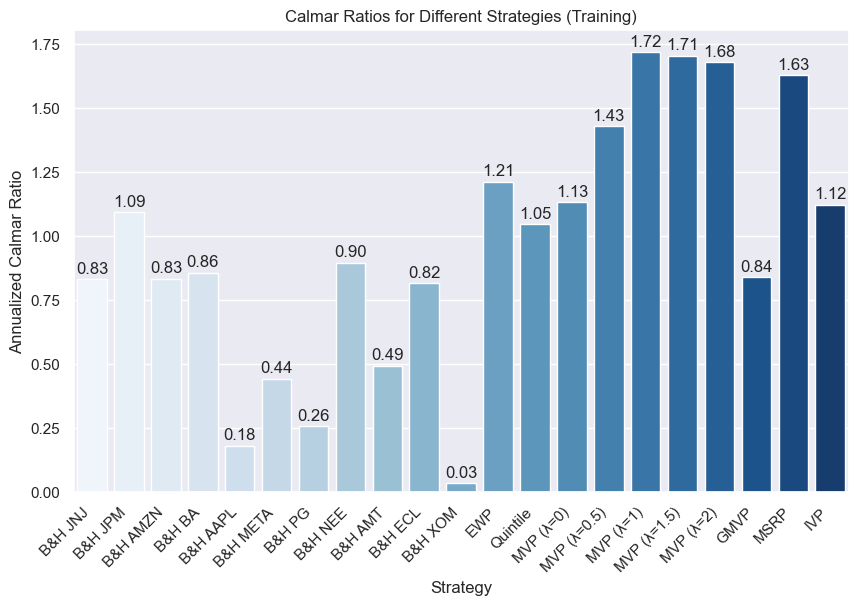

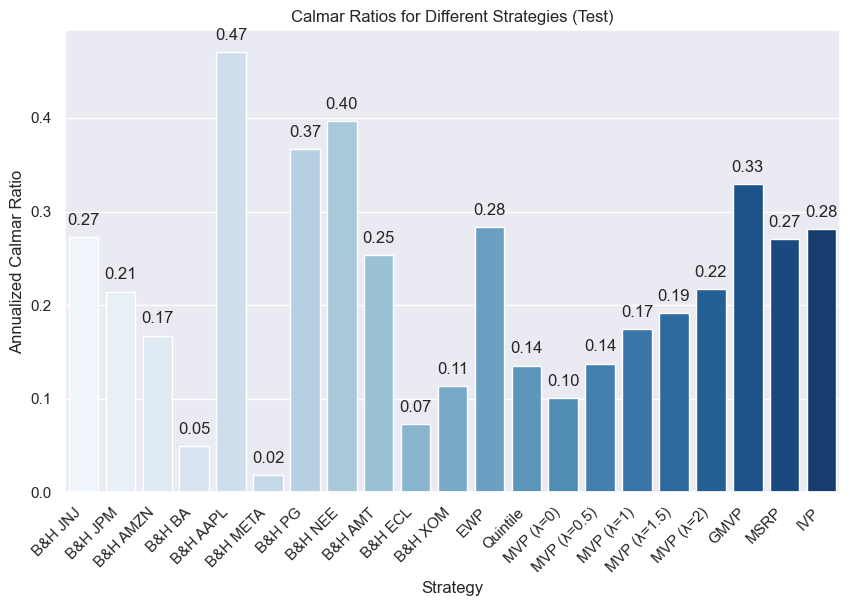

In [49]:
for returns_df_type, returns_df in [("Training", training_dataset), ("Test", test_dataset)]:
    quant_portfolio_calmar = [calmar_ratio(returns_df, w) for w in quant_portfolio_info_strat_weights]

    plt.figure(figsize=(10, 6))
    sns.barplot(x=quant_portfolio_info_strat_names, y=quant_portfolio_calmar, palette="Blues")
    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Strategy")
    plt.ylabel("Annualized Calmar Ratio")
    plt.title(f"Calmar Ratios for Different Strategies ({returns_df_type})")
    
    for i, v in enumerate(quant_portfolio_calmar):
        plt.text(i, v + 0.01, f"{v:.2f}", ha="center", va="bottom")

    plt.show()

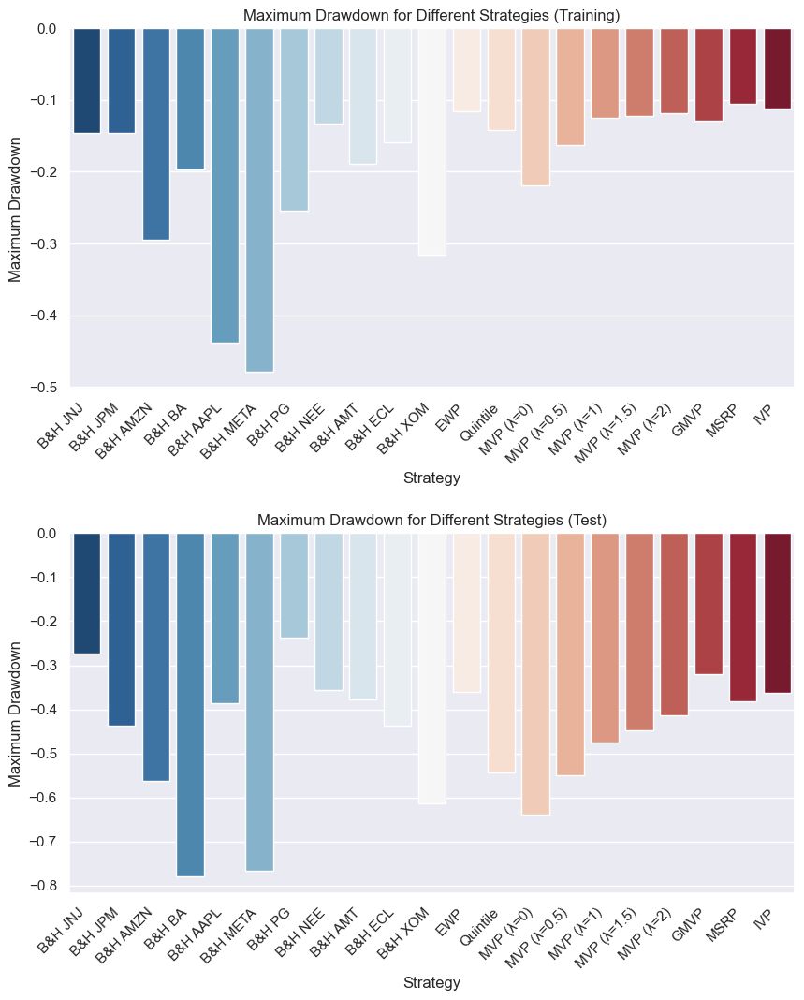

In [50]:
quant_portfolio_max_dd_training = [max_drawdown(training_dataset, w) for w in quant_portfolio_info_strat_weights]
quant_portfolio_max_dd_test = [max_drawdown(test_dataset, w) for w in quant_portfolio_info_strat_weights]

# Create subplots for training and test datasets
fig, axes = plt.subplots(nrows=2, figsize=(10, 12))
plt.subplots_adjust(hspace=0.4)

# Plot maximum drawdown for training dataset
sns.barplot(x=quant_portfolio_info_strat_names, y=quant_portfolio_max_dd_training, palette="RdBu_r", ax=axes[0])
axes[0].set_xticklabels(quant_portfolio_info_strat_names, rotation=45, ha="right")
axes[0].set_xlabel("Strategy")
axes[0].set_ylabel("Maximum Drawdown")
axes[0].set_title(f"Maximum Drawdown for Different Strategies (Training)")

# Plot maximum drawdown for test dataset
sns.barplot(x=quant_portfolio_info_strat_names, y=quant_portfolio_max_dd_test, palette="RdBu_r", ax=axes[1])
axes[1].set_xticklabels(quant_portfolio_info_strat_names, rotation=45, ha="right")
axes[1].set_xlabel("Strategy")
axes[1].set_ylabel("Maximum Drawdown")
axes[1].set_title("Maximum Drawdown for Different Strategies (Test)")

# Show the plots
plt.show()

[*********************100%%**********************]  1 of 1 completed


<AxesSubplot:title={'center':'VIX during test set portion'}, xlabel='Date', ylabel='Closing price'>

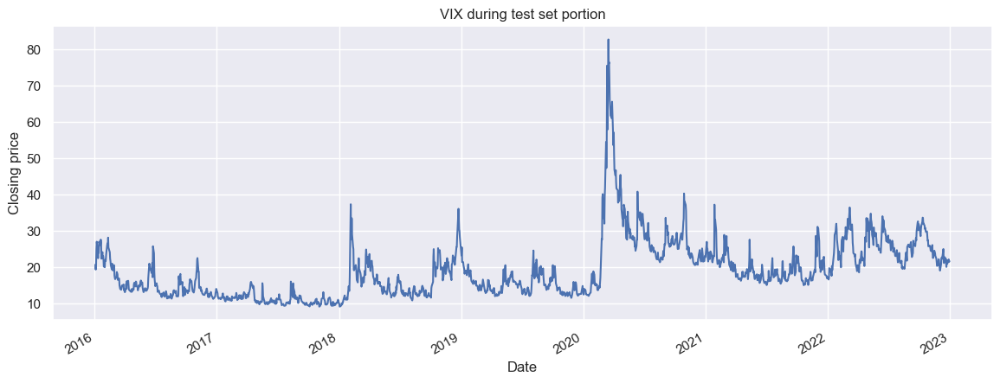

In [51]:
vix_close_prices = yf.download("^VIX", start=test_start_date, end=test_end_date)['Adj Close']
vix_close_prices.plot(title="VIX during test set portion", ylabel="Closing price")

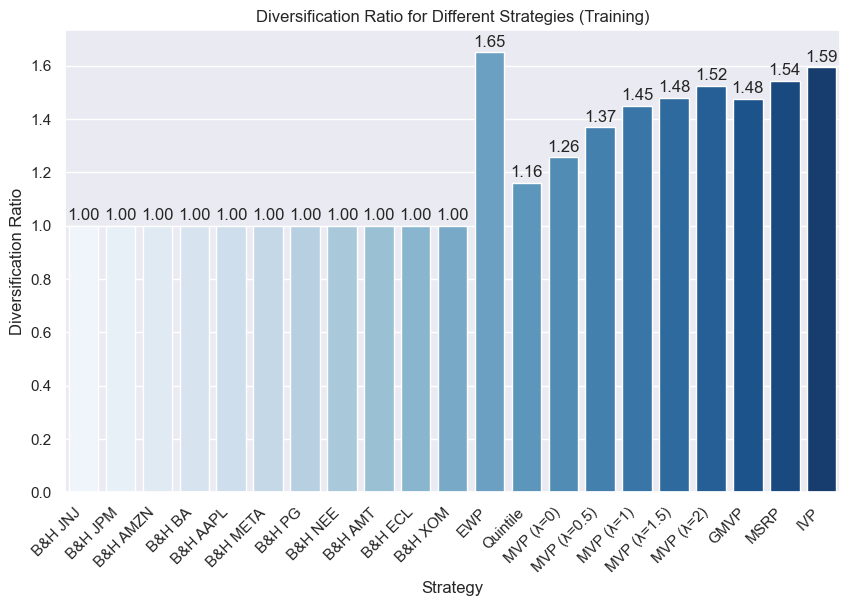

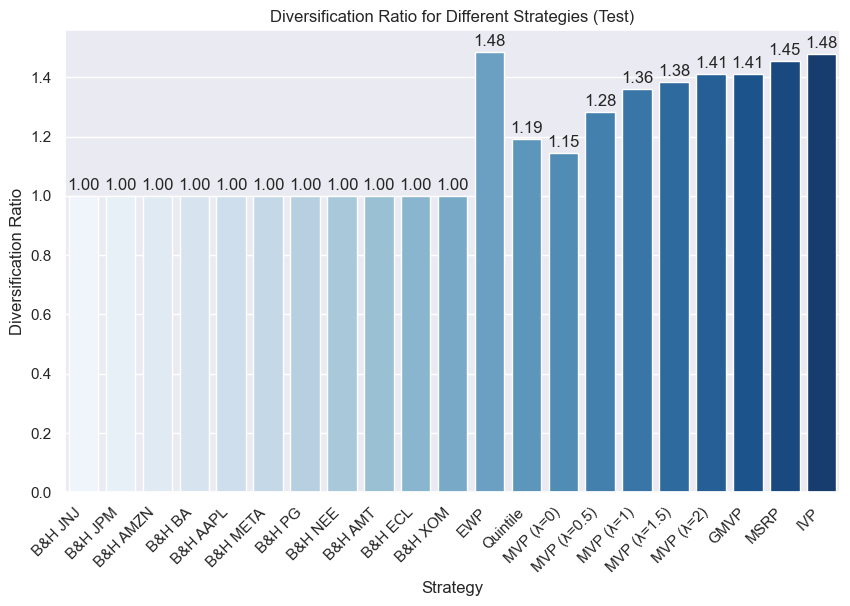

In [52]:
for returns_df_type, returns_df in [("Training", training_dataset), ("Test", test_dataset)]:
    quant_portfolio_div_ratio = [diversification_ratio(returns_df, w) for w in quant_portfolio_info_strat_weights]

    plt.figure(figsize=(10, 6))
    sns.barplot(x=quant_portfolio_info_strat_names, y=quant_portfolio_div_ratio, palette="Blues")
    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Strategy")
    plt.ylabel("Diversification Ratio")
    plt.title(f"Diversification Ratio for Different Strategies ({returns_df_type})")
    
    for i, v in enumerate(quant_portfolio_div_ratio):
        plt.text(i, v + 0.01, f"{v:.2f}", ha="center", va="bottom")

    plt.show()

In [53]:
quant_portfolio_info_strat_names[len(portfolios_bnh):]

['EWP',
 'Quintile',
 'MVP (λ=0)',
 'MVP (λ=0.5)',
 'MVP (λ=1)',
 'MVP (λ=1.5)',
 'MVP (λ=2)',
 'GMVP',
 'MSRP',
 'IVP']

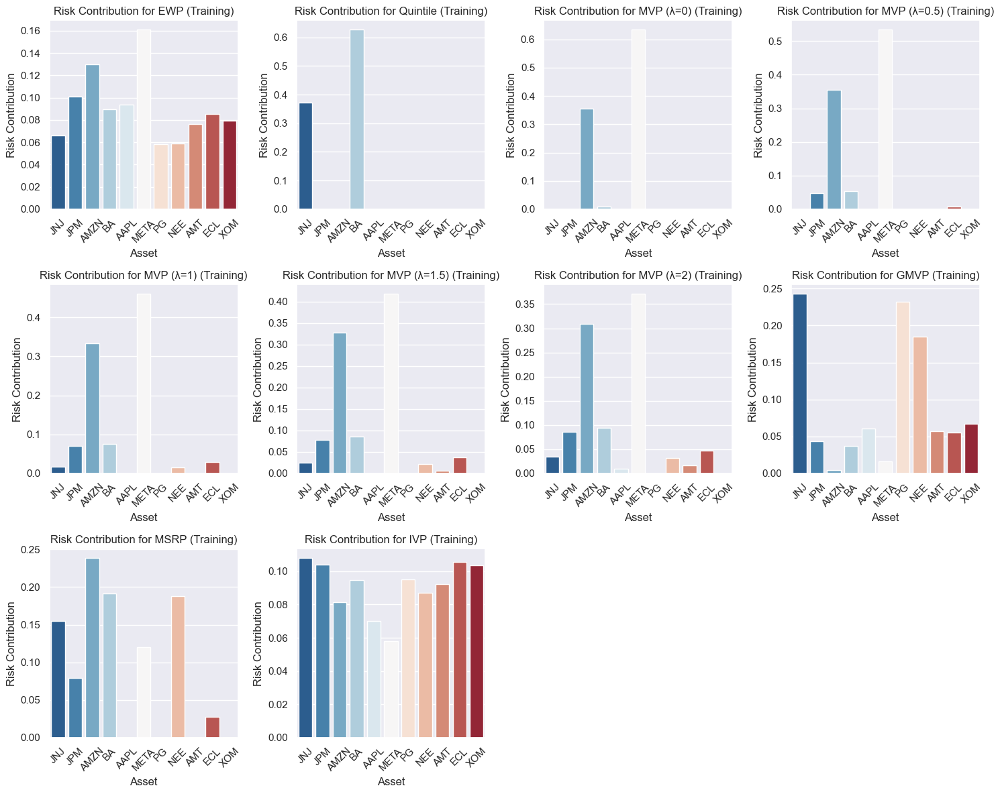

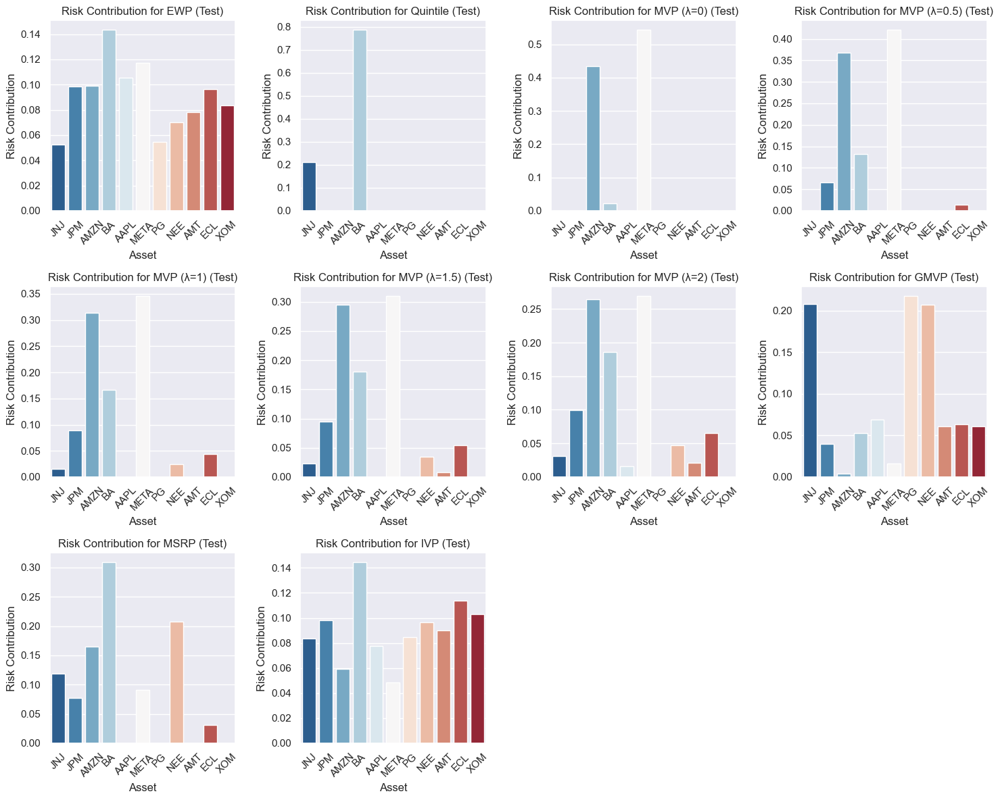

In [54]:
for returns_df_type, returns_df in [("Training", training_dataset), ("Test", test_dataset)]:
    #Ignore B&H portfolios
    quant_portfolio_relative_risk_contrib = [relative_risk_contributions(returns_df, w) for w in quant_portfolio_info_strat_weights][len(portfolios_bnh):]
    
    # Set the number of mini plots per row
    plots_per_row = 4
    num_strategies = len(quant_portfolio_info_strat_names[len(portfolios_bnh):])

    # Calculate the number of rows needed for subplots
    num_rows = (num_strategies - 1) // plots_per_row + 1

    # Create a single figure with subplots
    fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(15, 4 * num_rows))
    plt.subplots_adjust(hspace=0.6)

    for i, strat_name in enumerate(quant_portfolio_info_strat_names[len(portfolios_bnh):]):
        row = i // plots_per_row
        col = i % plots_per_row

        # Extract data for the current strategy
        data = quant_portfolio_relative_risk_contrib[i].reset_index()

        # Create a mini bar plot in the corresponding subplot
        sns.barplot(data=data, x="index", y=0, palette="RdBu_r", ax=axes[row, col])
        axes[row, col].set_xlabel("Asset")
        axes[row, col].set_ylabel("Risk Contribution")
        axes[row, col].set_title(f"Risk Contribution for {strat_name} ({returns_df_type})")
        axes[row, col].tick_params(axis="x", rotation=45, labelright=True)

    # Remove any empty subplots
    for i in range(len(quant_portfolio_info_strat_names[len(portfolios_bnh):]), num_rows * plots_per_row):
        fig.delaxes(axes[i // plots_per_row, i % plots_per_row])

    plt.tight_layout()
    plt.show()

### 6. Extra points: Use the same data set to investigate the performance of portfolio management strategies using alternative risk measures, e.g., downside risk, Value-at-Risk (VaR), Conditional VaR (CVaR) or expected shortfall (ES).


In [91]:
from scipy.stats import norm

def portfolio_var(returns, weights, alpha=0.05):
    portfolio_returns = weights @ returns.T
    mu, sigma = portfolio_returns.mean() * 252, portfolio_returns.std() * np.sqrt(252)
    return 1 - norm.ppf(alpha, 1+mu, sigma)


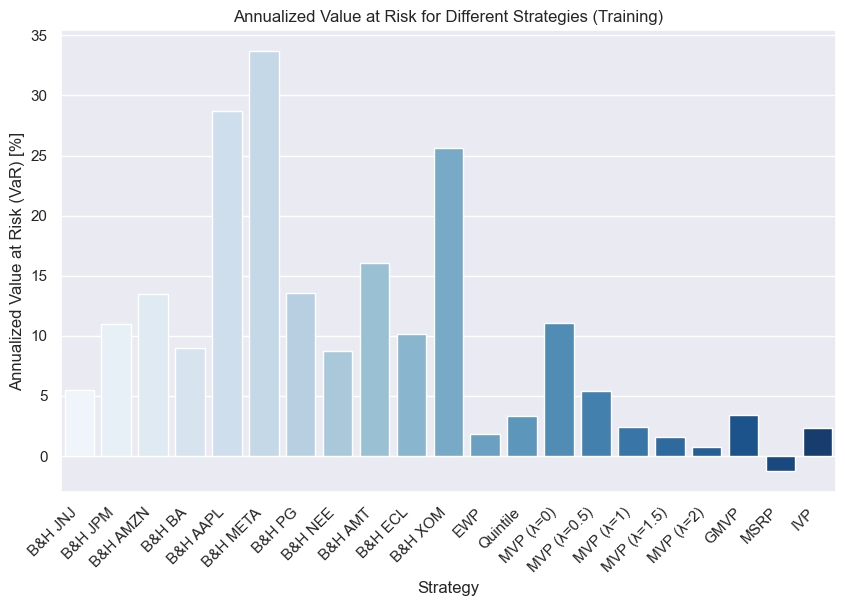

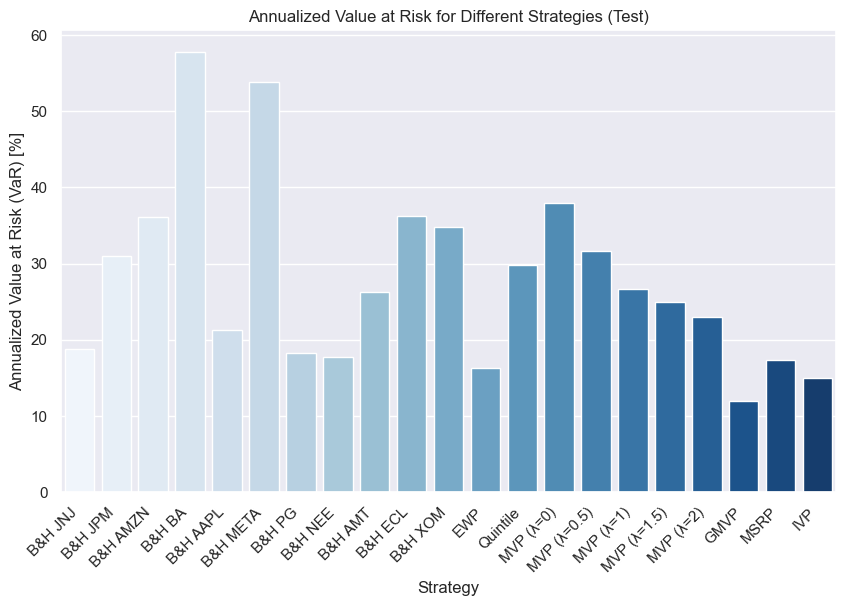

In [92]:
for returns_df_type, returns_df in [("Training", training_dataset), ("Test", test_dataset)]:
    quant_portfolio_var = [portfolio_var(returns_df, w) for w in quant_portfolio_info_strat_weights]

    plt.figure(figsize=(10, 6))
    sns.barplot(x=quant_portfolio_info_strat_names, y=np.array(quant_portfolio_var)*100, palette="Blues")
    plt.xticks(rotation=45, ha="right")
    plt.xlabel("Strategy")
    plt.ylabel("Annualized Value at Risk (VaR) [%]")
    plt.title(f"Annualized Value at Risk for Different Strategies ({returns_df_type})")

    #Percentagens negativas -> probabilidade de lucrar

    plt.show()

In [93]:
def var_min_weights(alpha=0.05):

    def compute_var(w):
        return portfolio_var(training_dataset, w, alpha)

    number_of_assets = len(stocks)
    st = [{'type': 'eq', 'fun': lambda w: np.sum(w) - 1}]
    weight_range = [(0,1)] * number_of_assets

    results = minimize(
        compute_var,
        x0 = np.ones(number_of_assets)/number_of_assets,
        bounds=weight_range,
        constraints=st
    )

    return np.array(results.x)

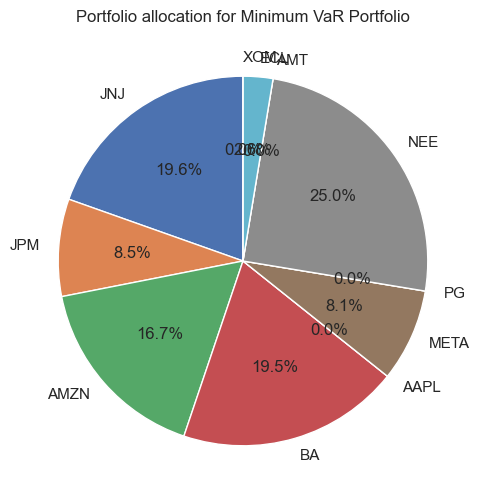

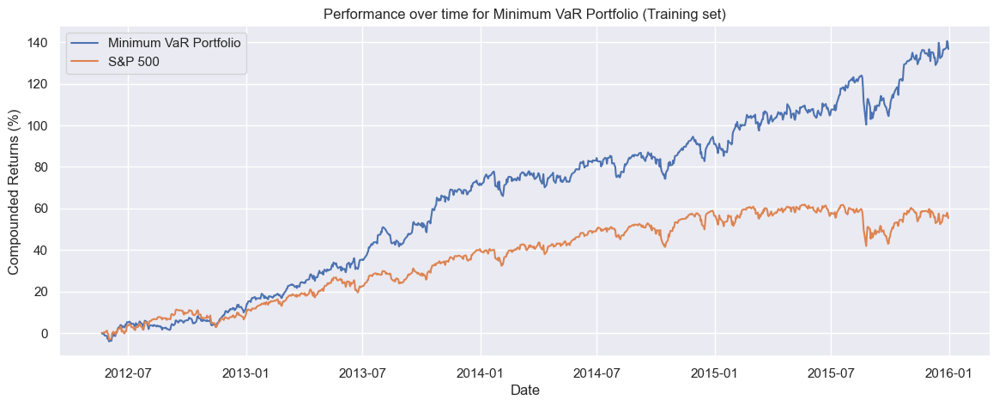

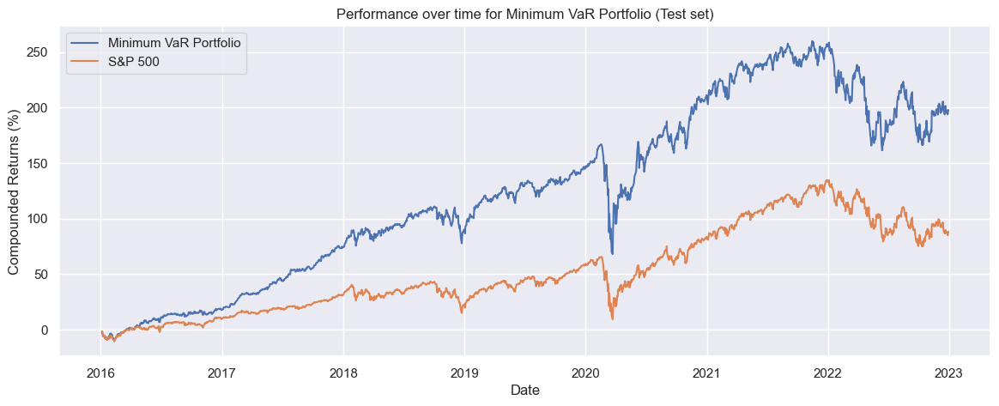

In [98]:
w_var_min = var_min_weights(0.05)
plot_weights(w_var_min, "Minimum VaR Portfolio")
plot_overall_performance(w_var_min, "Minimum VaR Portfolio")

In [99]:
portfolio_var(training_dataset, w_var_min)

-0.012873825037535314

In [100]:
portfolio_var(test_dataset, w_var_min)

0.1786103404556263

In [102]:
print("Sharpe Ratio (Training) VaR: ", sharpe_ratio(training_dataset, w_var_min))
print("Sharpe Ratio (Testing) VaR: ", sharpe_ratio(test_dataset, w_var_min))

Sharpe Ratio (Training) VaR:  1.7370035727364013
Sharpe Ratio (Testing) VaR:  0.7890491632151615
